In [1]:
import symlib

# sim_dir is the location of a single halo. We'll talk about
# auto-generating this later, but if you downloaded "Halo933"
# in the suite "SymphonyLMC" to the directory "data/", this
# would be "data/SymphonyLMC/Halo933"
sim_dir = "/Users/roxannelai/data/SymphonyLMC/Halo933"

params = symlib.simulation_parameters(sim_dir)
print(params)

{'flat': True, 'H0': 70.0, 'Om0': 0.286, 'Ob0': 0.049, 'sigma8': 0.82, 'ns': 0.95, 'eps': 0.08, 'mp': 35247.6, 'h100': 0.7}


In [3]:
import symlib
import matplotlib.pyplot as plt
import numpy as np

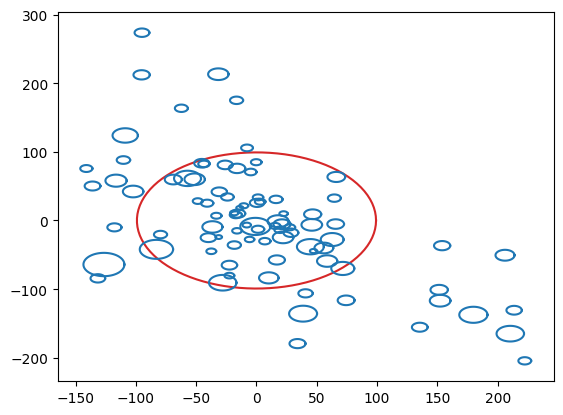

In [4]:
fig, ax = plt.subplots()
sim_dir = "/Users/roxannelai/data/SymphonyLMC/SymphonyLMC/Halo933"
r, hist = symlib.read_rockstar(sim_dir)

host = r[0,-1] # First halo, last snapshot.
symlib.plot_circle(ax, host["x"][0], host["x"][1],
                   host["rvir"], c="tab:red")

for i in range(1, len(r)):
    sub = r[i,-1] # i-th halo, last snapshot.
    if not sub["ok"]: continue
    symlib.plot_circle(
        ax, sub["x"][0], sub["x"][1],
        sub["rvir"], c="tab:blue")


plt.show()

In [ ]:
fig, ax = plt.subplots()
sim_dir = "/Users/roxannelai/data/SymphonyLMC/Halo933/SymphonyLCluster/Halo_004"
r, hist = symlib.read_rockstar(sim_dir)

host = r[0,-1] # First halo, last snapshot.
symlib.plot_circle(ax, host["x"][0], host["x"][1],
                   host["rvir"], c="tab:red")

for i in range(1, len(r)):
    sub = r[i,-1] # i-th halo, last snapshot.
    if not sub["ok"]: continue
    symlib.plot_circle(
        ax, sub["x"][0], sub["x"][1],
        sub["rvir"], c="tab:blue")


plt.show()

In [5]:
import numpy as np

Text(0, 0.5, '$N(>M_{\\rm sub,peak})$')

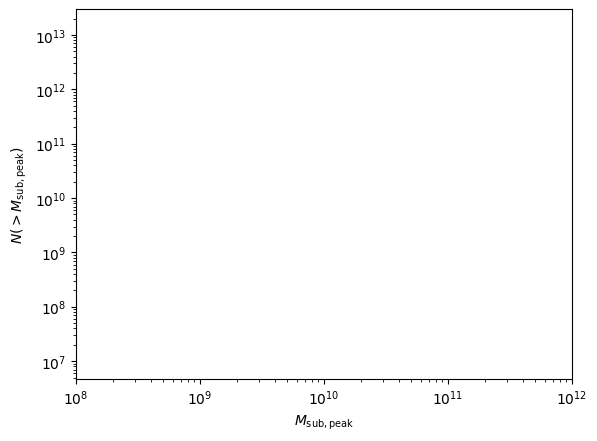

In [8]:
# sim_dir = "path/to/ExampleHalo"
sim_dir = "/Users/roxannelai/data/SymphonyGroup/Halo015"
# "/Users/roxannelai/data/SymphonyLMC/Halo933/SymphonyLCluster/Halo_004"

scale = symlib.scale_factors(sim_dir)
s, hist = symlib.read_symfind(sim_dir)
r, _ = symlib.read_rockstar(sim_dir)

fig, ax = plt.subplots()
colors = ["tab:red", "tab:orange", "tab:green",
          "tab:blue", "tab:purple"]

# First, plot the host
ok = r[0,:]["ok"]
ax.plot(scale[ok], r[0,ok]["m"], c="k")

# For now, let's only plot minor mergers which dirupt before
# the end of the simulation in the Rockstar catalogue.
is_target = (hist["merger_ratio"] < 0.1) & (~r["ok"][:,-1])
targets = np.where(is_target)[0][:5]
for i_color, i in enumerate(targets):
    # Plot the mass history of the rockstar subhalo
    ok = r[i,:]["ok"]
    ax.plot(scale[ok], r[i,ok]["m"], c=colors[i_color])
    # Plot the mass history of the symfind subhalo
    ok = s[i,:]["ok"]
    ax.plot(scale[ok], s[i,ok]["m"], c=colors[i_color], lw=1.5)


'''
""" positions.py plots a host halo and its subhalos as circles.
"""

# Import a library that makes plots prettier, if it's downloaded.
try:
    import palette
    palette.configure(True)
except:
    pass

def main():
    # Get file locations.
    base_dir = "/Users/roxannelai/data/SymphonyGroup/Halo015"
    # "/oak/stanford/orgs/kipac/users/phil1/simulations/ZoomIns/"
    suite = "SymphonyMilkyWay"

    fig, ax = plt.subplots()
    
    # Set up histogram bins
    param = symlib.simulation_parameters(suite)
    m_min = param["mp"]/param["h100"]*300
    m_max = 1e12 
    n_bins = 200
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins+1)

    # Set up cumulative histograms for mass functions
    N_infall = np.zeros(n_bins)
    N_splashback = np.zeros(n_bins)
    N_vir = np.zeros(n_bins)

    n_hosts = symlib.n_hosts(suite)
    for halo_num in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite, halo_num)

        # Read in simulation data.
        h, hist = symlib.read_subhalos(sim_dir)

        # All suriving subhalos which are currently within Rvir of the host.
        r = np.sqrt(np.sum(h["x"][:,-1]**2, axis=1)) # z=0 distance to the host
        host_rvir = h["rvir"][0,-1]
        ok = h["ok"][:,-1] & (r < host_rvir)
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
        
        # Add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

    # plot
    left_bins = bins[:-1]
    plt.plot(left_bins, N_vir, c="tab:blue")

    # Some additional plotting code to make things look nice.
    ax.set_xlim(1e8, 1e12)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$M_{\rm sub,peak}$")
    ax.set_ylabel(r"$N(>M_{\rm sub,peak})$")
    fig.savefig("plots/mass_func.png")

if __name__ == "__main__": main()
'''
'''
# plot
left_bins = bins[:-1]
plt.plot(left_bins, N_vir, c="tab:blue")
'''
# Some additional plotting code to make things look nice.
ax.set_xlim(1e8, 1e12)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel(r"$M_{\rm sub,peak}$")
ax.set_ylabel(r"$N(>M_{\rm sub,peak})$")
# fig.savefig("plots/mass_func.png")



Text(0, 0.5, 'm(t)')

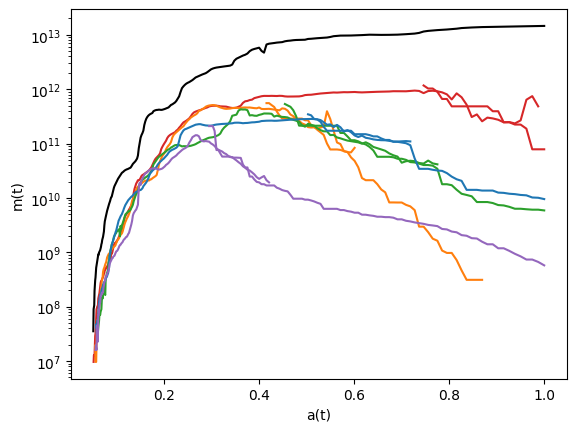

In [10]:
# sim_dir = "path/to/ExampleHalo"

sim_dir = "/Users/roxannelai/data/SymphonyGroup/Halo015"

scale = symlib.scale_factors(sim_dir)
s, hist = symlib.read_symfind(sim_dir)
r, _ = symlib.read_rockstar(sim_dir)

fig, ax = plt.subplots()
colors = ["tab:red", "tab:orange", "tab:green",
          "tab:blue", "tab:purple"]

# First, plot the host
ok = r[0,:]["ok"]
ax.plot(scale[ok], r[0,ok]["m"], c="k")

# For now, let's only plot minor mergers which dirupt before
# the end of the simulation in the Rockstar catalogue.
is_target = (hist["merger_ratio"] < 0.1) & (~r["ok"][:,-1])
targets = np.where(is_target)[0][:5]
for i_color, i in enumerate(targets):
    # Plot the mass history of the rockstar subhalo
    ok = r[i,:]["ok"]
    ax.plot(scale[ok], r[i,ok]["m"], c=colors[i_color])
    # Plot the mass history of the symfind subhalo
    ok = s[i,:]["ok"]
    ax.plot(scale[ok], s[i,ok]["m"], c=colors[i_color], lw=1.5)

# want to make it a log scale on the y axis, like in the tutorial 

#ax.set_xlim(1e8, 1e12)
# ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel("a(t)")
ax.set_ylabel("m(t)")

Text(0, 0.5, 'm(t)')

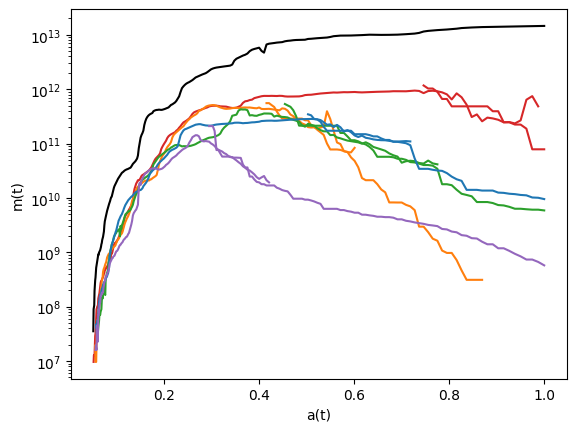

In [12]:
# rearranged stuff in my directory so hopefully it should be easier to call
# think i messed up stuff earlier so it made it weird to call



# sim_dir = "path/to/ExampleHalo"
sim_dir = "/Users/roxannelai/data/SymphonyGroup/Halo015"
# sim_dir = "/Users/roxannelai/data/SymphonyLMC/Halo933/SymphonyLCluster/Halo_004"

scale = symlib.scale_factors(sim_dir)
s, hist = symlib.read_symfind(sim_dir)
r, _ = symlib.read_rockstar(sim_dir)

fig, ax = plt.subplots()
colors = ["tab:red", "tab:orange", "tab:green",
          "tab:blue", "tab:purple"]

# First, plot the host
ok = r[0,:]["ok"]
ax.plot(scale[ok], r[0,ok]["m"], c="k")

# For now, let's only plot minor mergers which dirupt before
# the end of the simulation in the Rockstar catalogue.
is_target = (hist["merger_ratio"] < 0.1) & (~r["ok"][:,-1])
targets = np.where(is_target)[0][:5]
for i_color, i in enumerate(targets):
    # Plot the mass history of the rockstar subhalo
    ok = r[i,:]["ok"]
    ax.plot(scale[ok], r[i,ok]["m"], c=colors[i_color])
    # Plot the mass history of the symfind subhalo
    ok = s[i,:]["ok"]
    ax.plot(scale[ok], s[i,ok]["m"], c=colors[i_color], lw=1.5)




'\nplt.plot(bins[:-1], N_vir, "k")\n\nax.set_xlim(1e8, 1e12)\nax.set_xscale("log")\nax.set_yscale("log") '

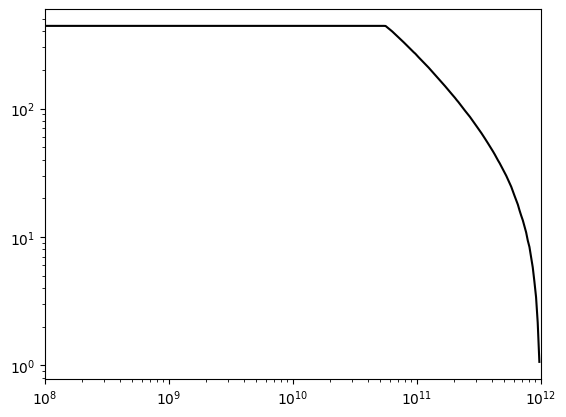

In [17]:

# SUBHALO MASS FUNCTION

base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_name = "SymphonyCluster"

# Mass function bins and empty histogram.
log_m_min, log_m_max, n_bin = 8, 12, 300
bins = np.logspace(log_m_min, log_m_max, n_bin+1)
N_vir = np.zeros(n_bin)

n_hosts = symlib.n_hosts(suite_name)
for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)

    # Only count objects within R_vir
    host_rvir = h[0,-1]["rvir"]
    sub_x = h[:,-1]["x"]
    r = np.sqrt(np.sum(sub_x**2, axis=1))
    ok = h["ok"][:,-1] & (r < host_rvir)

    # Put in bins and add to cumulative histogram
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
    N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts


fig, ax = plt.subplots()

ax.plot(bins[:-1], N_vir, color="black")
ax.set_xlim(1e8, 1e12)
ax.set_xscale("log")
ax.set_yscale("log")


'''
plt.plot(bins[:-1], N_vir, "k")

ax.set_xlim(1e8, 1e12)
ax.set_xscale("log")
ax.set_yscale("log") '''

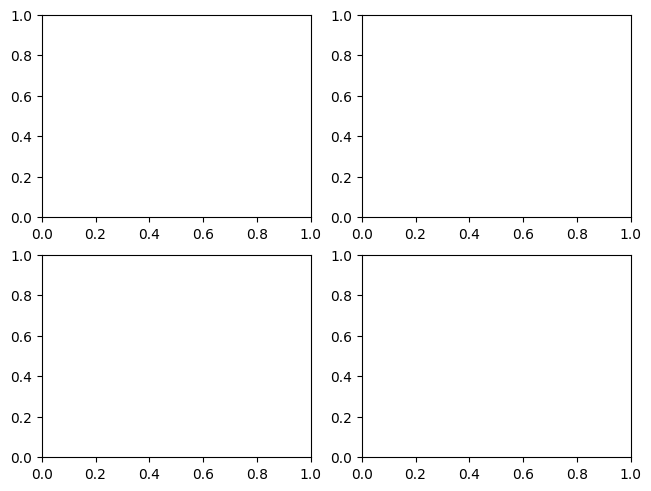

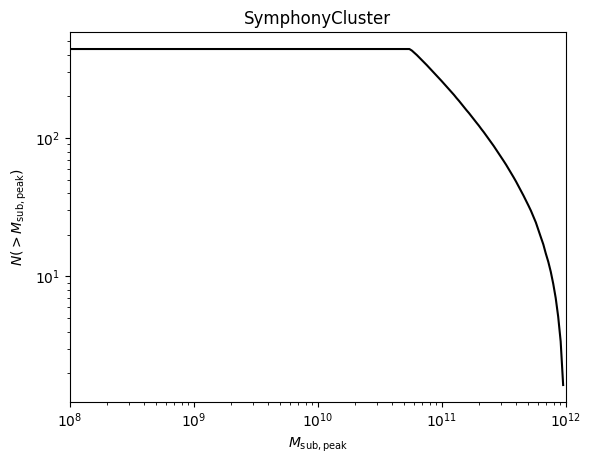

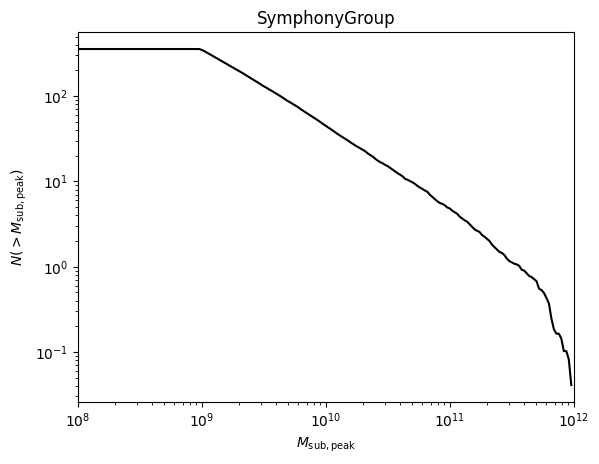

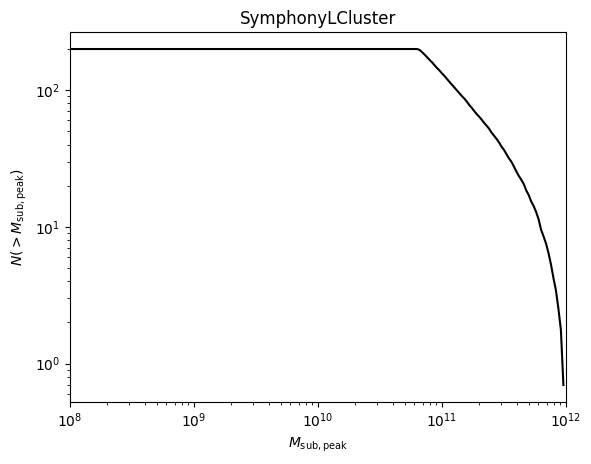

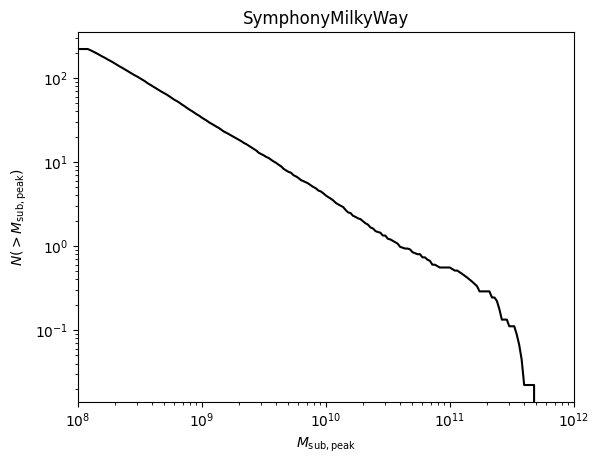

In [19]:
# repeat for all symphony suites

suite_names_list = ["SymphonyCluster", "SymphonyGroup", "SymphonyLCluster","SymphonyMilkyWay"]
#left out SymphonyLMC since i was having directory issues with that one :/


fig, axs = plt.subplots(2, 2, layout='constrained')

for suite_name in suite_names_list:
    base_dir = "/Users/roxannelai/data" #path/to/base/dir"
    # suite_name = suite_names_list[i]

    # Mass function bins and empty histogram.
    log_m_min, log_m_max, n_bin = 8, 12, 200
    bins = np.logspace(log_m_min, log_m_max, n_bin+1)
    N_vir = np.zeros(n_bin)

    n_hosts = symlib.n_hosts(suite_name)
    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        h, hist = symlib.read_subhalos(sim_dir)

        # Only count objects within R_vir
        host_rvir = h[0,-1]["rvir"]
        sub_x = h[:,-1]["x"]
        r = np.sqrt(np.sum(sub_x**2, axis=1))
        ok = h["ok"][:,-1] & (r < host_rvir)

        # Put in bins and add to cumulative histogram
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts


    fig, ax = plt.subplots()

    ax.plot(bins[:-1], N_vir, color="black")
    ax.set_xlim(1e8, 1e12)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$M_{\rm sub,peak}$")
    ax.set_ylabel(r"$N(>M_{\rm sub,peak})$")
    ax.set_title(str(suite_name))
    

In [21]:
# trying to turn this into a function so its easier to call

suite_names_list = ["SymphonyCluster", "SymphonyGroup", "SymphonyLCluster","SymphonyMilkyWay"]
#left out SymphonyLMC since i was having directory issues with that one :/

def subhalo_mass_function_plot(suite_name, ax):

    # for suite_name in suite_names_list:
    base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
        # suite_name = suite_names_list[i]

    # Mass function bins and empty histogram.
    # set n_min set to mass_max / 300 to rescale per suite
    # numbers of bins rescaled to mass max of the halos 
    log_m_min, log_m_max, n_bin = 8, 12, 200
    bins = np.logspace(log_m_min, log_m_max, n_bin+1)
    N_vir = np.zeros(n_bin)

    n_hosts = symlib.n_hosts(suite_name)
    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        h, hist = symlib.read_subhalos(sim_dir)

        # Only count objects within R_vir
        host_rvir = h[0,-1]["rvir"]
        sub_x = h[:,-1]["x"]
        r = np.sqrt(np.sum(sub_x**2, axis=1))
        ok = h["ok"][:,-1] & (r < host_rvir)

        # Put in bins and add to cumulative histogram
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

    # fig, ax = plt.subplots() # dont create a new plot every round. allow the function to take in an ax

    ax.plot(bins[:-1], N_vir, color="black")
    ax.set_xlim(1e8, 1e12)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$M_{\rm sub,peak}$")
    ax.set_ylabel(r"$N(>M_{\rm sub,peak})$")
    ax.set_title(str(suite_name))

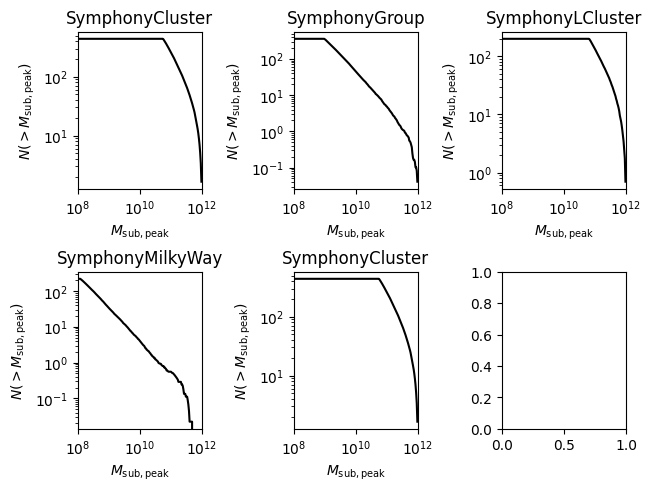

In [22]:
suite_names_list = ["SymphonyCluster", "SymphonyGroup", "SymphonyLCluster","SymphonyMilkyWay", "SymphonyCluster"]
#left out SymphonyLMC since i was having directory issues with that one :/

fig, axs = plt.subplots(2, 3, layout='constrained')

axs = axs.flatten()

for i, suite in enumerate(suite_names_list):
    subhalo_mass_function_plot(suite, axs[i])

plt.show()

# axs[0][0] = subhalo_mass_function_plot("SymphonyMilkyWay", axs)
# ax.plot(subhalo_mass_function_plot("SymphonyMilkyWay"))

In [ ]:
axs = axs.flatten()

for i, suite in enumerate(suite_names_list):
    subhalo_mass_function_plot(suite, axs[i])

plt.show()

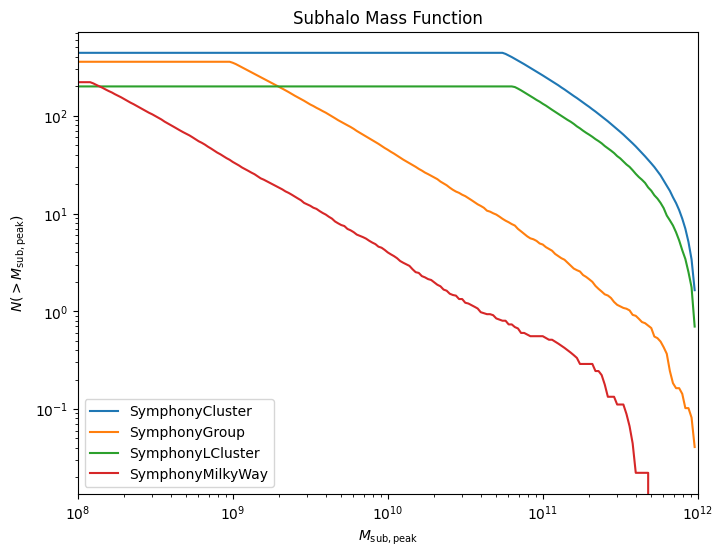

In [25]:
# put it all to one code and graph them

suite_names_list = ["SymphonyCluster", "SymphonyGroup", "SymphonyLCluster", "SymphonyMilkyWay"]

def subhalo_mass_function_plot(suite_name, ax):
    base_dir = "/Users/roxannelai/data"

    log_m_min, log_m_max, n_bin = 8, 12, 200
    bins = np.logspace(log_m_min, log_m_max, n_bin+1)
    N_vir = np.zeros(n_bin)

    n_hosts = symlib.n_hosts(suite_name)
    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        h, hist = symlib.read_subhalos(sim_dir)

        host_rvir = h[0, -1]["rvir"]
        sub_x = h[:, -1]["x"]
        r = np.sqrt(np.sum(sub_x**2, axis=1))
        ok = h["ok"][:, -1] & (r < host_rvir)

        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
        N_vir += np.cumsum(n_vir[::-1])[::-1] / n_hosts

    ax.plot(bins[:-1], N_vir, label=suite_name)  # Label added for legend

    ax.set_xlim(1e8, 1e12)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlabel(r"$M_{\rm sub,peak}$")
    ax.set_ylabel(r"$N(>M_{\rm sub,peak})$")
    ax.set_title("Subhalo Mass Function")


# ---- Create a single plot ----
fig, ax = plt.subplots(figsize=(8,6))

for suite in suite_names_list:
    subhalo_mass_function_plot(suite, ax)

ax.legend()
plt.show()

1 SymphonyGroup
2 SymphonyLCluster
3 SymphonyCluster
4 SymphonyMilkyWay


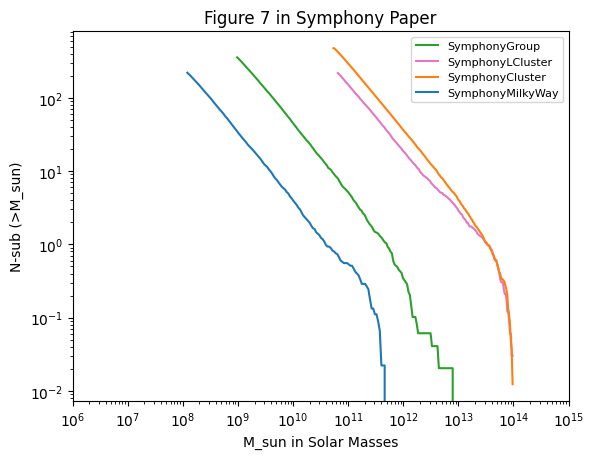

In [34]:
# copied from stephen's code

base_dir = "/Users/roxannelai/data" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay"]

fig, ax = plt.subplots()

for suite in range(len(suite_list)):
    print(suite+1,suite_list[suite])

    # setting up historgram bins 
    params = symlib.simulation_parameters(suite_list[suite])
    m_min = params ["mp"]/params["h100"]*300
    m_max = 1e14
    n_bins = 200
    bins = 10**np.linspace(np.log10(m_min),np.log10(m_max), n_bins+1)

    # set up cumulative historgrams for mass function: 
    N_infall = np.zeros(n_bins)
    N_spashback = np.zeros(n_bins)
    N_vir = np.zeros(n_bins)

    n_hosts = symlib.n_hosts(suite_list[suite])

    for i_halo in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir,suite_list[suite],i_halo)

        # read in simulation data:
        h,hist = symlib.read_subhalos(sim_dir)

        # all surviving subhalors within R_vir: 
        r = np.sqrt(np.sum(h['x'][:,-1]**2, axis = 1))
        host_rvir = h["rvir"][0,-1]
        ok = h['ok'][:,-1] & (r < host_rvir)
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

    # configuring plot: 
    colors = ['tab:green','tab:pink','tab:orange','tab:blue']
    left_bins = bins[:-1]
    ax.set_xlim(1e6,1e15)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title("Figure 7 in Symphony Paper")
    ax.set_xlabel("M_sun in Solar Masses")
    ax.set_ylabel("N-sub (>M_sun)")
    ax.plot(left_bins,N_vir, c = colors[suite % len(colors)], label = suite_list[suite])
    ax.legend(loc = "upper right", fontsize = 8)
    





In [1]:
import numpy as np
import matplotlib.pyplot as plt
import symlib

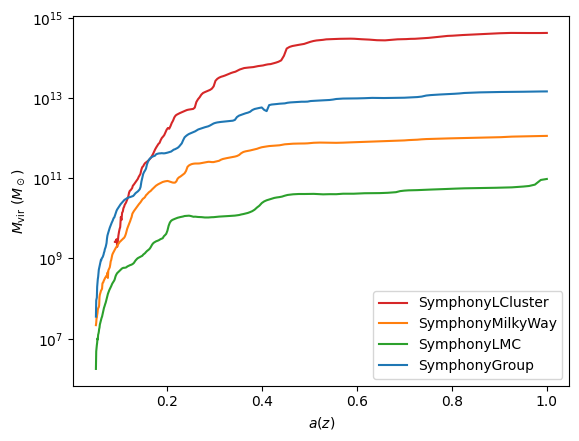

In [40]:
# sim_dir = "/Users/roxannelai/data/SymphonyGroup/Halo015"
'''
# def plot_host_mass(halo):
# Get file locations. You could also point to the directory directly.
base_dir = "/Users/roxannelai/data" # "/oak/stanford/orgs/kipac/users/phil1/simulations/ZoomIns/"
suite = "SymphonyMilkyWay"
halo_num = 0
sim_dir = symlib.get_host_directory(base_dir, suite, halo_num)
'''

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyLCluster","SymphonyMilkyWay", "SymphonyLMC","SymphonyGroup"]

fig, ax = plt.subplots()
ax.set_yscale("log")
ax.set_xlabel(r"$a(z)$")
ax.set_ylabel(r"$M_{\rm vir}\ (M_\odot)$")
#ax.set_xlabel("a(t)")
#ax.set_ylabel("m(t)")
colors = ["tab:red", "tab:orange", "tab:green",
          "tab:blue", "tab:purple"]

# test for first halo in each suite
for i in range(len(suite_list)): 

    sim_dir = symlib.get_host_directory(base_dir, suite_list[i], 0)
    scale = symlib.scale_factors(sim_dir)
    s, hist = symlib.read_symfind(sim_dir)
    r, _ = symlib.read_rockstar(sim_dir)
    
    # First, plot the host
    color_temp = colors[i]
    ok = r[0,:]["ok"]
    ax.plot(scale[ok], r[0,ok]["m"], c=color_temp, label=suite_list[i])
    # ax.legend([suite_list[i]],color_temp)

ax.legend()


Text(0, 0.5, '$M_{\\rm vir}\\ (M_\\odot)$')

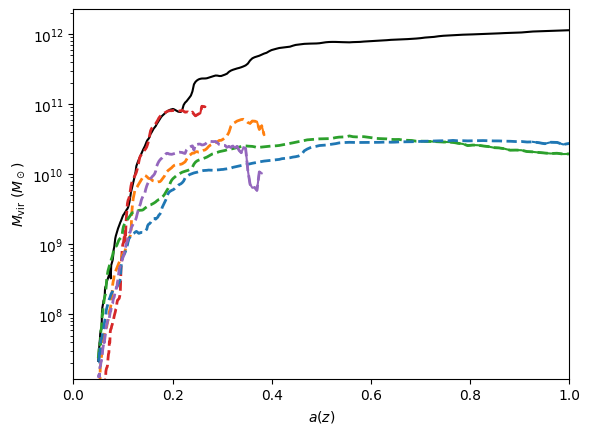

In [9]:

'''
sim_dir = "/Users/roxannelai/data/SymphonyGroup/Halo015"

scale = symlib.scale_factors(sim_dir)
s, hist = symlib.read_symfind(sim_dir)
r, _ = symlib.read_rockstar(sim_dir)

fig, ax = plt.subplots()
colors = ["tab:red", "tab:orange", "tab:green",
          "tab:blue", "tab:purple"]

# First, plot the host
ok = r[0,:]["ok"]
ax.plot(scale[ok], r[0,ok]["m"], c="k")

# For now, let's only plot minor mergers which dirupt before
# the end of the simulation in the Rockstar catalogue.
is_target = (hist["merger_ratio"] < 0.1) & (~r["ok"][:,-1])
targets = np.where(is_target)[0][:5]
for i_color, i in enumerate(targets):
    # Plot the mass history of the rockstar subhalo
    ok = r[i,:]["ok"]
    ax.plot(scale[ok], r[i,ok]["m"], c=colors[i_color])
    # Plot the mass history of the symfind subhalo
    ok = s[i,:]["ok"]
    ax.plot(scale[ok], s[i,ok]["m"], c=colors[i_color], lw=1.5)


'''

# Get file locations. You could also point to the directory directly.
base_dir = "/Users/roxannelai/data" # "/oak/stanford/orgs/kipac/users/phil1/simulations/ZoomIns/"
suite = "SymphonyMilkyWay"
halo_num = 0
sim_dir = symlib.get_host_directory(base_dir, suite, halo_num)

# Read in simulation data.
h, hist = symlib.read_subhalos(sim_dir)
scale = symlib.scale_factors(sim_dir)

# Snapshots, for the purpose of making cuts
snaps = np.arange(len(h[0]))

fig, ax = plt.subplots()
colors = ["k", "tab:red", "tab:orange", "tab:green",
        "tab:blue", "tab:purple"]

for i in range(6):
    ok = h[i,:]["ok"] # Snapshots where the halo exists
    if i == 0:
        # Plot the host halo
        plt.plot(scale[ok], h[i,ok]["mvir"], c=colors[i])
    else:
        # Plot the full history of the subhalo as a dahsed line
        plt.plot(scale[ok], h[i,ok]["mvir"], "--", c=colors[i], lw=2)
        # Plot its history inside the host halo as a solid line
        is_sub = (snaps >= hist["merger_snap"][i]) & ok
        plt.plot(scale[is_sub], h[i,is_sub]["mvir"], c=colors[i])

        
# Some plotting code to make things look nice.
param = symlib.simulation_parameters(suite)
ax.set_xlim(0, 1)
ax.set_ylim(30*param["mp"]/param["h100"], 2*h[0,-1]["mvir"])
ax.set_yscale("log")
ax.set_xlabel(r"$a(z)$")
ax.set_ylabel(r"$M_{\rm vir}\ (M_\odot)$")
# fig.savefig("plots/mah.png")

# if __name__ == "__main__": main()



In [46]:
# try out the symlib documentation 

base_dir = "/Users/roxannelai/data"
suite = "SymphonyMilkyWay"
halo_num = 0
sim_dir = symlib.get_host_directory(base_dir, suite, halo_num)
total_hosts = symlib.n_hosts(suite)

list_scalefactors = symlib.scale_factors(sim_dir)
# print(list_scalefactors[0])

total_halo_mass = 0

for i in range(total_hosts):
    halo_temp = suite[i]
    total_halo_mass += list_scalefactors[i]

average_halo_mass = total_halo_mass / total_hosts



IndexError: string index out of range

In [48]:
# first try to average one snapshot's masses

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite = "SymphonyMilkyWay"
total_hosts = symlib.n_hosts(suite)

snapshot_index = 0  # First snapshot
total_mass = 0
valid_halo_count = 0

for i in range(total_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite, i)
    r, _ = symlib.read_rockstar(sim_dir)

    # Get host halo mass at first snapshot
    m = r[0, snapshot_index]["m"]
    ok = r[0, snapshot_index]["ok"]

    if ok:
        total_mass += m
        valid_halo_count += 1

if valid_halo_count > 0:
    average_mass = total_mass / valid_halo_count
    print(f"Average host mass at snapshot 0 (a = early universe): {average_mass:.2e}")
else:
    print("No valid halos found at snapshot 0.")

Average host mass at snapshot 0 (a = early universe): 3.03e+07


In [ ]:
# now graph the average halo masses for each snapshot

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite = "SymphonyMilkyWay"
total_hosts = symlib.n_hosts(suite)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import symlib

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite = "SymphonyMilkyWay"
total_hosts = symlib.n_hosts(suite)

# Use the first halo to get the list of scale factors (shared by all halos)
sim_dir_example = symlib.get_host_directory(base_dir, suite, 0)
scale_factors = symlib.scale_factors(sim_dir_example)
n_snaps = len(scale_factors)

average_masses = []

# Loop over all snapshots
for snap in range(n_snaps):
    total_mass = 0
    valid_count = 0

    for i in range(total_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite, i)
        r, _ = symlib.read_rockstar(sim_dir)

        m = r[0, snap]["m"]
        ok = r[0, snap]["ok"]

        if ok:
            total_mass += m
            valid_count += 1

    if valid_count > 0:
        average_masses.append(total_mass / valid_count)
    else:
        average_masses.append(np.nan)  # skip if no valid halos at this snapshot

# Plotting
fig, ax = plt.subplots()
ax.plot(scale_factors, average_masses, label=suite, c="tab:blue")
ax.set_yscale("log")
ax.set_xlabel("Scale Factor a(t)")
ax.set_ylabel("Average Host Halo Mass [Msun]")
ax.set_title(f"Average Host Mass vs. Scale Factor for {suite}")
ax.legend()
plt.show()

KeyboardInterrupt: 

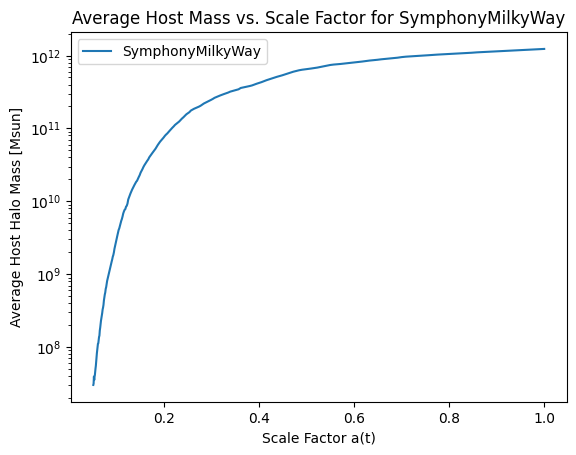

In [3]:
base_dir = "/Users/roxannelai/SymphonySuitesData"
suite = "SymphonyMilkyWay"
total_hosts = symlib.n_hosts(suite)

# Load scale factors
sim_dir_example = symlib.get_host_directory(base_dir, suite, 0)
scale_factors = symlib.scale_factors(sim_dir_example)
n_snaps = len(scale_factors)

# Preload all host data
host_data = []  # list of r arrays, one per halo

for i in range(total_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite, i)
    r, _ = symlib.read_rockstar(sim_dir)
    host_data.append(r[0])  # just store the host halo's history

# Compute average mass at each snapshot
average_masses = []

for snap in range(n_snaps):
    total_mass = 0
    valid_count = 0

    for r_host in host_data:
        m = r_host[snap]["m"]
        ok = r_host[snap]["ok"]

        if ok:
            total_mass += m
            valid_count += 1

    if valid_count > 0:
        average_masses.append(total_mass / valid_count)
    else:
        average_masses.append(np.nan)

# Plotting
fig, ax = plt.subplots()
ax.plot(scale_factors, average_masses, label=suite, c="tab:blue")
ax.set_yscale("log")
ax.set_xlabel("Scale Factor a(t)")
ax.set_ylabel("Average Host Halo Mass [Msun]")
ax.set_title(f"Average Host Mass vs. Scale Factor for {suite}")
ax.legend()
plt.show()

IndexError: list index out of range

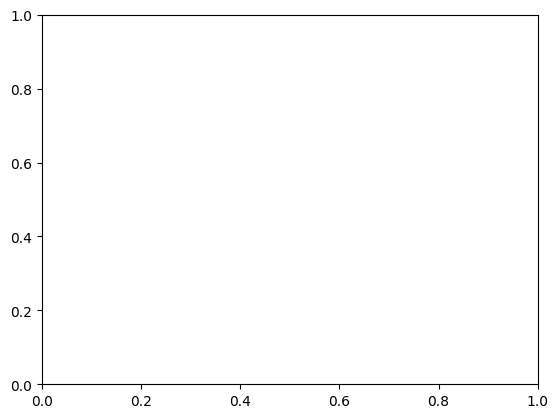

In [4]:

# now loop for all suites


base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyLCluster","SymphonyMilkyWay", "SymphonyLMC","SymphonyGroup"]
# suite = "SymphonyMilkyWay"
total_hosts = symlib.n_hosts(suite)

# create the plot
fig, ax = plt.subplots()


# Load scale factors
sim_dir_example = symlib.get_host_directory(base_dir, suite_list[i], 0)
scale_factors = symlib.scale_factors(sim_dir_example)
n_snaps = len(scale_factors)

# Preload all host data
host_data = []  # list of r arrays, one per halo

for i in range(len(suite_list)):

    for i in range(total_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_list[i], i)
        r, _ = symlib.read_rockstar(sim_dir)
        host_data.append(r[0])  # just store the host halo's history

    # Compute average mass at each snapshot
    average_masses = []

    for snap in range(n_snaps):
        total_mass = 0
        valid_count = 0

        for r_host in host_data:
            m = r_host[snap]["m"]
            ok = r_host[snap]["ok"]

            if ok:
                total_mass += m
                valid_count += 1

        if valid_count > 0:
            average_masses.append(total_mass / valid_count)
        else:
            average_masses.append(np.nan)

    ax.plot(scale_factors, average_masses, label=suite, c="tab:blue")

# Plotting
# fig, ax = plt.subplots()
# ax.plot(scale_factors, average_masses, label=suite, c="tab:blue")
ax.set_yscale("log")
ax.set_xlabel("Scale Factor a(t)")
ax.set_ylabel("Average Host Halo Mass [Msun]")
ax.set_title(f"Average Host Mass vs. Scale Factor for {suite}")
ax.legend()
plt.show()


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import symlib

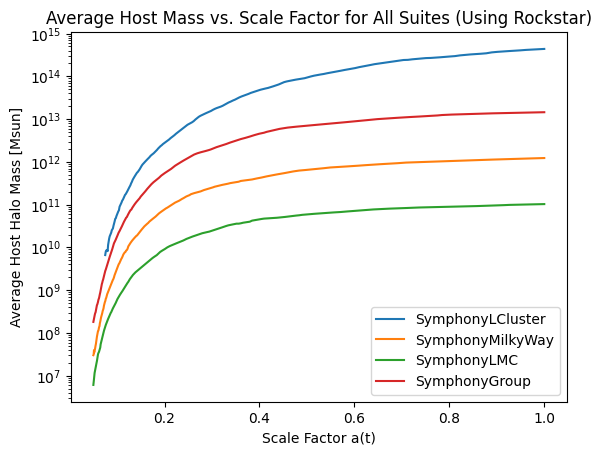

In [4]:


base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyLCluster", "SymphonyMilkyWay", "SymphonyLMC", "SymphonyGroup"]

# Create plot
fig, ax = plt.subplots()

for suite in suite_list:
    total_hosts = symlib.n_hosts(suite)

    # Load scale factors (same across halos in suite)
    sim_dir_example = symlib.get_host_directory(base_dir, suite, 0)
    scale_factors = symlib.scale_factors(sim_dir_example)
    n_snaps = len(scale_factors)

    # Preload host data
    host_data = []
    for j in range(total_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite, j)
        r, _ = symlib.read_rockstar(sim_dir)
        host_data.append(r[0])  # host only

    # Compute average mass for each snapshot
    average_masses = []
    for snap in range(n_snaps):
        total_mass = 0
        valid_count = 0

        for r_host in host_data:
            m = r_host[snap]["m"]
            ok = r_host[snap]["ok"]
            if ok:
                total_mass += m
                valid_count += 1

        if valid_count > 0:
            average_masses.append(total_mass / valid_count)
        else:
            average_masses.append(np.nan)

    # Plot for this suite
    ax.plot(scale_factors, average_masses, label=suite)

# Final plot settings
ax.set_yscale("log")
ax.set_xlabel("Scale Factor a(t)")
ax.set_ylabel("Average Host Halo Mass [Msun]")
ax.set_title("Average Host Mass vs. Scale Factor for All Suites (Using Rockstar)")
ax.legend()
plt.show()



In [2]:
# sort the suite list from lowest to greatest redshift 
# so the end redshift (which the end plot-organizing refers to) encompasses all suites

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list_random = ["SymphonyLCluster", "SymphonyMilkyWay", "SymphonyLMC", "SymphonyGroup", "SymphonyCluster"]

suite_redshift_max = []

for suite in suite_list_random:
    sim_dir = symlib.get_host_directory(base_dir, suite, 0)
    scale_factors = symlib.scale_factors(sim_dir)
    redshifts = 1 / scale_factors - 1
    suite_redshift_max.append((suite, np.max(redshifts)))

# Sort by max redshift (ascending)
suite_list = [x[0] for x in sorted(suite_redshift_max, key=lambda x: x[1])]

# check
print("Suite List sorted by redshift (least to greated): ", suite_list)

Suite List sorted by redshift (least to greated):  ['SymphonyCluster', 'SymphonyLCluster', 'SymphonyMilkyWay', 'SymphonyLMC', 'SymphonyGroup']


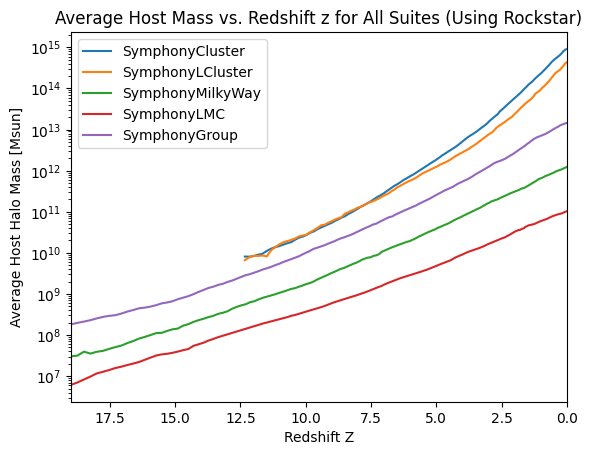

In [37]:
# now try to concert from scale factor to redshift
# scale factor is a function of redshift a(z) = 1 / (1+z)
# if we're given scale factor, redshift can be calculated z(a) = (1/a) - 1

# base_dir = "/Users/roxannelai/SymphonySuitesData"
# suite_list = ["SymphonyLCluster", "SymphonyMilkyWay", "SymphonyLMC", "SymphonyGroup", "SymphonyCluster"]

# Create plot
fig, ax = plt.subplots()

for suite in suite_list:
    total_hosts = symlib.n_hosts(suite)

    # Load scale factors (same across halos in suite)
    sim_dir_example = symlib.get_host_directory(base_dir, suite, 0)
    scale_factors = symlib.scale_factors(sim_dir_example) 
    n_snaps = len(scale_factors)

    # Preload host data
    host_data = []
    for j in range(total_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite, j)
        r, _ = symlib.read_rockstar(sim_dir)
        host_data.append(r[0])  # host only

    # Compute average mass for each snapshot
    average_masses = []
    for snap in range(n_snaps):
        total_mass = 0
        valid_count = 0

        for r_host in host_data:
            m = r_host[snap]["m"] # pull mass
            ok = r_host[snap]["ok"] # only use it if its actually been tracked at that snapshot
            if ok:
                total_mass += m
                valid_count += 1

        if valid_count > 0:
            average_masses.append(total_mass / valid_count)
        else:
            average_masses.append(np.nan)

    # Change all the scale factors to their corresponding redshifts by inverting the redshift equation
    # redshift should be between 0 and 16, with 0 being present and 16 being earliest 
    redshift = (1/scale_factors) - 1

    # Plot for this suite; replace scale factor with redshift
    ax.plot(redshift, average_masses, label=suite)


# Final plot settings
ax.set_yscale("log")
# ax.set_xscale("log")
ax.set_xlabel("Redshift Z")
ax.set_ylabel("Average Host Halo Mass [Msun]")
ax.set_title("Average Host Mass vs. Redshift z for All Suites (Using Rockstar)")
ax.legend()
ax.set_xlim(max(redshift), min(redshift))
plt.show()


[Text(0.0, 0, '0'),
 Text(0.09691001300805642, 0, '0.25'),
 Text(0.17609125905568124, 0, '0.5'),
 Text(0.3010299956639812, 0, '1'),
 Text(0.47712125471966244, 0, '2'),
 Text(0.6989700043360189, 0, '4'),
 Text(0.9542425094393249, 0, '8'),
 Text(1.2304489213782739, 0, '16')]

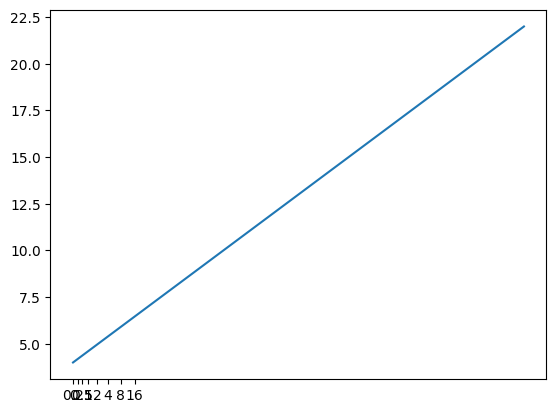

In [31]:


# i give up on this tick rearranging stuff lol ill try again later 

fig, ax = plt.subplots()
x = np.arange(10)
y = 2*x+4
ax.plot(x,y)

z_ticks = [0, 0.25, 0.5, 1, 2, 4, 8, 16]
logz_ticks = np.log10(1 + np.array(z_ticks))

ax.set_xticks(logz_ticks)
ax.set_xticklabels([str(z) for z in z_ticks])

'''
# Chatgpt trying to help me arrange these ticks
logz = np.log10(1 + redshift)
# ax.plot(logz[::-1], normalized_masses[::-1], label=suite)
z_ticks = [0, 0.25, 0.5, 1, 2, 4, 8, 16]
logz_ticks = np.log10(1 + np.array(z_ticks))

ax.set_xticks(logz_ticks)
ax.set_xticklabels([str(z) for z in z_ticks])
ax.set_xlim(max(logz), min(logz))  # high z on left
ax.set_xlabel(r"$z$", fontsize=14)

ax.set_yscale("log")
'''



#ax.set_xscale("log")
#ax.set_xticks([])

In [ ]:
'''

# find the average host mass during the current snapshot
total_current_m = 0
for i in range(total_hosts): 
    current_mass = r_host[0]["m"] # pulls the mass of the lastest snapshot, hopefully the maximum
    total_current_m += current_m

average_current_m = total_current_m / total_hosts


'''

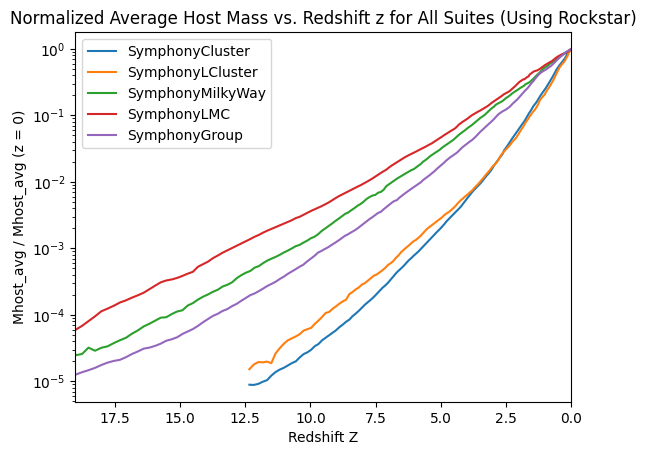

In [14]:
# now try to make it normalized as Mhost / Mhost(z=0) 


fig, ax = plt.subplots()

for suite in suite_list:
    total_hosts = symlib.n_hosts(suite)

    # Load scale factors (same across halos in suite)
    sim_dir_example = symlib.get_host_directory(base_dir, suite, 0)
    scale_factors = symlib.scale_factors(sim_dir_example)
    n_snaps = len(scale_factors)

    # Preload host data
    host_data = []
    for j in range(total_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite, j)
        r, _ = symlib.read_rockstar(sim_dir)
        host_data.append(r[0])  # host only    

    # Compute average mass for each snapshot
    average_masses = []
    for snap in range(n_snaps):
        total_mass = 0
        valid_count = 0

        for r_host in host_data:
            m = r_host[snap]["m"] # pull mass
            ok = r_host[snap]["ok"] # only use it if its actually been tracked at that snapshot
            if ok:
                total_mass += m
                valid_count += 1
        
        if valid_count > 0:
            average_masses.append(total_mass / valid_count)
        else:
            average_masses.append(np.nan)

    # Change all the scale factors to their corresponding redshifts
    redshift = (1/scale_factors) - 1

    # find the average host mass during the current snapshot z = 0
    total_current_m = 0
    valid_count_2 = 0
    for ithhost in host_data: 
        current_m = ithhost[-1]["m"] # pulls the mass of the lastest snapshot, hopefully the maximum
        ok = ithhost[-1]["ok"]
        if ok:
            total_current_m += current_m
            valid_count_2 += 1   

    average_current_m = total_current_m / valid_count_2 
    normalized_masses = average_masses / average_current_m

    # Plot for this suite; replace scale factor with redshift
    ax.plot(redshift, normalized_masses, label=suite)

# Final plot settings
ax.set_yscale("log")
ax.set_xlabel("Redshift Z")
ax.set_ylabel("Mhost_avg / Mhost_avg (z = 0)")
ax.set_title("Normalized Average Host Mass vs. Redshift z for All Suites (Using Rockstar)")
ax.legend()
ax.set_xlim(max(redshift), min(redshift))
plt.show()


In [27]:
# turn both the average and the normalized code into functions so i can make a neater graph placing them side by side

def avg_mass_z(suite_list, ax):
    
    for suite in suite_list:
        total_hosts = symlib.n_hosts(suite)
    
        # Load scale factors (same across halos in suite)
        sim_dir_example = symlib.get_host_directory(base_dir, suite, 0)
        scale_factors = symlib.scale_factors(sim_dir_example)
        n_snaps = len(scale_factors)
    
        # Preload host data
        host_data = []
        for j in range(total_hosts):
            sim_dir = symlib.get_host_directory(base_dir, suite, j)
            r, _ = symlib.read_rockstar(sim_dir)
            host_data.append(r[0])  # host only

        # Compute average mass for each snapshot
        average_masses = []
        for snap in range(n_snaps):
            total_mass = 0
            valid_count = 0

            for r_host in host_data:
                m = r_host[snap]["m"] # pull mass
                ok = r_host[snap]["ok"] # only use it if its actually been tracked at that snapshot
                if ok:
                    total_mass += m
                    valid_count += 1
                    
            average_masses.append(total_mass / valid_count if valid_count > 0 else np.nan)

        # Change all the scale factors to their corresponding redshifts by inverting the redshift equation
        # redshift should be between 0 and 16, with 0 being present and 16 being earliest 
        redshift = (1/scale_factors) - 1

        # Plot for this suite; replace scale factor with redshift
        ax.plot(redshift, average_masses, label=suite)

    # Final plot settings
    ax.set_yscale("log")
    #ax.set_xscale("log")
    ax.set_xlabel("Redshift Z")
    ax.set_ylabel("Average Host Halo Mass [Msun]")
    ax.set_title("Average Host Mass vs. Redshift z")
    ax.legend()
    ax.set_xlim(max(redshift), min(redshift))

    return ax

def avg_mass_z_norm(suite_list,ax):
    
    for suite in suite_list:
        total_hosts = symlib.n_hosts(suite)

        # Load scale factors (same across halos in suite)
        sim_dir_example = symlib.get_host_directory(base_dir, suite, 0)
        scale_factors = symlib.scale_factors(sim_dir_example)
        n_snaps = len(scale_factors)

        # Preload host data
        host_data = []
        for j in range(total_hosts):
            sim_dir = symlib.get_host_directory(base_dir, suite, j)
            r, _ = symlib.read_rockstar(sim_dir)
            host_data.append(r[0])  # host only    

        # Compute average mass for each snapshot
        average_masses = []
        for snap in range(n_snaps):
            total_mass = 0
            valid_count = 0

            for r_host in host_data:
                m = r_host[snap]["m"] # pull mass
                ok = r_host[snap]["ok"] # only use it if its actually been tracked at that snapshot
                if ok:
                    total_mass += m
                    valid_count += 1
        
            average_masses.append(total_mass / valid_count if valid_count > 0 else np.nan)

        # Change all the scale factors to their corresponding redshifts
        redshift = (1/scale_factors) - 1

        # find the average host mass during the current snapshot z = 0
        total_current_m = 0
        valid_count_2 = 0
        for ithhost in host_data: 
            current_m = ithhost[-1]["m"] # pulls the mass of the lastest snapshot, hopefully the maximum
            ok = ithhost[-1]["ok"]
            if ok:
                total_current_m += current_m
                valid_count_2 += 1   

        average_current_m = total_current_m / valid_count_2 if valid_count_2 > 0 else np.nan
        normalized_masses = np.array(average_masses) / average_current_m

        # Plot for this suite; replace scale factor with redshift
        ax.plot(redshift, normalized_masses, label=suite)

    # Final plot settings
    ax.set_yscale("log")
    ax.set_xlabel("Redshift Z")
    ax.set_ylabel("Mhost_avg / Mhost_avg (z = 0)")
    ax.set_title("Normalized Average Host Mass vs. Redshift z")
    ax.legend()
    ax.set_xlim(max(redshift), min(redshift))

    return ax


<function matplotlib.pyplot.show(close=None, block=None)>

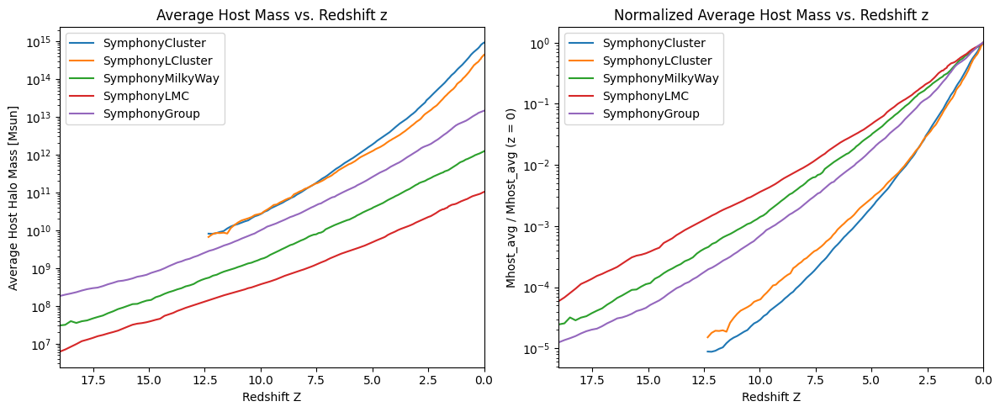

In [26]:
fig, axe = plt.subplots(1,2, figsize = (12,5))

avg_mass_z(suite_list, axe[0])
avg_mass_z_norm(suite_list, axe[1])

plt.tight_layout()
plt.show

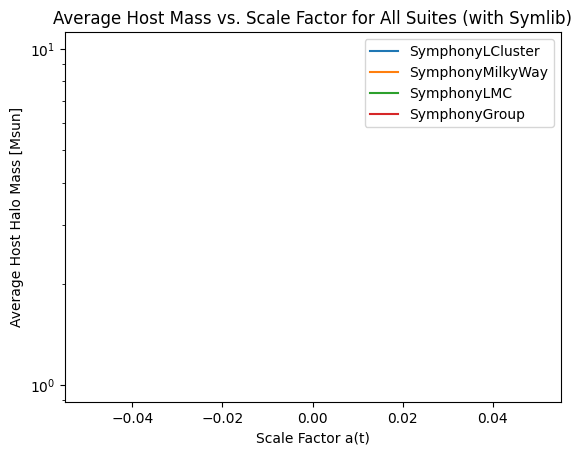

In [6]:
# try to use symfind as well 
# replace all r with s 
# replace all _ with hist

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyLCluster", "SymphonyMilkyWay", "SymphonyLMC", "SymphonyGroup"]

# Create plot
fig, ax = plt.subplots()

for suite in suite_list:
    total_hosts = symlib.n_hosts(suite)

    # Load scale factors (same across halos in suite)
    sim_dir_example = symlib.get_host_directory(base_dir, suite, 0)
    scale_factors = symlib.scale_factors(sim_dir_example)
    n_snaps = len(scale_factors)

    # Preload host data
    host_data = []
    for j in range(total_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite, j)
        s, hist = symlib.read_symfind(sim_dir)
        host_data.append(s[0])  # host only

    # Compute average mass for each snapshot
    average_masses = []
    for snap in range(n_snaps):
        total_mass = 0
        valid_count = 0

        for s_host in host_data: # changed r_host to s_host for consistency's sake
            m = s_host[snap]["m"]
            ok = s_host[snap]["ok"]
            if ok:
                total_mass += m
                valid_count += 1

        if valid_count > 0:
            average_masses.append(total_mass / valid_count)
        else:
            average_masses.append(np.nan)

    # Plot for this suite
    ax.plot(scale_factors, average_masses, label=suite)

# Final plot settings
ax.set_yscale("log")
ax.set_xlabel("Scale Factor a(t)")
ax.set_ylabel("Average Host Halo Mass [Msun]")
ax.set_title("Average Host Mass vs. Scale Factor for All Suites (with Symlib)")
ax.legend()
plt.show()




1 SymphonyGroup
2 SymphonyLCluster
3 SymphonyCluster
4 SymphonyMilkyWay
5 SymphonyLMC


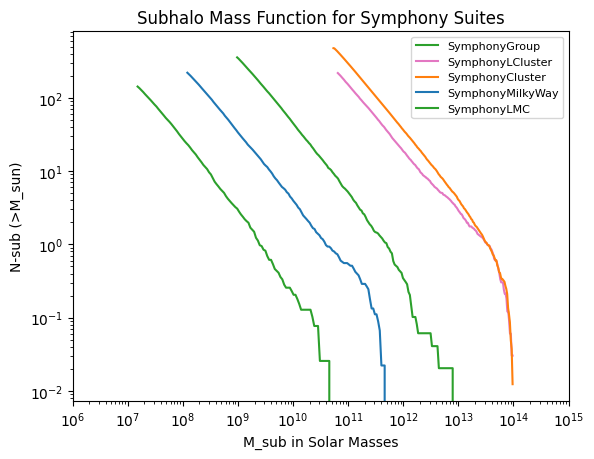

In [7]:
# copied from stephen's code
# Subhalo mass function

base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

fig, ax = plt.subplots()

for suite in range(len(suite_list)):
    print(suite+1,suite_list[suite])

    # setting up historgram bins 
    params = symlib.simulation_parameters(suite_list[suite])
    m_min = params ["mp"]/params["h100"]*300
    m_max = 1e14
    n_bins = 200
    bins = 10**np.linspace(np.log10(m_min),np.log10(m_max), n_bins+1)

    # set up cumulative historgrams for mass function: 
    N_infall = np.zeros(n_bins)
    N_spashback = np.zeros(n_bins)
    N_vir = np.zeros(n_bins)

    n_hosts = symlib.n_hosts(suite_list[suite])

    for i_halo in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir,suite_list[suite],i_halo)

        # read in simulation data:
        h,hist = symlib.read_subhalos(sim_dir)

        # all surviving subhalors within R_vir: 
        r = np.sqrt(np.sum(h['x'][:,-1]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
        host_rvir = h["rvir"][0,-1] # pulls the virial radius of the host halo
        ok = h['ok'][:,-1] & (r < host_rvir) # chooses only the subhalos still within the virial radius
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

    # configuring plot: 
    colors = ['tab:green','tab:pink','tab:orange','tab:blue', 'tab:purple']
    left_bins = bins[:-1]
    ax.set_xlim(1e6,1e15)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title("Subhalo Mass Function for Symphony Suites")
    ax.set_xlabel("M_sub in Solar Masses")
    ax.set_ylabel("N-sub (>M_sun)")
    ax.plot(left_bins,N_vir, c = colors[suite % len(colors)], label = suite_list[suite])
    ax.legend(loc = "upper right", fontsize = 8)
    


1 SymphonyGroup
2 SymphonyLCluster
3 SymphonyCluster
4 SymphonyMilkyWay
5 SymphonyLMC


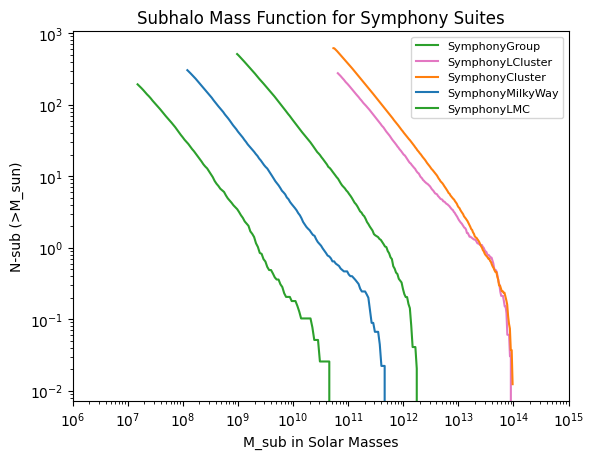

In [10]:

# now lets try this at snapshot 0.5

base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

fig, ax = plt.subplots()

for suite in range(len(suite_list)):
    print(suite+1,suite_list[suite])

    # setting up historgram bins 
    params = symlib.simulation_parameters(suite_list[suite])
    m_min = params ["mp"]/params["h100"]*300
    m_max = 1e14
    n_bins = 200
    bins = 10**np.linspace(np.log10(m_min),np.log10(m_max), n_bins+1)

    # set up cumulative historgrams for mass function: 
    N_infall = np.zeros(n_bins)
    N_spashback = np.zeros(n_bins)
    N_vir = np.zeros(n_bins)

    n_hosts = symlib.n_hosts(suite_list[suite])

    for i_halo in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir,suite_list[suite],i_halo)

        # read in simulation data:
        h,hist = symlib.read_subhalos(sim_dir)

        # all surviving subhalors within R_vir: 
        r = np.sqrt(np.sum(h['x'][:,0]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
        host_rvir = h["rvir"][0,-1] # pulls the virial radius of the host halo
        ok = h['ok'][:,-1] & (r < host_rvir) # chooses only the subhalos still within the virial radius
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

    # configuring plot: 
    colors = ['tab:green','tab:pink','tab:orange','tab:blue']
    left_bins = bins[:-1]
    ax.set_xlim(1e6,1e15)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title("Subhalo Mass Function for Symphony Suites")
    ax.set_xlabel("M_sub in Solar Masses")
    ax.set_ylabel("N-sub (>M_sun)")
    ax.plot(left_bins,N_vir, c = colors[suite % len(colors)], label = suite_list[suite])
    ax.legend(loc = "upper right", fontsize = 8)
    

# nothing changed when I changed h['x'][:,1] to h['x'][:,0]




In [12]:

sim_dir = symlib.get_host_directory(base_dir, suite_list[0], 0)
scale_factors = symlib.scale_factors(sim_dir)

target_z = 1.0
target_a = 1 / (1 + target_z)  # scale factor
snapshot_index = np.argmin(np.abs(scale_factors - target_a))

print(f"Closest snapshot index to z = {target_z} is {snapshot_index}")
print(f"Actual scale factor at that index: {scale_factors[snapshot_index]}")


Closest snapshot index to z = 1.0 is 181
Actual scale factor at that index: 0.5023890742650983


In [ ]:

# now lets try this at redshift 1
# for only one symphony suite

base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

fig, ax = plt.subplots()

# for suite in range(len(suite_list)):
    #print(suite+1,suite_list[suite])

    # setting up historgram bins 
params = symlib.simulation_parameters(suite_list[suite])
m_min = params ["mp"]/params["h100"]*300
m_max = 1e14
n_bins = 200
bins = 10**np.linspace(np.log10(m_min),np.log10(m_max), n_bins+1)

    # set up cumulative historgrams for mass function: 
    N_infall = np.zeros(n_bins)
    N_spashback = np.zeros(n_bins)
    N_vir = np.zeros(n_bins)

    n_hosts = symlib.n_hosts(suite_list[suite])

    for i_halo in range(n_hosts):
        # read in simulation data
        sim_dir = symlib.get_host_directory(base_dir,suite_list[suite],i_halo)
        scale_factors = symlib.scale_factors(sim_dir)
        h,hist = symlib.read_subhalos(sim_dir)

        # find out which snapshot correspond to reshift 1 by comparing the scale factors 
        
        target_z = 1.0
        target_a = 1 / (1 + target_z)  # scale factor
        snapshot_index = np.argmin(np.abs(scale_factors - target_a))

       #  print(f"Closest snapshot index to z = {target_z} is {snapshot_index}")
        # print(f"Actual scale factor at that index: {scale_factors[snapshot_index]}")
        
        
        # all surviving subhalors within R_vir: 
        r = np.sqrt(np.sum(h['x'][:,0]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
        host_rvir = h["rvir"][0,-1] # pulls the virial radius of the host halo
        ok = h['ok'][:,-1] & (r < host_rvir) # chooses only the subhalos still within the virial radius
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

    # configuring plot: 
    colors = ['tab:green','tab:pink','tab:orange','tab:blue']
    left_bins = bins[:-1]
    ax.set_xlim(1e6,1e15)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title("Subhalo Mass Function for Symphony Suites")
    ax.set_xlabel("M_sub in Solar Masses")
    ax.set_ylabel("N-sub (>M_sun)")
    ax.plot(left_bins,N_vir, c = colors[suite % len(colors)], label = suite_list[suite])
    ax.legend(loc = "upper right", fontsize = 8)
    

# nothing changed when I changed h['x'][:,1] to h['x'][:,0]

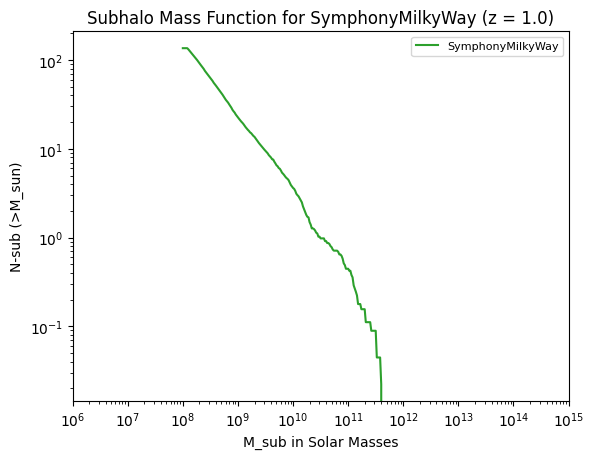

In [20]:
# now lets try this at redshift 1
# for only one symphony suite

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"

fig, ax = plt.subplots()

# Mass function bins and empty histogram.
log_m_min, log_m_max, n_bin = 8, 12, 200
bins = np.logspace(log_m_min, log_m_max, n_bin+1)
N_vir = np.zeros(n_bin)

n_hosts = symlib.n_hosts(suite_name)
for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # find out which snapshot correspond to reshift 1 by comparing the scale factors      
    target_z = 1.0
    target_a = 1 / (1 + target_z)  # scale factor
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
    host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
    ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    # add to the cumulative histograms
    N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

colors = ['tab:green','tab:pink','tab:orange','tab:blue']
left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for " + suite_name + " (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
ax.plot(left_bins,N_vir, color = colors[0],label = suite_name)
ax.legend(loc = "upper right", fontsize = 8)


In [1]:
import symlib
import numpy as np
import matplotlib.pyplot as plt

In [11]:
base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

suite_masses = {"SymphonyGroup":10**13, "SymphonyLCluster":10**14, "SymphonyCluster":10**15,"SymphonyMilkyWay":10**12, "SymphonyLMC":10**11}
# print(suite_masses.values())
print(suite_masses["SymphonyGroup"])

10000000000000


In [14]:
for suite in suite_list:
    suite_name = suite

    # Mass function bins and empty histogram.
    log_m_min, log_m_max, n_bin = 8, 12, 10**(-4)*(suite_masses[suite])
    print(suite, n_bin)

SymphonyGroup 1000000000.0
SymphonyLCluster 10000000000.0
SymphonyCluster 100000000000.0
SymphonyMilkyWay 100000000.0
SymphonyLMC 10000000.0


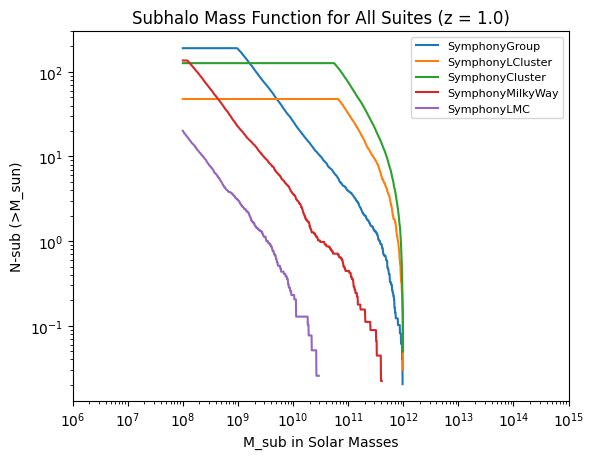

In [19]:
# now lets try this at redshift 1
# for any suite

base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

suite_masses = {"SymphonyGroup":10**13, "SymphonyLCluster":10**14, "SymphonyCluster":10**15,"SymphonyMilkyWay":10**12, "SymphonyLMC":10**11}


fig, ax = plt.subplots()

for suite in suite_list:
    suite_name = suite

    # Mass function bins and empty histogram.
    log_m_min, log_m_max = 8, 12, # n bin = int(10**(-4)*(suite_masses[suite]))
    n_bin = min(1000, max(30, int(1e-4 * suite_masses[suite])))
    bins = np.logspace(log_m_min, log_m_max, n_bin+1)
    N_vir = np.zeros(n_bin)

    n_hosts = symlib.n_hosts(suite_name)
    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        h, hist = symlib.read_subhalos(sim_dir)
        scale_factors = symlib.scale_factors(sim_dir)

        # find out which snapshot correspond to reshift 1 by comparing the scale factors      
        target_z = 1.0
        target_a = 1 / (1 + target_z)  # scale factor
        snapshot_index = np.argmin(np.abs(scale_factors - target_a))
        snap = snapshot_index

        r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
        host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
        ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts
    
    left_bins = bins[:-1]
    mask = N_vir > 0
    ax.plot(left_bins[mask], N_vir[mask], label=suite_name)
    # ax.plot(left_bins,N_vir,label = suite_name)

# left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for All Suites (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
# ax.plot(left_bins,N_vir,label = suite_name)
ax.legend(loc = "upper right", fontsize = 8)
plt.show()

/var/folders/ts/qpx78zdd5cn6f312s8cs93s80000gn/T/ipykernel_1124/471054168.py:50: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc = "upper right", fontsize = 8)


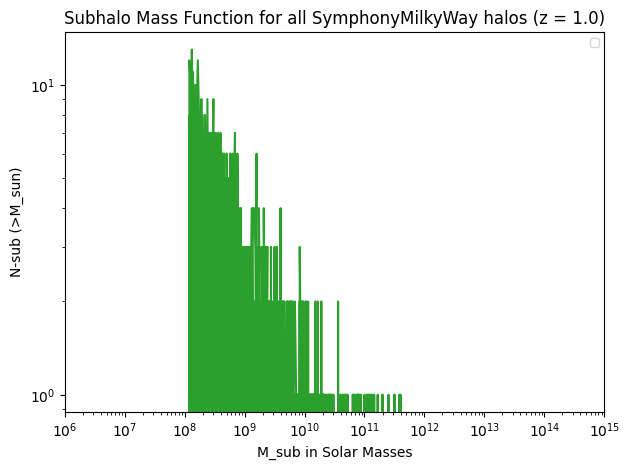

In [31]:
# now lets try this at redshift 1
# for only one symphony suite

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"

fig, ax = plt.subplots()
colors = ['tab:green','tab:pink','tab:orange','tab:blue',"tab:purple"]
#left_bins = bins[:-1]

# Mass function bins and empty histogram.
log_m_min, log_m_max, n_bin = 8, 12, 200
bins = np.logspace(log_m_min, log_m_max, n_bin+1)
left_bins = bins[:-1]

target_z = 1.0
target_a = 1 / (1 + target_z)
n_hosts = symlib.n_hosts(suite_name)

for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # find out which snapshot correspond to reshift 1 by comparing the scale factors      
    #target_z = 1.0
    #target_a = 1 / (1 + target_z)  # scale factor
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
    host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
    ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    # now i try to plot every halo for just one suite
    ax.plot(left_bins,n_vir, color = colors[0]) # color = colors[i_host])



# colors = ['tab:green','tab:pink','tab:orange','tab:blue']
#left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for all " + suite_name + " halos (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
# ax.plot(left_bins,N_vir, color = colors[0],label = suite_name)
ax.legend(loc = "upper right", fontsize = 8)
plt.tight_layout()
plt.show()

Text(0, 0.5, 'N-sub (>M_sun)')

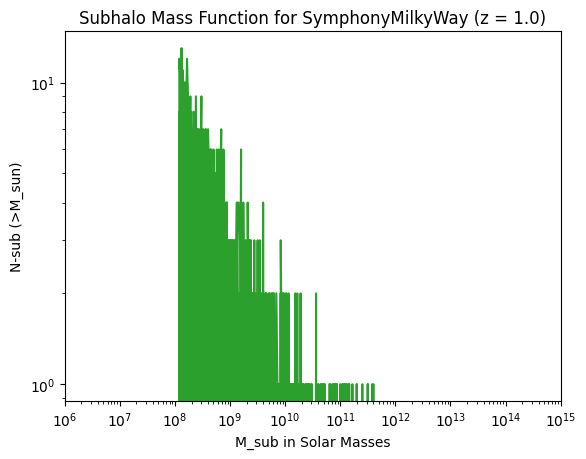

In [34]:
base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"

fig, ax = plt.subplots()
colors = ['tab:green','tab:pink','tab:orange','tab:blue']

# Mass function bins and empty histogram.
log_m_min, log_m_max, n_bin = 8, 12, 200
bins = np.logspace(log_m_min, log_m_max, n_bin+1)
N_vir = np.zeros(n_bin)

n_hosts = symlib.n_hosts(suite_name)
for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # find out which snapshot correspond to reshift 1 by comparing the scale factors      
    target_z = 1.0
    target_a = 1 / (1 + target_z)  # scale factor
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
    host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
    ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    left_bins = bins[:-1]
    ax.plot(left_bins,n_vir, color = colors[0])
    # add to the cumulative histograms
    # N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

# colors = ['tab:green','tab:pink','tab:orange','tab:blue']
#left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for " + suite_name + " (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
# ax.legend(loc = "upper right", fontsize = 8)

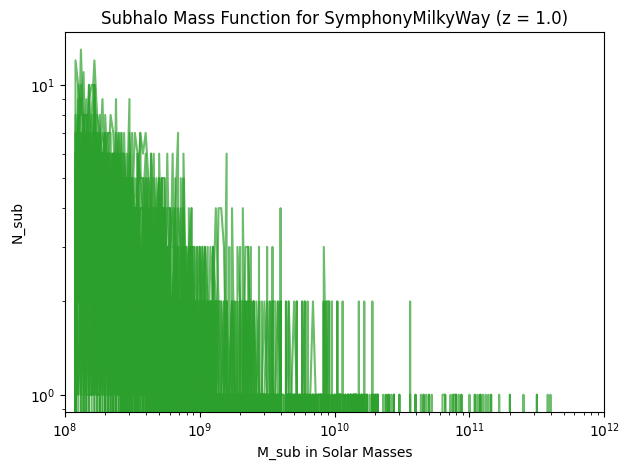

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import symlib  # your custom library

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"

fig, ax = plt.subplots()

# Mass function bins
log_m_min, log_m_max, n_bin = 8, 12, 200
bins = np.logspace(log_m_min, log_m_max, n_bin+1)
left_bins = bins[:-1]

n_hosts = symlib.n_hosts(suite_name)
target_z = 1.0
target_a = 1 / (1 + target_z)

for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    r = np.sqrt(np.sum(h['x'][:, snap]**2, axis=1))
    host_rvir = h["rvir"][0, snap]
    ok = h['ok'][:, snap] & (r < host_rvir)

    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    ax.plot(left_bins, n_vir, color='tab:green', alpha=0.7)

# Plot formatting
ax.set_xlim(1e8, 1e12)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title(f"Subhalo Mass Function for {suite_name} (z = {target_z})")
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N_sub")

plt.tight_layout()
plt.show()

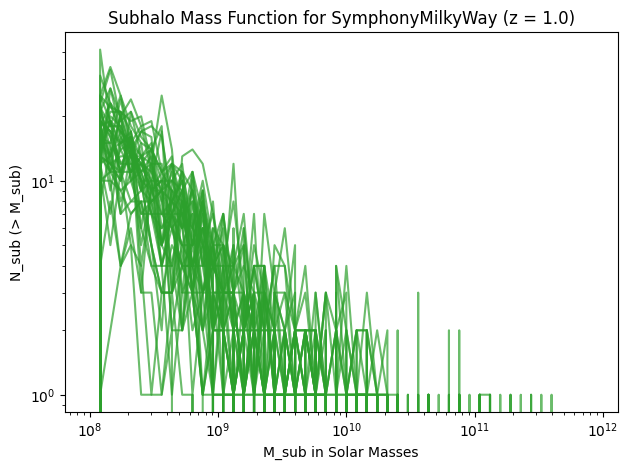

In [45]:

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"

fig, ax = plt.subplots()

# Mass function bins
log_m_min, log_m_max, n_bin = 8, 12, 50
bins = np.logspace(log_m_min, log_m_max, n_bin + 1)
left_bins = bins[:-1]

n_hosts = symlib.n_hosts(suite_name)
target_z = 1.0
target_a = 1 / (1 + target_z)

for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # Snapshot closest to z = 1
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))

    # Filter subhalos within host's virial radius
    r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
    host_rvir = h["rvir"][0, snapshot_index]
    ok = h['ok'][:, snapshot_index] & (r < host_rvir)

    # Compute differential histogram of mpeak
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    # Convert to cumulative: N(>M)
    cumulative_n_vir = np.cumsum(n_vir[::-1])[::-1]

    # Plot cumulative for this host
    ax.plot(left_bins, n_vir, color='tab:green', alpha=0.7)

# Plot formatting
# ax.set_xlim(1e6, 1e15)
# ax.set_ylim(1e-2, 1e3)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title(f"Subhalo Mass Function for {suite_name} (z = {target_z})")
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N_sub (> M_sub)")
# No legend
plt.tight_layout()
plt.show()

In [ ]:
# now lets try this at redshift 1
# for only one symphony suite

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"

fig, ax = plt.subplots()

# Mass function bins and empty histogram.
log_m_min, log_m_max, n_bin = 8, 12, 200
bins = np.logspace(log_m_min, log_m_max, n_bin+1)
N_vir = np.zeros(n_bin)

n_hosts = symlib.n_hosts(suite_name)
for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # find out which snapshot correspond to reshift 1 by comparing the scale factors      
    target_z = 1.0
    target_a = 1 / (1 + target_z)  # scale factor
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
    host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
    ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    # add to the cumulative histograms
    N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

colors = ['tab:green','tab:pink','tab:orange','tab:blue']
left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for " + suite_name + " (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
ax.plot(left_bins,N_vir, color = colors[0],label = suite_name)
ax.legend(loc = "upper right", fontsize = 8)

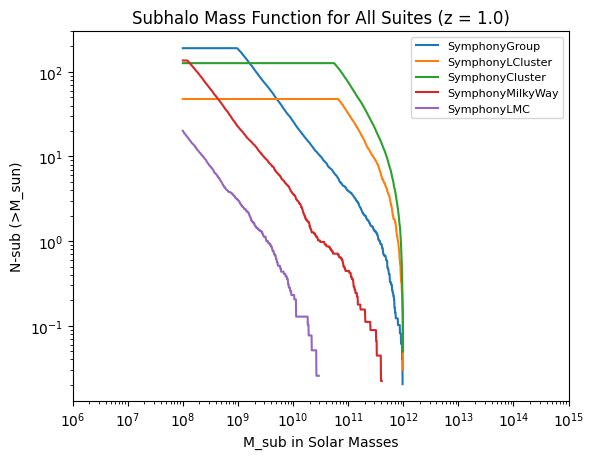

In [47]:
# now lets try this at redshift 1
# for any suite

base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

suite_masses = {"SymphonyGroup":10**13, "SymphonyLCluster":10**14, "SymphonyCluster":10**15,"SymphonyMilkyWay":10**12, "SymphonyLMC":10**11}


fig, ax = plt.subplots()

for suite in suite_list:
    suite_name = suite

    # Mass function bins and empty histogram.
    log_m_min, log_m_max = 8, 12, # n bin = int(10**(-4)*(suite_masses[suite]))
    n_bin = min(1000, max(30, int(1e-6 * suite_masses[suite])))
    bins = np.logspace(log_m_min, log_m_max, n_bin+1)
    N_vir = np.zeros(n_bin)

    n_hosts = symlib.n_hosts(suite_name)
    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        h, hist = symlib.read_subhalos(sim_dir)
        scale_factors = symlib.scale_factors(sim_dir)

        # find out which snapshot correspond to reshift 1 by comparing the scale factors      
        target_z = 1.0
        target_a = 1 / (1 + target_z)  # scale factor
        snapshot_index = np.argmin(np.abs(scale_factors - target_a))
        snap = snapshot_index

        r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
        host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
        ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts
    
    left_bins = bins[:-1]
    mask = N_vir > 0
    ax.plot(left_bins[mask], N_vir[mask], label=suite_name)
    # ax.plot(left_bins,N_vir,label = suite_name)

# left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for All Suites (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
# ax.plot(left_bins,N_vir,label = suite_name)
ax.legend(loc = "upper right", fontsize = 8)
plt.show()

Text(0, 0.5, 'N-sub (>M_sun)')

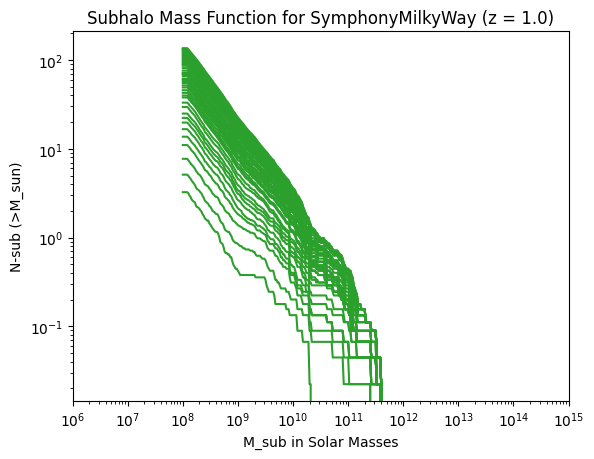

In [50]:
# now lets try this at redshift 1
# for only one symphony suite

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"

fig, ax = plt.subplots()

# Mass function bins and empty histogram.
log_m_min, log_m_max, n_bin = 8, 12, 200
bins = np.logspace(log_m_min, log_m_max, n_bin+1)
N_vir = np.zeros(n_bin)
left_bins = bins[:-1]
colors = ['tab:green','tab:pink','tab:orange','tab:blue']

n_hosts = symlib.n_hosts(suite_name)
for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # find out which snapshot correspond to reshift 1 by comparing the scale factors      
    target_z = 1.0
    target_a = 1 / (1 + target_z)  # scale factor
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
    host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
    ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    # add to the cumulative histograms
    N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts
    ax.plot(left_bins,N_vir, color = colors[0]) # label = suite_name)

# colors = ['tab:green','tab:pink','tab:orange','tab:blue']
# left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for " + suite_name + " (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
# ax.plot(left_bins,N_vir, color = colors[0],label = suite_name)
# ax.legend(loc = "upper right", fontsize = 8)

In [2]:
import numpy as np
import symlib
import matplotlib.pyplot as plt

Text(0, 0.5, 'N-sub (>M_sun)')

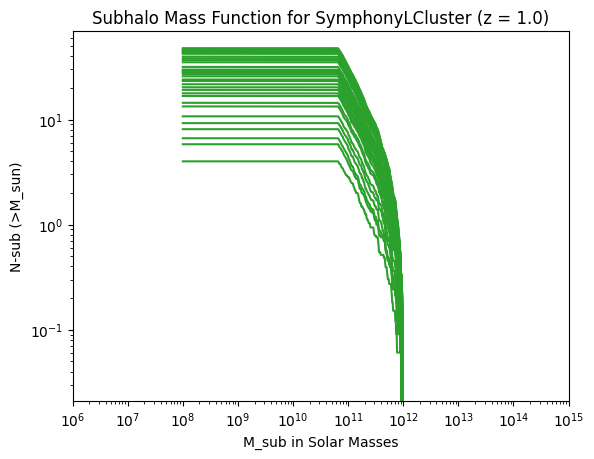

In [3]:
base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyLCluster"

fig, ax = plt.subplots()

# Mass function bins and empty histogram.
log_m_min, log_m_max, n_bin = 8, 12, 500
bins = np.logspace(log_m_min, log_m_max, int(n_bin+1))
N_vir = np.zeros(n_bin)
left_bins = bins[:-1]
colors = ['tab:green','tab:pink','tab:orange','tab:blue']

n_hosts = symlib.n_hosts(suite_name)
for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # find out which snapshot correspond to reshift 1 by comparing the scale factors      
    target_z = 1.0
    target_a = 1 / (1 + target_z)  # scale factor
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
    host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
    ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    # add to the cumulative histograms
    N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts
    ax.plot(left_bins,N_vir, color = colors[0]) # label = suite_name)

# colors = ['tab:green','tab:pink','tab:orange','tab:blue']
# left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for " + suite_name + " (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
# ax.plot(left_bins,N_vir, color = colors[0],label = suite_name)
# ax.legend(loc = "upper right", fontsize = 8)

Text(0, 0.5, 'N-sub (>M_sun)')

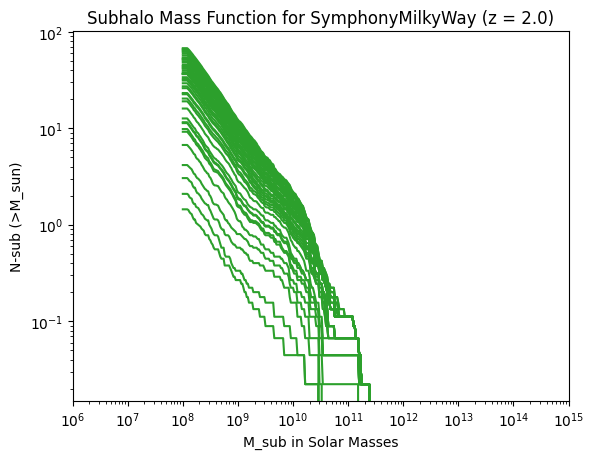

In [5]:
# now lets try this at redshift 1
# for only one symphony suite

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"

fig, ax = plt.subplots()

target_z = 2.0

# Mass function bins and empty histogram.
log_m_min, log_m_max, n_bin = 8, 12, 200
bins = np.logspace(log_m_min, log_m_max, n_bin+1)
N_vir = np.zeros(n_bin)
left_bins = bins[:-1]
colors = ['tab:green','tab:pink','tab:orange','tab:blue']

n_hosts = symlib.n_hosts(suite_name)
for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # find out which snapshot correspond to reshift 1 by comparing the scale factors      
    # target_z = 1.0
    target_a = 1 / (1 + target_z)  # scale factor
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
    host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
    ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

    # add to the cumulative histograms
    N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts
    ax.plot(left_bins,N_vir, color = colors[0]) # label = suite_name)

# colors = ['tab:green','tab:pink','tab:orange','tab:blue']
# left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for " + suite_name + " (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
# ax.plot(left_bins,N_vir, color = colors[0],label = suite_name)
# ax.legend(loc = "upper right", fontsize = 8)

Text(0, 0.5, 'N-sub (>M_sun)')

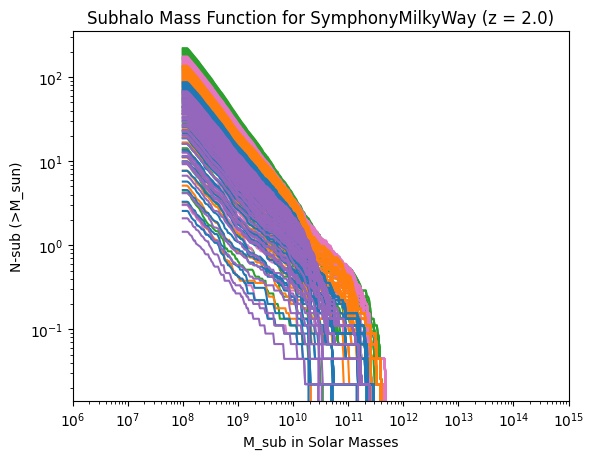

In [12]:
# turn into a function that can take any redshift


list_of_z = [0,0.5,1.0,1.5,2.0]

fig, ax = plt.subplots()
colors = ['tab:green','tab:pink','tab:orange','tab:blue', 'tab:purple']

for iz in range(len(list_of_z)):
    target_z = list_of_z[iz]

# Mass function bins and empty histogram.
    log_m_min, log_m_max, n_bin = 8, 12, 200
    bins = np.logspace(log_m_min, log_m_max, n_bin+1)
    N_vir = np.zeros(n_bin)
    left_bins = bins[:-1]
    # colors = ['tab:green','tab:pink','tab:orange','tab:blue']

    n_hosts = symlib.n_hosts(suite_name)
    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        h, hist = symlib.read_subhalos(sim_dir)
        scale_factors = symlib.scale_factors(sim_dir)

        # find out which snapshot correspond to reshift 1 by comparing the scale factors      
        # target_z = 1.0
        target_a = 1 / (1 + target_z)  # scale factor
        snapshot_index = np.argmin(np.abs(scale_factors - target_a))
        snap = snapshot_index

        r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
        host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
        ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts
        ax.plot(left_bins,N_vir,color = colors[iz]) # label = suite_name)

    # colors = ['tab:green','tab:pink','tab:orange','tab:blue']
    # left_bins = bins[:-1]
ax.set_xlim(1e6,1e15)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function for " + suite_name + " (z = " + str(target_z) + ")") 
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")


In [15]:
import matplotlib.pyplot as plt
import numpy as np
import symlib
import math

1 SymphonyGroup
2 SymphonyLMCelai/SymphonySuitesData/SymphonyGroup/Halo985 98.000000 % 
3 SymphonyMilkyWaySymphonySuitesData/SymphonyLMC/Halo933 97.000000 %  
/Users/roxannelai/SymphonySuitesData/SymphonyMilkyWay/Halo990 98.000000 %  

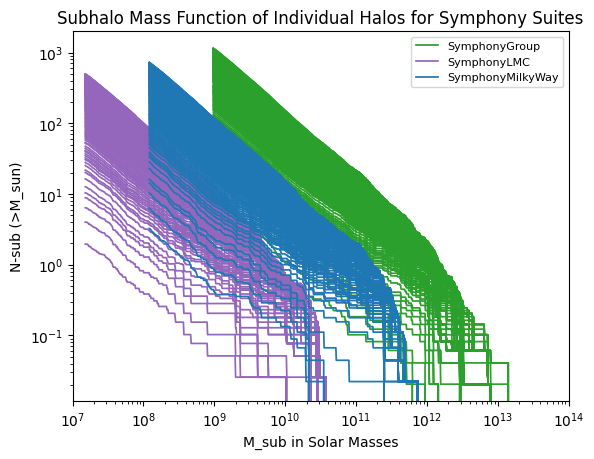

In [3]:
# try again with stephen's code

base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLMC","SymphonyMilkyWay"]



# ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

fig, ax = plt.subplots()
colors = ['tab:green','tab:purple','tab:blue']

for suite in range(len(suite_list)):
    print(suite+1,suite_list[suite])

    # setting up historgram bins 
    params = symlib.simulation_parameters(suite_list[suite])
    m_min = params ["mp"]/params["h100"]*300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min),np.log10(m_max), n_bins+1)
    left_bins = bins[:-1]

    # set up cumulative historgrams for mass function: 
    N_infall = np.zeros(n_bins)
    N_spashback = np.zeros(n_bins)
    N_vir = np.zeros(n_bins)

    n_hosts = symlib.n_hosts(suite_list[suite])

    for i_halo in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir,suite_list[suite],i_halo)
        scale_factors = symlib.scale_factors(sim_dir)
        redshifts = (1/scale_factors)-1
        n_snaps = len(scale_factors)

        special_snaps = [181,203,221,227]

        for snap in special_snaps:
        
            # read in simulation data:
            h,hist = symlib.read_subhalos(sim_dir)

            # all surviving subhalors within R_vir: 
            r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
            host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
            ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

            # add to the cumulative histograms
            N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

            label = suite_list[suite] if (i_halo == 0 and snap == special_snaps[0]) else None
            ax.plot(left_bins, N_vir, c=colors[suite], lw=1.25, label=label)

            progress = round(i_halo/n_hosts,2)*100
            print(sim_dir, f"{progress:2f} % \r", end = "",flush = True)

# configuring plot: 
ax.set_xlim(1e7,1e14)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function of Individual Halos for Symphony Suites")
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
#ax.plot(left_bins,N_vir, c = colors[suite % len(colors)], label = suite_list[suite])
ax.legend(loc = "upper right", fontsize = 8)




1 SymphonyGroup
2 SymphonyLMCelai/SymphonySuitesData/SymphonyGroup/Halo985 98.000000 % 
3 SymphonyMilkyWaySymphonySuitesData/SymphonyLMC/Halo933 97.000000 %  
/Users/roxannelai/SymphonySuitesData/SymphonyMilkyWay/Halo990 98.000000 %  

/var/folders/ts/qpx78zdd5cn6f312s8cs93s80000gn/T/ipykernel_23663/3265744489.py:65: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc = "upper right", fontsize = 8)


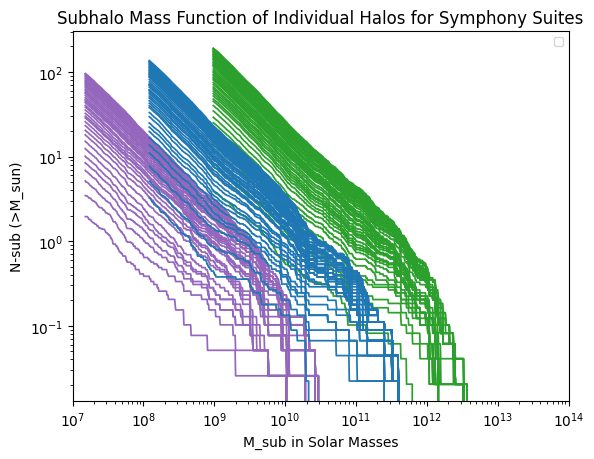

In [11]:
base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLMC","SymphonyMilkyWay"]

# ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

fig, ax = plt.subplots()
colors = ['tab:green','tab:purple','tab:blue']

for suite in range(len(suite_list)):
    print(suite+1,suite_list[suite])

    x
    # configuring plot: 
ax.set_xlim(1e7,1e14)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function of Individual Halos for Symphony Suites")
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
#ax.plot(left_bins,N_vir, c = colors[suite % len(colors)], label = suite_list[suite])
ax.legend(loc = "upper right", fontsize = 8)


In [ ]:
for suite in range(len(suite_list)):
    print(suite+1,suite_list[suite])

    # setting up historgram bins 
    params = symlib.simulation_parameters(suite_list[suite])
    m_min = params ["mp"]/params["h100"]*300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min),np.log10(m_max), n_bins+1)
    left_bins = bins[:-1]

    # set up cumulative historgrams for mass function: 
    N_infall = np.zeros(n_bins)
    N_spashback = np.zeros(n_bins)
    N_vir = np.zeros(n_bins)

    n_hosts = symlib.n_hosts(suite_list[suite])

    for i_halo in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir,suite_list[suite],i_halo)
        scale_factors = symlib.scale_factors(sim_dir)
        redshifts = (1/scale_factors)-1
        n_snaps = len(scale_factors)

        special_snaps = [181]

        for snap in special_snaps:
        
            # read in simulation data:
            h,hist = symlib.read_subhalos(sim_dir)

            # all surviving subhalors within R_vir: 
            r = np.sqrt(np.sum(h['x'][:,snap]**2, axis = 1)) # pulls all the radiuses of the subhalos at snapshot -1 (most current)
            host_rvir = h["rvir"][0,snap] # pulls the virial radius of the host halo
            ok = h['ok'][:,snap] & (r < host_rvir) # chooses only the subhalos still within the virial radius
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

            # add to the cumulative histograms
            N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts


            ax.plot(left_bins, N_vir,c=colors[suite],lw=1.25)

            progress = round(i_halo/n_hosts,2)*100
            print(sim_dir, f"{progress:2f} % \r", end = "",flush = True)

    # configuring plot: 
ax.set_xlim(1e7,1e14)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function of Individual Halos for Symphony Suites")
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
#ax.plot(left_bins,N_vir, c = colors[suite % len(colors)], label = suite_list[suite])
ax.legend(loc = "upper right", fontsize = 8)

In [10]:

# find out which snapshots corresponds to certain zs 

suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

list_of_z = [0,0.5,1,1.5,2]


for suite_name in suite_list: 

    for i_host in len
    sim_dir = symlib.get_host_directory(base_dir, suite_name) #, i_host)
    #h, hist = symlib.read_subhalos(sim_dir)
    scale_factors = symlib.scale_factors(sim_dir)

    # find out which snapshot correspond to reshift 1 by comparing the scale factors      
    target_z = 1.0
    target_a = 1 / (1 + target_z)  # scale factor
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))
    snap = snapshot_index

    print(suite_name + " snaphot " + str(snap) + " for z = " + str(target_z))

TypeError: get_host_directory() missing 1 required positional argument: 'halo_name'

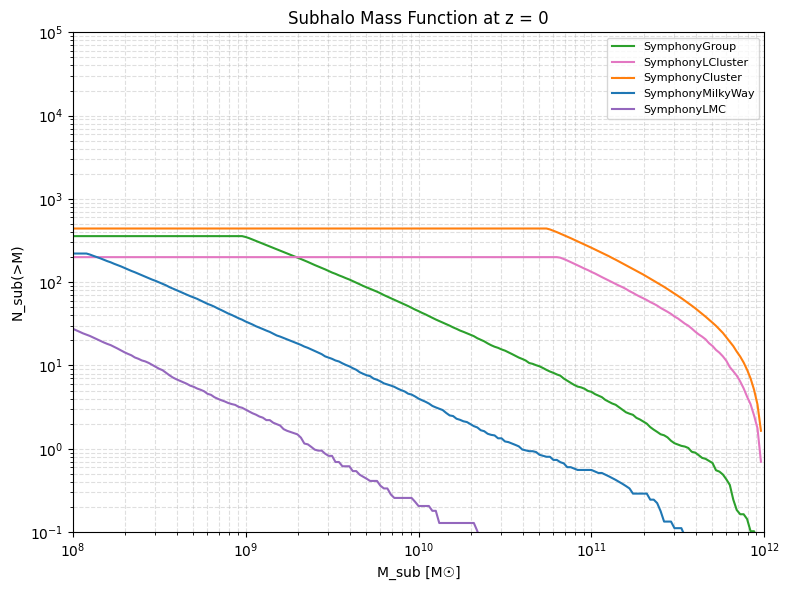

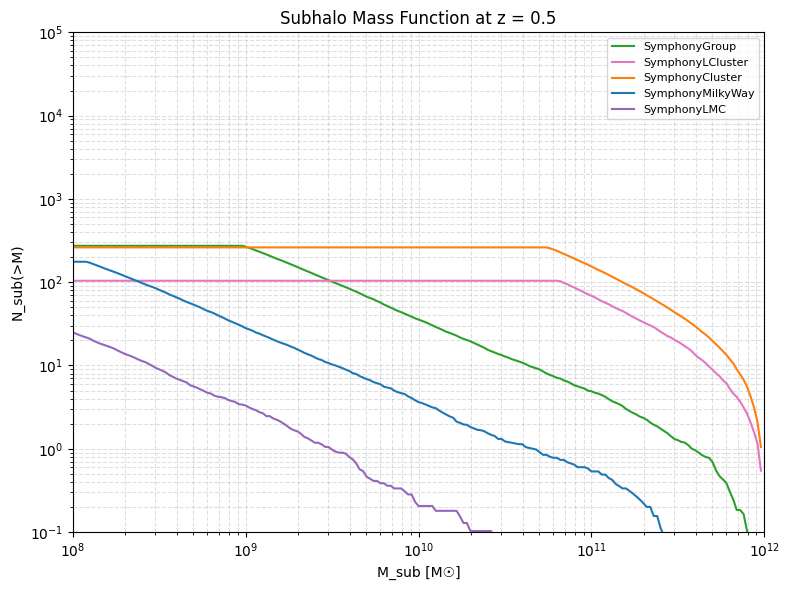

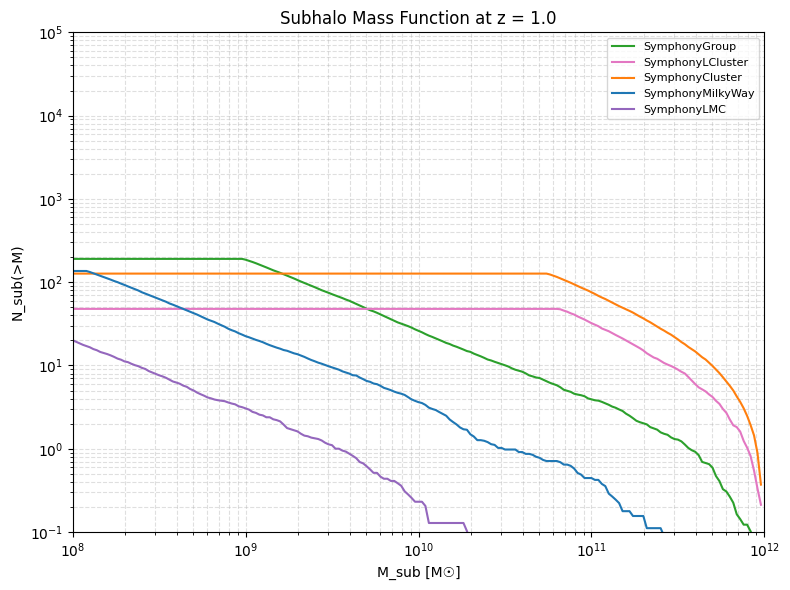

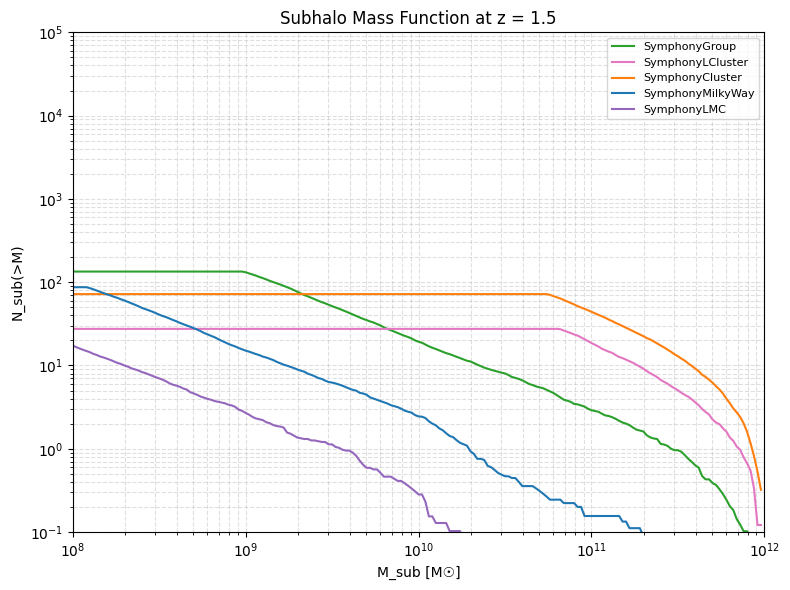

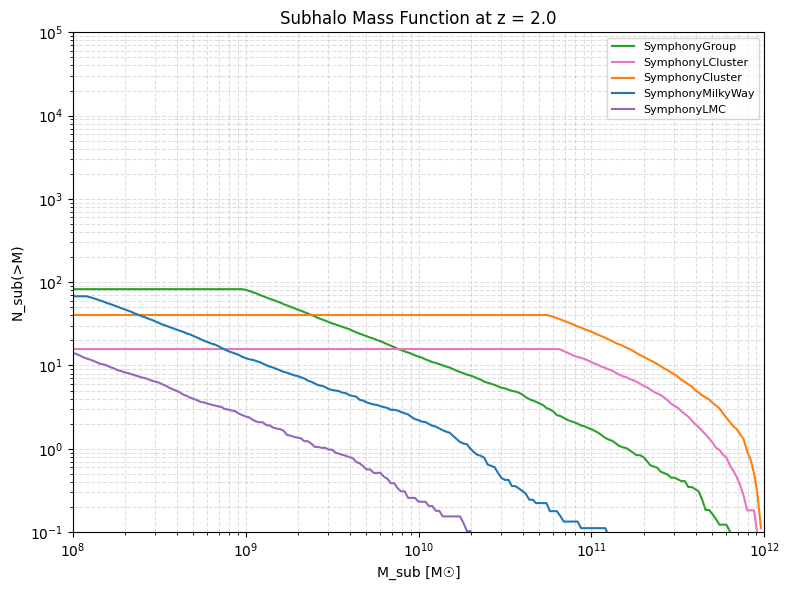

In [4]:
# this one looks weird

suite_list = ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster", "SymphonyMilkyWay", "SymphonyLMC"]
colors = ['tab:green', 'tab:pink', 'tab:orange', 'tab:blue', 'tab:purple']
list_of_z = [0, 0.5, 1.0, 1.5, 2.0]

log_m_min, log_m_max, n_bin = 8, 12, 200
bins = np.logspace(log_m_min, log_m_max, n_bin + 1)
left_bins = bins[:-1]

for target_z in list_of_z:
    target_a = 1 / (1 + target_z)

    fig, ax = plt.subplots(figsize=(8, 6))

    for i_suite, suite in enumerate(suite_list):
        n_hosts = symlib.n_hosts(suite)
        N_vir_total = np.zeros(n_bin)

        for i_host in range(n_hosts):
            sim_dir = symlib.get_host_directory(base_dir, suite, i_host)
            scale_factors = symlib.scale_factors(sim_dir)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            h, hist = symlib.read_subhalos(sim_dir)

            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

            N_vir_total += np.cumsum(n_vir[::-1])[::-1] / n_hosts

        ax.plot(left_bins, N_vir_total, lw=1.5, label=suite, color=colors[i_suite])

    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xlim(1e8, 1e12)
    ax.set_ylim(1e-1, 1e5)
    ax.set_title(suite + f"Subhalo Mass Function at z = {target_z}")
    ax.set_xlabel("M_sub [M☉]")
    ax.set_ylabel("N_sub(>M)")
    ax.legend(fontsize=8)
    ax.grid(True, which='both', linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

1 SymphonyGroup


TypeError: object of type 'int' has no len()

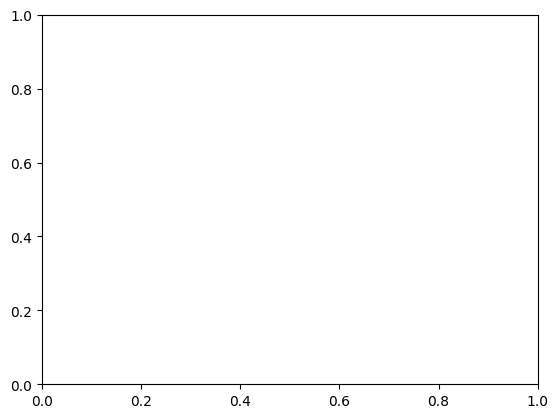

In [7]:
'''
target_a = 1 / (1 + target_z)
sim_dir = symlib.get_host_directory(base_dir, suite, i_host)
scale_factors = symlib.scale_factors(sim_dir)
snapshot_index = np.argmin(np.abs(scale_factors - target_a))

h, hist = symlib.read_subhalos(sim_dir)

r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
host_rvir = h["rvir"][0, snapshot_index]
ok = h['ok'][:, snapshot_index] & (r < host_rvir)
n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

'''


base_dir = "/Users/roxannelai/SymphonySuitesData" #path/to/base/dir"
suite_list = ["SymphonyGroup", "SymphonyLMC","SymphonyMilkyWay"]
list_of_z = [0, 0.5, 1.0, 1.5, 2.0]

# ["SymphonyGroup", "SymphonyLCluster", "SymphonyCluster","SymphonyMilkyWay", "SymphonyLMC"]

fig, ax = plt.subplots()
colors = ['tab:green','tab:purple','tab:blue']

target_z = 1.0

for suite in range(len(suite_list)):
    print(suite+1,suite_list[suite])

    # setting up historgram bins 
    params = symlib.simulation_parameters(suite_list[suite])
    m_min = params ["mp"]/params["h100"]*300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min),np.log10(m_max), n_bins+1)
    left_bins = bins[:-1]

    # set up cumulative historgrams for mass function: 
    N_infall = np.zeros(n_bins)
    N_spashback = np.zeros(n_bins)
    N_vir = np.zeros(n_bins)

    n_hosts = symlib.n_hosts(suite_list[suite])

    for i_host in range(n_hosts): # for each halo, find which snapshot corresponds to the current redshift z 
        sim_dir = symlib.get_host_directory(base_dir,suite_list[suite],i_host)
        scale_factors = symlib.scale_factors(sim_dir)
    

        target_a = 1 / (1 + target_z)
        # read in simulation data
        sim_dir = symlib.get_host_directory(base_dir, suite, i_host)
        h, hist = symlib.read_subhalos(sim_dir)
        
        # find which snapshot corresponds to current z
        scale_factors = symlib.scale_factors(sim_dir)
        snapshot_index = np.argmin(np.abs(scale_factors - target_a))

        # all surviving subhalos within R_vir:
        r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
        host_rvir = h["rvir"][0, snapshot_index]
        ok = h['ok'][:, snapshot_index] & (r < host_rvir)
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # add to the cumulative histograms
        N_vir += np.cumsum(n_vir[::-1])[::-1]/n_hosts

        label = suite_list[suite] if (i_halo == 0 and snap == special_snaps[0]) else None # add a label to the legend
        ax.plot(left_bins, N_vir, c=colors[suite], lw=1.25, label=label)


# configuring plot: 
ax.set_xlim(1e7,1e14)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title("Subhalo Mass Function of Individual Halos for Symphony Suites")
ax.set_xlabel("M_sub in Solar Masses")
ax.set_ylabel("N-sub (>M_sun)")
#ax.plot(left_bins,N_vir, c = colors[suite % len(colors)], label = suite_list[suite])
ax.legend(loc = "upper right", fontsize = 8)

    

1. SymphonyGroup
2. SymphonyLMC
3. SymphonyMilkyWay


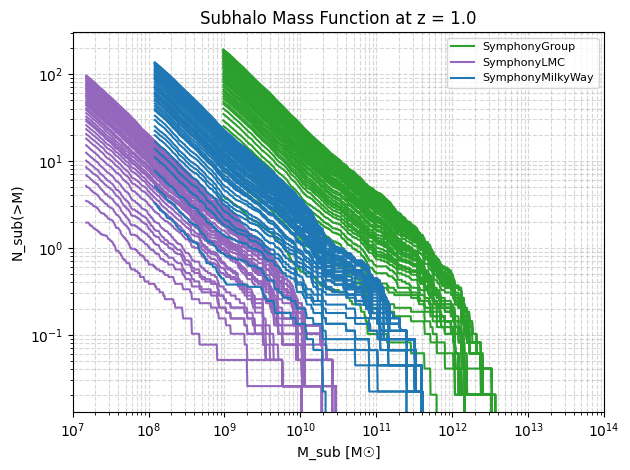

In [10]:
base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay"]
colors = ['tab:green', 'tab:purple', 'tab:blue']
target_z = 1.0

fig, ax = plt.subplots()

for suite_index, suite_name in enumerate(suite_list):
    print(f"{suite_index + 1}. {suite_name}")

    # Set up histogram bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)
    left_bins = bins[:-1]

    # Set up cumulative histogram
    N_vir = np.zeros(n_bins)
    n_hosts = symlib.n_hosts(suite_name)

    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        target_a = 1 / (1 + target_z)
        snapshot_index = np.argmin(np.abs(scale_factors - target_a))

        h, hist = symlib.read_subhalos(sim_dir)

        # Select subhalos within R_vir
        r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
        host_rvir = h["rvir"][0, snapshot_index]
        ok = h['ok'][:, snapshot_index] & (r < host_rvir)
        n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

        # Average cumulative histogram
        N_vir += np.cumsum(n_vir[::-1])[::-1] / n_hosts

        label = suite_name if i_host == 0 else None #(i_halo == 0 and snap == special_snaps[0]) else None # add a label to the legend

        # Plot all lines per suite with label
        ax.plot(left_bins, N_vir, c=colors[suite_index], lw=1.5, label=label)

# Configure plot
ax.set_xlim(1e7, 1e14)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_title(f"Subhalo Mass Functions at z = {target_z}")
ax.set_xlabel("M_sub [M☉]")
ax.set_ylabel("N_sub(>M)")
ax.legend(loc="upper right", fontsize=8)
ax.grid(True, which='both', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

1. SymphonyGroup
2. SymphonyLMC
3. SymphonyMilkyWay


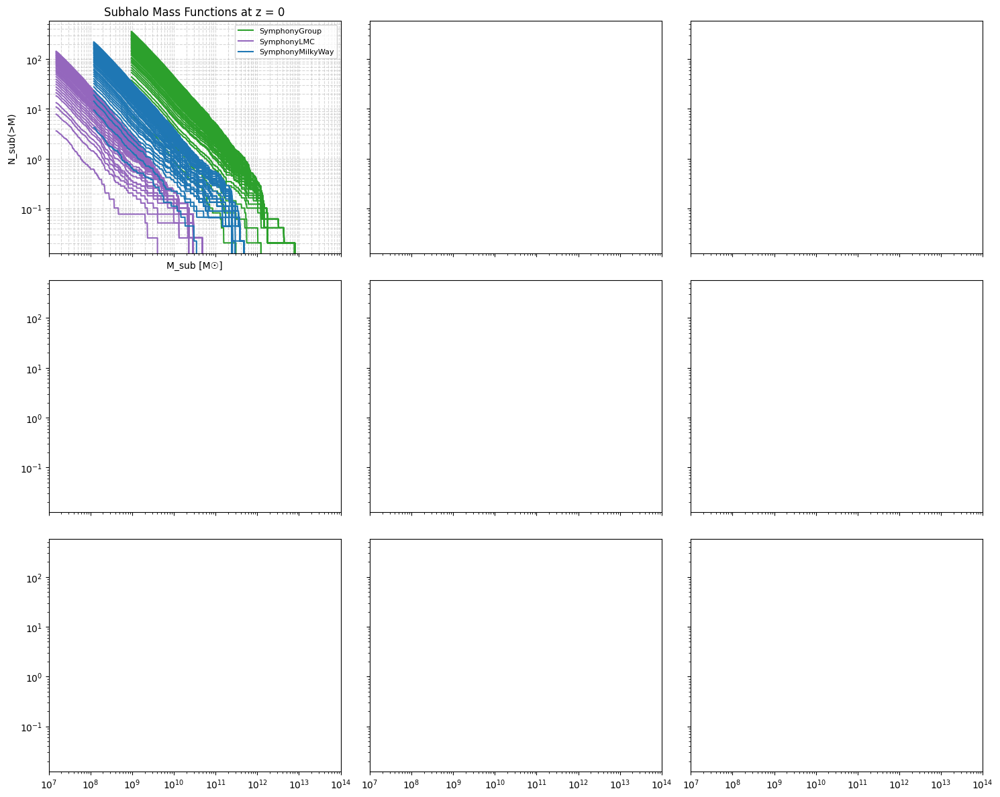

1. SymphonyGroup
2. SymphonyLMC
3. SymphonyMilkyWay


<Figure size 640x480 with 0 Axes>

1. SymphonyGroup
2. SymphonyLMC
3. SymphonyMilkyWay


<Figure size 640x480 with 0 Axes>

1. SymphonyGroup
2. SymphonyLMC
3. SymphonyMilkyWay


<Figure size 640x480 with 0 Axes>

1. SymphonyGroup
2. SymphonyLMC
3. SymphonyMilkyWay


<Figure size 640x480 with 0 Axes>

1. SymphonyGroup
2. SymphonyLMC
3. SymphonyMilkyWay


<Figure size 640x480 with 0 Axes>

1. SymphonyGroup
2. SymphonyLMC
3. SymphonyMilkyWay


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [16]:
# excellend now loop for different redshifts 


base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay"]
colors = ['tab:green', 'tab:purple', 'tab:blue']
list_of_z = [0,0.1,0.2,0.5, 1.0, 1.5, 2.0]


# Dynamically determine layout
n_cols = 3
n_rows = math.ceil(len(list_of_z) / n_cols)

fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), sharex=True, sharey=True)
axs = axs.flatten()  # make 1D list for easy indexing


for z_index, target_z in enumerate(list_of_z):
    ax = axs[z_index]

    # create a new plot for every redshift 
    #fig, ax = plt.subplots()

    for suite_index, suite_name in enumerate(suite_list):
        print(f"{suite_index + 1}. {suite_name}")

        # Set up histogram bins
        params = symlib.simulation_parameters(suite_name)
        m_min = params["mp"] / params["h100"] * 300
        m_max = 1e14
        n_bins = 1000
        bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)
        left_bins = bins[:-1]

        # Set up cumulative histogram
        N_vir = np.zeros(n_bins)
        n_hosts = symlib.n_hosts(suite_name)

        for i_host in range(n_hosts):
            sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
            scale_factors = symlib.scale_factors(sim_dir)
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            h, hist = symlib.read_subhalos(sim_dir)

            # Select subhalos within R_vir
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)

            # Average cumulative histogram
            N_vir += np.cumsum(n_vir[::-1])[::-1] / n_hosts
    
            label = suite_name if i_host == 0 else None #(i_halo == 0 and snap == special_snaps[0]) else None # add a label to the legend

            # Plot all lines per suite with label
            ax.plot(left_bins, N_vir, c=colors[suite_index], lw=1.5, label=label)

    # Configure plot
    ax.set_xlim(1e7, 1e14)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title(f"Subhalo Mass Functions at z = {target_z}")
    ax.set_xlabel("M_sub [M☉]")
    ax.set_ylabel("N_sub(>M)")
    ax.legend(loc="upper right", fontsize=8)
    ax.grid(True, which='both', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()


for i in range(len(list_of_z), len(axs)):
    fig.delaxes(axs[i])


handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=len(suite_list), fontsize=10)

fig.suptitle("Subhalo Mass Function at Multiple Redshifts", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import symlib
from matplotlib.lines import Line2D

1. SymphonyGroup at z = 0
1. SymphonyGroup at z = 0.1
1. SymphonyGroup at z = 0.2
1. SymphonyGroup at z = 0.5
1. SymphonyGroup at z = 1.0
1. SymphonyGroup at z = 1.5
1. SymphonyGroup at z = 2.0
2. SymphonyLMC at z = 0
2. SymphonyLMC at z = 0.1
2. SymphonyLMC at z = 0.2
2. SymphonyLMC at z = 0.5
2. SymphonyLMC at z = 1.0
2. SymphonyLMC at z = 1.5
2. SymphonyLMC at z = 2.0
3. SymphonyMilkyWay at z = 0
3. SymphonyMilkyWay at z = 0.1
3. SymphonyMilkyWay at z = 0.2
3. SymphonyMilkyWay at z = 0.5
3. SymphonyMilkyWay at z = 1.0
3. SymphonyMilkyWay at z = 1.5
3. SymphonyMilkyWay at z = 2.0
4. SymphonyCluster at z = 0
4. SymphonyCluster at z = 0.1
4. SymphonyCluster at z = 0.2
4. SymphonyCluster at z = 0.5
4. SymphonyCluster at z = 1.0
4. SymphonyCluster at z = 1.5
4. SymphonyCluster at z = 2.0
5. SymphonyLCluster at z = 0
5. SymphonyLCluster at z = 0.1
5. SymphonyLCluster at z = 0.2
5. SymphonyLCluster at z = 0.5
5. SymphonyLCluster at z = 1.0
5. SymphonyLCluster at z = 1.5
5. SymphonyLCluster

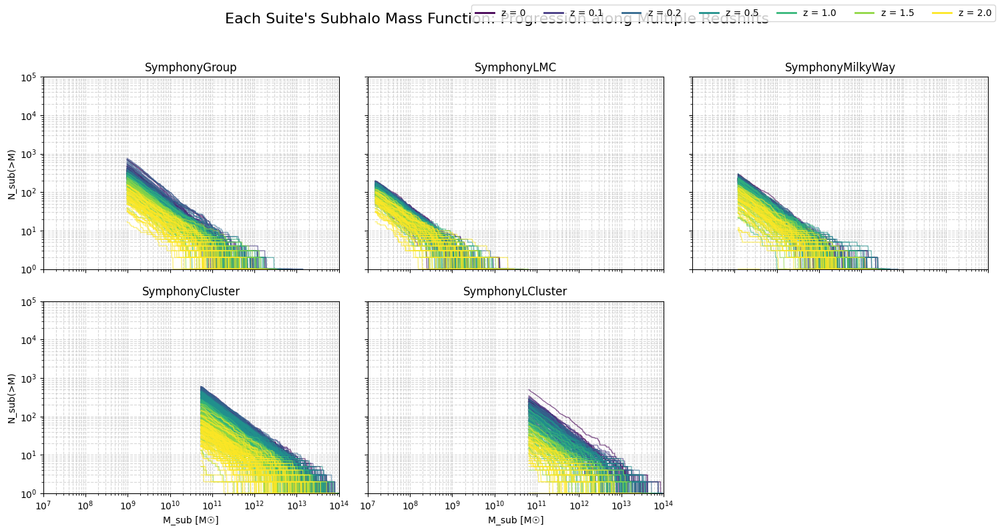

In [4]:
# great now plot every suite's progression from redshift 0 to 2.0



base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
colors = ['tab:green', 'tab:purple', 'tab:blue', 'tab:red','tab:orange']
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]
z_colors = plt.cm.viridis(np.linspace(0, 1, len(list_of_z)))

# Layout setup
n_cols = 3
n_rows = math.ceil(len(suite_list) / n_cols)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows), sharex=True, sharey=True)
axs = axs.flatten()

for suite_index, suite_name in enumerate(suite_list):
    ax = axs[suite_index] # every suite gets a different plot

    for z_index, target_z in enumerate(list_of_z):
        print(f"{suite_index + 1}. {suite_name} at z = {target_z}")

        # Histogram bins
        params = symlib.simulation_parameters(suite_name)
        m_min = params["mp"] / params["h100"] * 300
        m_max = 1e14
        n_bins = 1000
        bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)
        left_bins = bins[:-1]

        n_hosts = symlib.n_hosts(suite_name)

        for i_host in range(n_hosts):
            sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
            scale_factors = symlib.scale_factors(sim_dir)
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            h, hist = symlib.read_subhalos(sim_dir)

            # Subhalos within R_vir
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            N_vir = np.cumsum(n_vir[::-1])[::-1]

            label = f"z = {target_z}" if i_host == 0 else None
            ax.plot(left_bins, N_vir, c=z_colors[z_index], lw=1.0, alpha=0.6, label=label)

    ax.set_xlim(1e7, 1e14)
    ax.set_ylim(1e0, 1e5)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title(suite_name)
    ax.grid(True, which='both', linestyle='--', alpha=0.5)

    # Axes labels only for edge plots
    if suite_index >= len(axs) - n_cols:
        ax.set_xlabel("M_sub [M☉]")
    if suite_index % n_cols == 0:
        ax.set_ylabel("N_sub(>M)")

# Remove unused axes
for i in range(len(suite_list), len(axs)):
    fig.delaxes(axs[i])


# Global legend (z colors)
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color=z_colors[i], lw=2, label=f"z = {list_of_z[i]}")
    for i in range(len(list_of_z))
]
fig.legend(legend_elements, [f"z = {z}" for z in list_of_z],
           loc='upper right', ncol=len(list_of_z), fontsize=10)

fig.suptitle("Each Suite's Subhalo Mass Function: Progression along Multiple Redshifts", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()




In [1]:
import matplotlib.pyplot as plt
import numpy as np
import symlib

In [2]:

from matplotlib.lines import Line2D

1. SymphonyGroup at z = 0
1. SymphonyGroup at z = 0.1
1. SymphonyGroup at z = 0.2
1. SymphonyGroup at z = 0.5
1. SymphonyGroup at z = 1.0
1. SymphonyGroup at z = 1.5
1. SymphonyGroup at z = 2.0
2. SymphonyLMC at z = 0
2. SymphonyLMC at z = 0.1
2. SymphonyLMC at z = 0.2
2. SymphonyLMC at z = 0.5
2. SymphonyLMC at z = 1.0
2. SymphonyLMC at z = 1.5
2. SymphonyLMC at z = 2.0
3. SymphonyMilkyWay at z = 0
3. SymphonyMilkyWay at z = 0.1
3. SymphonyMilkyWay at z = 0.2
3. SymphonyMilkyWay at z = 0.5
3. SymphonyMilkyWay at z = 1.0
3. SymphonyMilkyWay at z = 1.5
3. SymphonyMilkyWay at z = 2.0
4. SymphonyCluster at z = 0
4. SymphonyCluster at z = 0.1
4. SymphonyCluster at z = 0.2
4. SymphonyCluster at z = 0.5
4. SymphonyCluster at z = 1.0
4. SymphonyCluster at z = 1.5
4. SymphonyCluster at z = 2.0
5. SymphonyLCluster at z = 0
5. SymphonyLCluster at z = 0.1
5. SymphonyLCluster at z = 0.2
5. SymphonyLCluster at z = 0.5
5. SymphonyLCluster at z = 1.0
5. SymphonyLCluster at z = 1.5
5. SymphonyLCluster

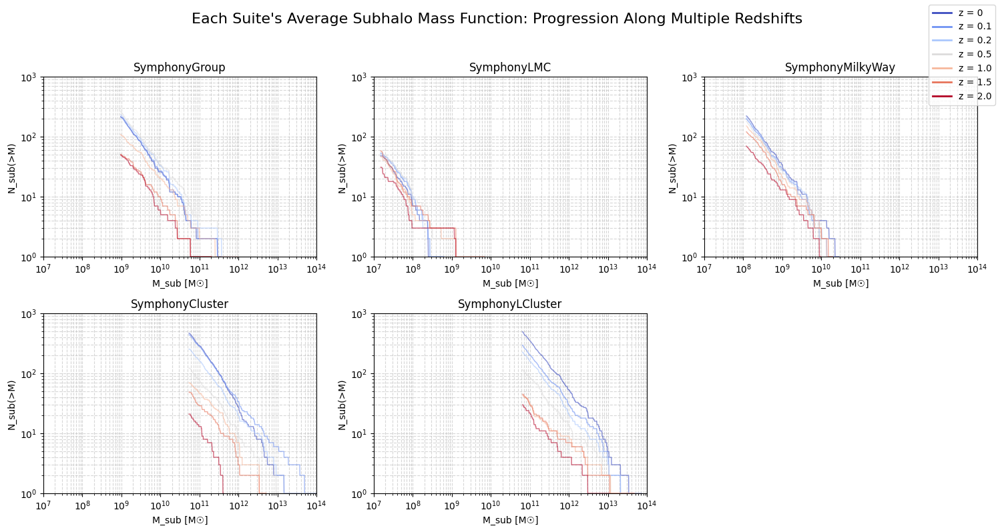

In [24]:

# now to to average them so it doesnt look as messy

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
colors = ['tab:green', 'tab:purple', 'tab:blue', 'tab:red','tab:orange']
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

# try the coolwarm color scheme to emulate increasing REDshift lol
z_colors = plt.cm.coolwarm(np.linspace(0, 1, len(list_of_z)))

# Layout setup
n_cols = 3
n_rows = math.ceil(len(suite_list) / n_cols)
fig, axs = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 4 * n_rows))
axs = axs.flatten()

for suite_index, suite_name in enumerate(suite_list):
    ax = axs[suite_index] # every suite gets a different plot

     # Histogram bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)
    left_bins = bins[:-1]

    n_hosts = symlib.n_hosts(suite_name)

    for z_index, target_z in enumerate(list_of_z):
        print(f"{suite_index + 1}. {suite_name} at z = {target_z}")
        N_all_hosts=[]

        for i_host in range(n_hosts):
            sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
            scale_factors = symlib.scale_factors(sim_dir)
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            h, hist = symlib.read_subhalos(sim_dir)

            # Subhalos within R_vir
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            N_vir = np.cumsum(n_vir[::-1])[::-1]
            N_all_hosts.append(N_vir)

        # average over all hosts
        mean_N_vir = np.mean(N_all_hosts, axis=0)
            # label = f"z = {target_z}" if i_host == 0 else None
        ax.plot(left_bins, N_vir, c=z_colors[z_index], lw=1.0, alpha=0.6, label=f"z = {target_z}")

    ax.set_xlim(1e7, 1e14)
    ax.set_ylim(1e0, 1e3)
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_title(suite_name)
    ax.grid(True, which='both', linestyle='--', alpha=0.5)
    ax.set_xlabel("M_sub [M☉]")
    ax.set_ylabel("N_sub(>M)")

# Remove unused axes
for i in range(len(suite_list), len(axs)):
    fig.delaxes(axs[i])

# Global legend (z colors)
legend_elements = [
    Line2D([0], [0], color=z_colors[i], lw=2, label=f"z = {list_of_z[i]}")
    for i in range(len(list_of_z))
]
fig.legend(legend_elements, [f"z = {z}" for z in list_of_z],
           loc='upper right', fontsize=10)

fig.suptitle("Each Suite's Average Subhalo Mass Function: Progression Along Multiple Redshifts", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


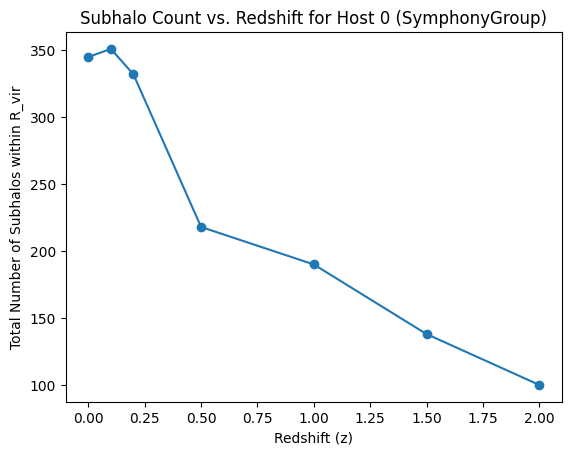

In [11]:

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

sim_dir = symlib.get_host_directory(base_dir, suite_name, 0)
scale_factors = symlib.scale_factors(sim_dir)

# Setup for mass bins
params = symlib.simulation_parameters(suite_name)
m_min = params["mp"] / params["h100"] * 300
m_max = 1e14
n_bins = 1000
bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

# Read halo data once
h, hist = symlib.read_subhalos(sim_dir)

# Store total halo counts at each redshift
total_halos = []

for target_z in list_of_z:
    target_a = 1 / (1 + target_z)
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))

    # Distance from center
    r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
    host_rvir = h["rvir"][0, snapshot_index]
    ok = h['ok'][:, snapshot_index] & (r < host_rvir)

    # Count subhalos within R_vir (excluding central)
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
    total_halos.append(np.sum(n_vir))

# Plotting
fig, ax = plt.subplots()
ax.plot(list_of_z, total_halos, marker='o')
ax.set_xlabel("Redshift (z)")
ax.set_ylabel("Total Number of Subhalos within R_vir")
ax.set_title(f"Subhalo Count vs. Redshift for Host 0 ({suite_name})")
# ax.grid(True)
plt.show()

In [ ]:

# now plot total mass of halo 0 at each redshift
# total mass = mass_host + sum(mass_subhalos)

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

sim_dir = symlib.get_host_directory(base_dir, suite_name, 0)
scale_factors = symlib.scale_factors(sim_dir)

# Setup for mass bins
params = symlib.simulation_parameters(suite_name)
m_min = params["mp"] / params["h100"] * 300
m_max = 1e14
n_bins = 1000
bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

# Read halo data once
h, hist = symlib.read_subhalos(sim_dir)

# Store total halo counts at each redshift
total_halos = []

for target_z in list_of_z:
    target_a = 1 / (1 + target_z)
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))

    # Distance from center
    r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
    host_rvir = h["rvir"][0, snapshot_index]
    ok = h['ok'][:, snapshot_index] & (r < host_rvir)

    # Count subhalos within R_vir (excluding central)
    n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
    total_halos.append(np.sum(n_vir))

# Plotting
fig, ax = plt.subplots()
ax.plot(list_of_z, total_halos, marker='o')
ax.set_xlabel("Redshift (z)")
ax.set_ylabel("Total Number of Subhalos within R_vir")
ax.set_title(f"Subhalo Count vs. Redshift for Host 0 ({suite_name})")
# ax.grid(True

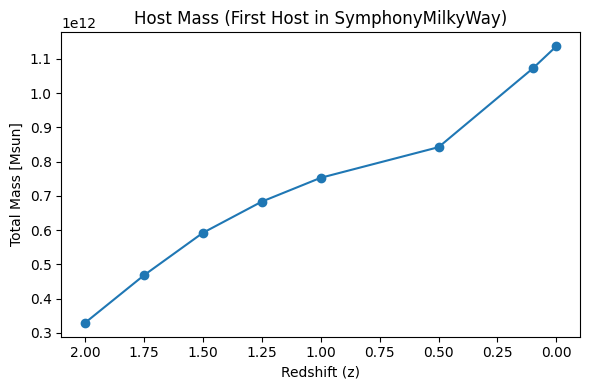

In [60]:
base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"  # Change if needed
list_of_z = [0, 0.1, 0.5, 1.0,1.25,1.5,1.75, 2.0]  # Whatever redshifts you want

# Load simulation parameters
params = symlib.simulation_parameters(suite_name)
h100 = params["h100"]

# Store total mass for first host
total_mass_all_z = []

# FIRST host only
i_host = 0
sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
scale_factors = symlib.scale_factors(sim_dir)
h, _ = symlib.read_subhalos(sim_dir)

for target_z in list_of_z:
    target_a = 1 / (1 + target_z)
    snapshot_index = np.argmin(np.abs(scale_factors - target_a))

    # Host mass
    host_mass = h["mvir"][0, snapshot_index]

    # Subhalo filtering (not the host, within R_vir, still alive)
   # r = np.sqrt(np.sum(h["x"][:, snapshot_index]**2, axis=1))
   # rvir = h["rvir"][0, snapshot_index]
   # is_subhalo = np.arange(len(h["ok"])) > 0
    #ok = h["ok"][:, snapshot_index] & is_subhalo & (r < rvir)

    #subhalo_mass = np.sum(h["mvir"][ok, snapshot_index])
    total_mass = host_mass / h100  # Convert to physical Msun
    total_mass_all_z.append(host_mass)

# Plotting
plt.figure(figsize=(6, 4))
plt.plot(list_of_z, total_mass_all_z, marker='o', color='tab:blue')
plt.xlabel("Redshift (z)")
plt.ylabel("Total Mass [Msun]")
plt.title(f"Host Mass (First Host in {suite_name})")
plt.gca().invert_xaxis()
# plt.grid(True)
plt.tight_layout()
plt.show()

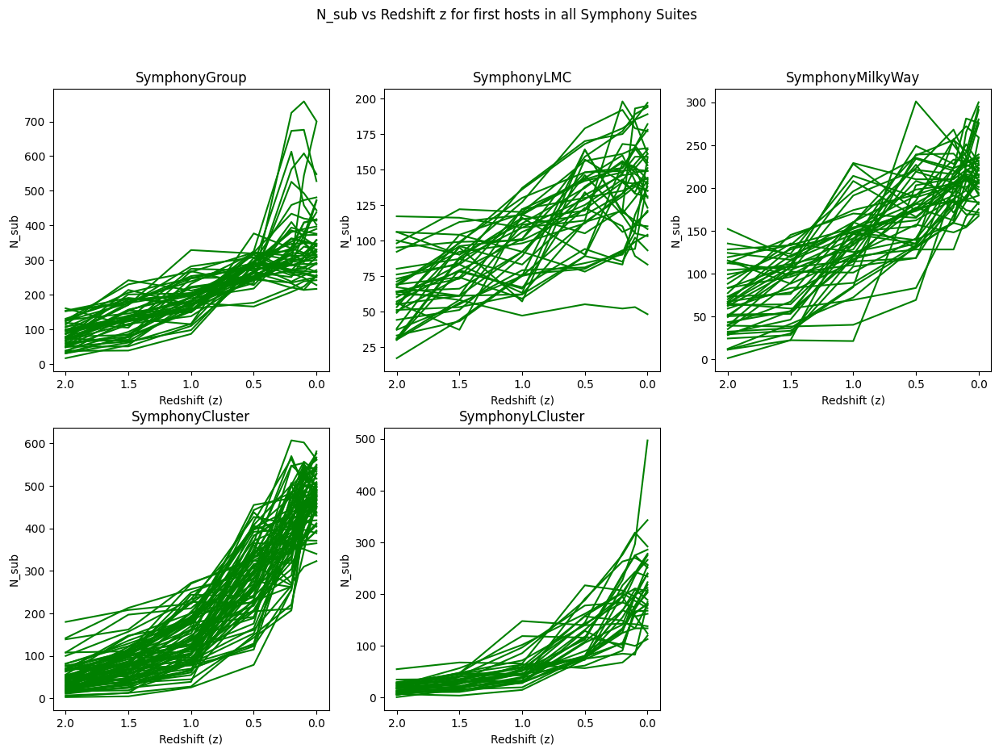

In [47]:
# Now try looping over several suites
import matplotlib.pyplot as plt


base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        total_halos = []
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Distance from center
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir))
        ax[suite_index].plot(list_of_z,total_halos,color = "green")
        ax[suite_index].invert_xaxis()
        

    # Plotting
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub")
    ax[suite_index].set_title(suite_name)
    # ax.grid(True)

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])
    
fig.suptitle("N_sub vs Redshift z for first hosts in all Symphony Suites")
plt.show()

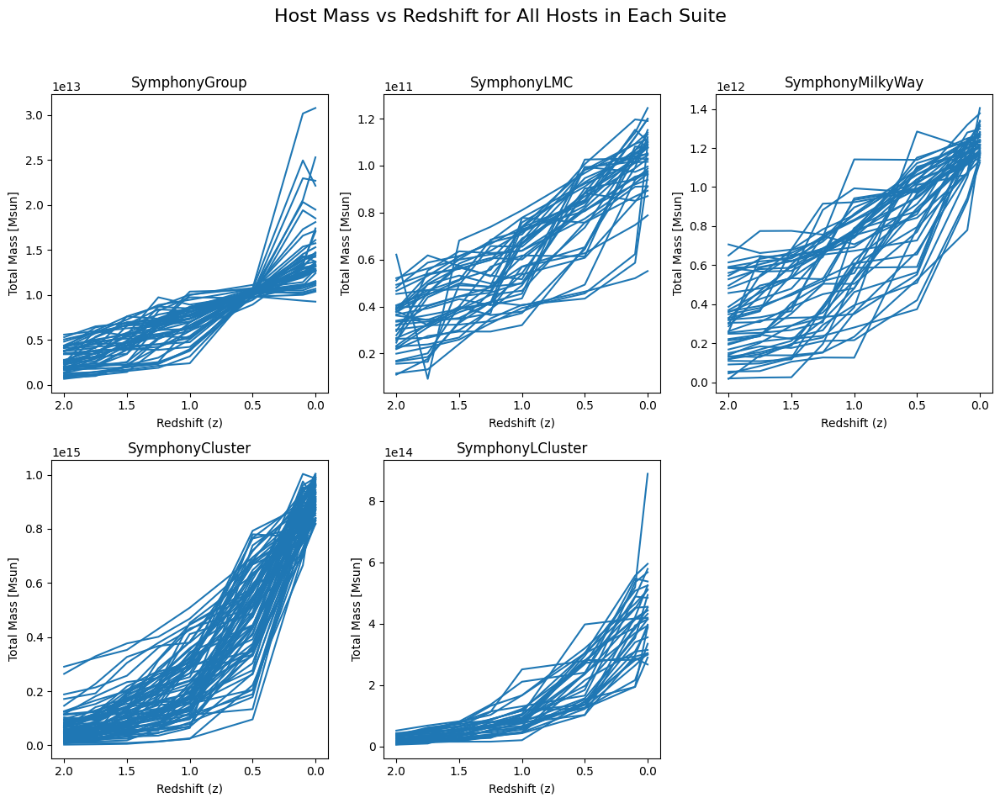

In [62]:
base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
list_of_z = [0, 0.1, 0.5, 1.0,1.25,1.5,1.75, 2.0]  # Whatever redshifts you want

fig, ax = plt.subplots(2,3, figsize = (12,10))
ax = ax.flatten()

for suite_index, suite_name in enumerate(suite_list):

    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]

    n_hosts = symlib.n_hosts(suite_name)
    # plt.figure(figsize=(8, 6))

    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, _ = symlib.read_subhalos(sim_dir)

        total_mass_all_z = []

        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

        ax[suite_index].plot(list_of_z, total_mass_all_z, color='tab:blue')
        ax[suite_index].invert_xaxis()

    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("Total Mass [Msun]")
    # ax[suite_index].title(f"Host + Subhalo Mass for All Hosts in {suite_name}")
    ax[suite_index].set_title(suite_name)
    # plt.gca().invert_xaxis()

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])

fig.suptitle("Host Mass vs Redshift for All Hosts in Each Suite", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.gca().invert_xaxis()
plt.show()

In [ ]:
# now work on averaging them

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_name = "SymphonyMilkyWay"  # Change if needed
list_of_z = [0, 0.1, 0.5, 1.0,1.25,1.5,1.75, 2.0]  # Whatever redshifts you want

#fig, ax = plt.subplots(2,3, figsize = (8,15))
#ax = ax.flatten



params = symlib.simulation_parameters(suite_name)
h100 = params["h100"]

n_hosts = symlib.n_hosts(suite_name)
plt.figure(figsize=(8, 6))

for i_host in range(n_hosts):
    sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
    scale_factors = symlib.scale_factors(sim_dir)
    h, _ = symlib.read_subhalos(sim_dir)

    total_mass_all_z = []

    for target_z in list_of_z:
        target_a = 1 / (1 + target_z)
        snapshot_index = np.argmin(np.abs(scale_factors - target_a))

        # Host mass
        host_mass = h["mvir"][0, snapshot_index]

        # Subhalo filtering (not the host, within R_vir, still alive)
        #r = np.sqrt(np.sum(h["x"][:, snapshot_index]**2, axis=1))
        #rvir = h["rvir"][0, snapshot_index]
        #is_subhalo = np.arange(len(h["ok"])) > 0
        #ok = h["ok"][:, snapshot_index] & is_subhalo & (r < rvir)

        subhalo_mass = np.sum(h["mvir"][ok, snapshot_index])
        total_mass = (host_mass + subhalo_mass) / h100  # Convert to physical Msun

        total_mass_all_z.append(total_mass)

    plt.plot(list_of_z, total_mass_all_z, color='tab:blue')
    plt.gca().invert_xaxis()

plt.xlabel("Redshift (z)")
plt.ylabel("Total Mass [Msun]")
plt.title(f"Average Host Mass for All Hosts in {suite_name}")
plt.gca().invert_xaxis()
# plt.grid(True)
plt.tight_layout()
plt.show()

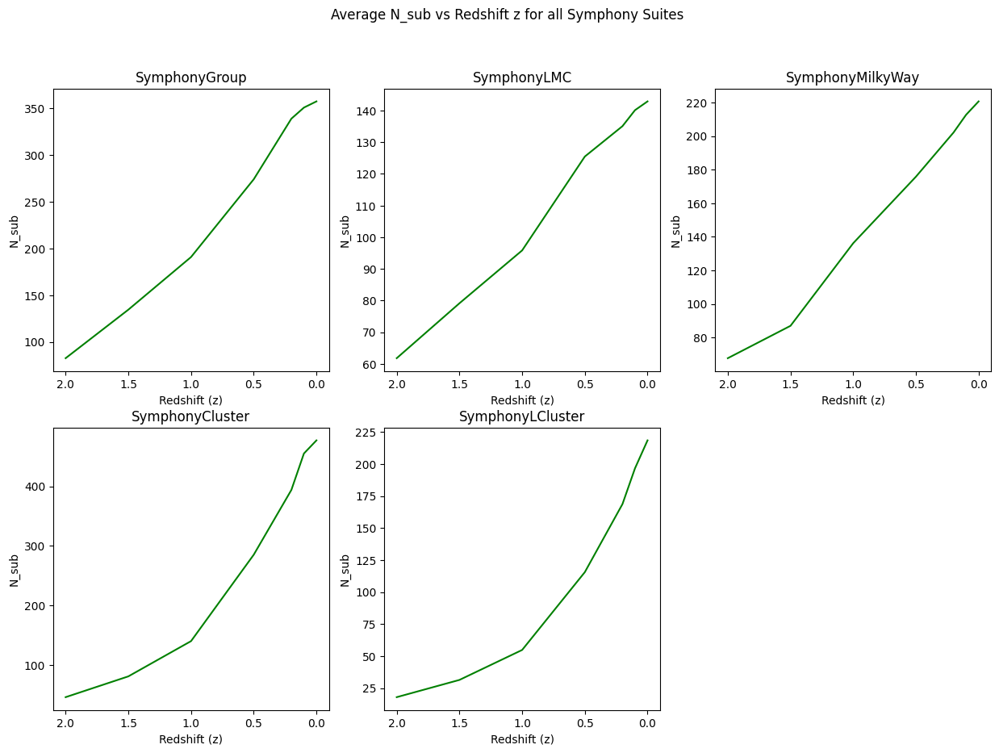

In [54]:

# Averaging each suite's N_Sub vs Redshift 

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    avg_num_halos = np.zeros(len(list_of_z))
    #total_halos = []
    
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
    
        for iz,target_z in enumerate(list_of_z):
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Distance from center
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            avg_num_halos[iz]+=np.sum(n_vir)
          
    avg_num_halos /= n_hosts
        
    ax[suite_index].plot(list_of_z,avg_num_halos,color = "green")
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub")
    ax[suite_index].set_title(suite_name)

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])
    
fig.suptitle("Average N_sub vs Redshift z for all Symphony Suites")
plt.show()

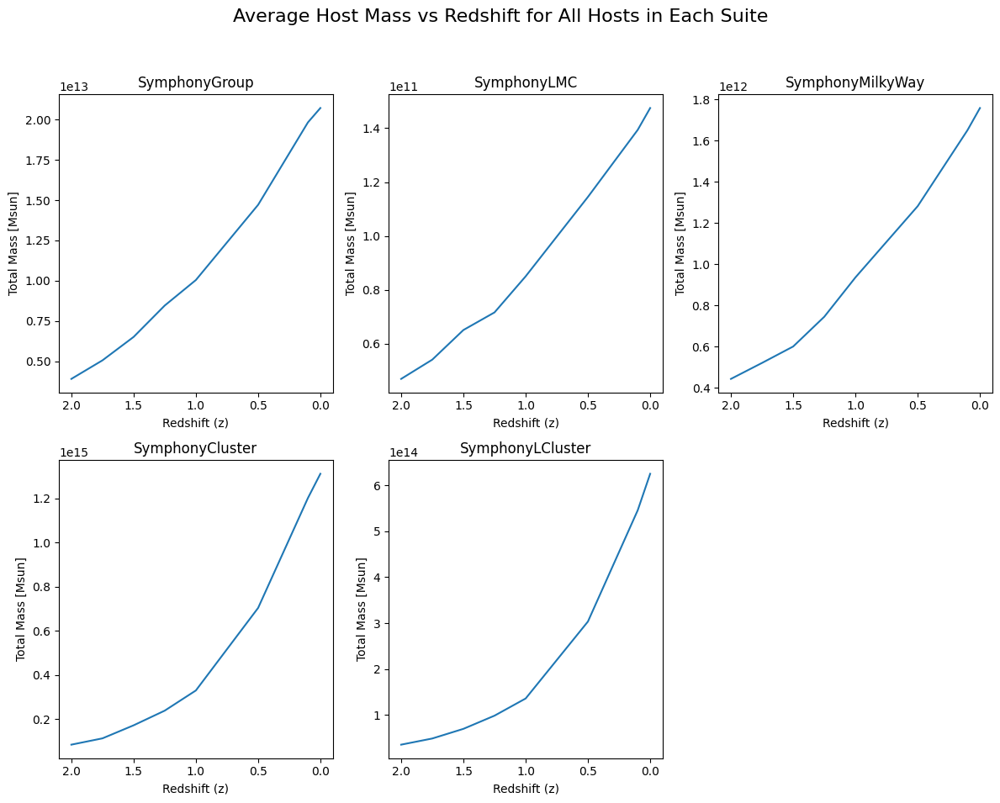

In [63]:
# averaging each suite's m_total vs Z 

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
list_of_z = [0, 0.1, 0.5, 1.0,1.25,1.5,1.75, 2.0]  # Whatever redshifts you want

fig, ax = plt.subplots(2,3, figsize = (12,10))
ax = ax.flatten()

for suite_index, suite_name in enumerate(suite_list):

    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]
    n_hosts = symlib.n_hosts(suite_name)
    avg_total_mass = np.zeros(len(list_of_z))

    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, _ = symlib.read_subhalos(sim_dir)

        for iz, target_z in enumerate(list_of_z):
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            #subhalo_mass = np.sum(h["mvir"][ok, snapshot_index])
            total_mass = host_mass / h100  # Convert to physical Msun
            # total_mass_all_z.append(total_mass)
            avg_total_mass[iz] += total_mass 

    avg_total_mass /= n_hosts

    ax[suite_index].plot(list_of_z, avg_total_mass, color='tab:blue')
    ax[suite_index].invert_xaxis()

    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("Total Mass [Msun]")
    # ax[suite_index].title(f"Host + Subhalo Mass for All Hosts in {suite_name}")
    ax[suite_index].set_title(suite_name)
    # plt.gca().invert_xaxis()

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])

fig.suptitle("Average Host Mass vs Redshift for All Hosts in Each Suite", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.gca().invert

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import symlib


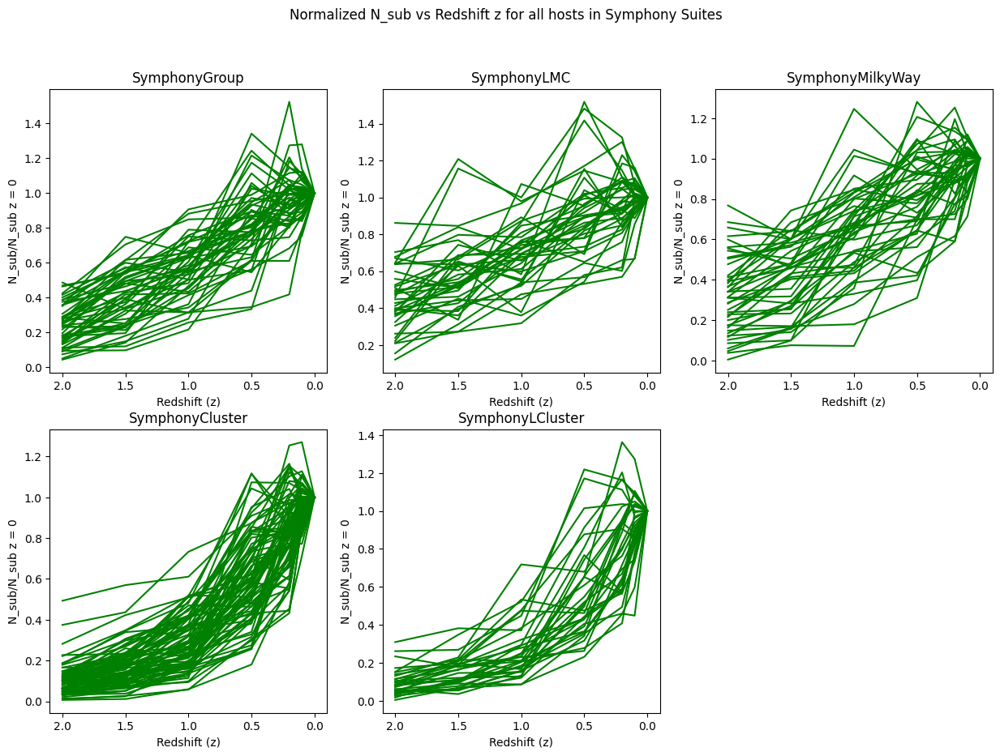

In [6]:

# Now try to normalize them to n_z=0 yipeeee

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        
        total_halos = []
        
        #z0_halos = his
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Distance from center
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts
            
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        
        ax[suite_index].plot(list_of_z,normalized_halos,color = "green")
        ax[suite_index].invert_xaxis()
        
    # Plotting
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub/N_sub z = 0")
    ax[suite_index].set_title(suite_name)
    # ax.grid(True)

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])
    
fig.suptitle("Normalized N_sub vs Redshift z for all hosts in Symphony Suites")
plt.show()

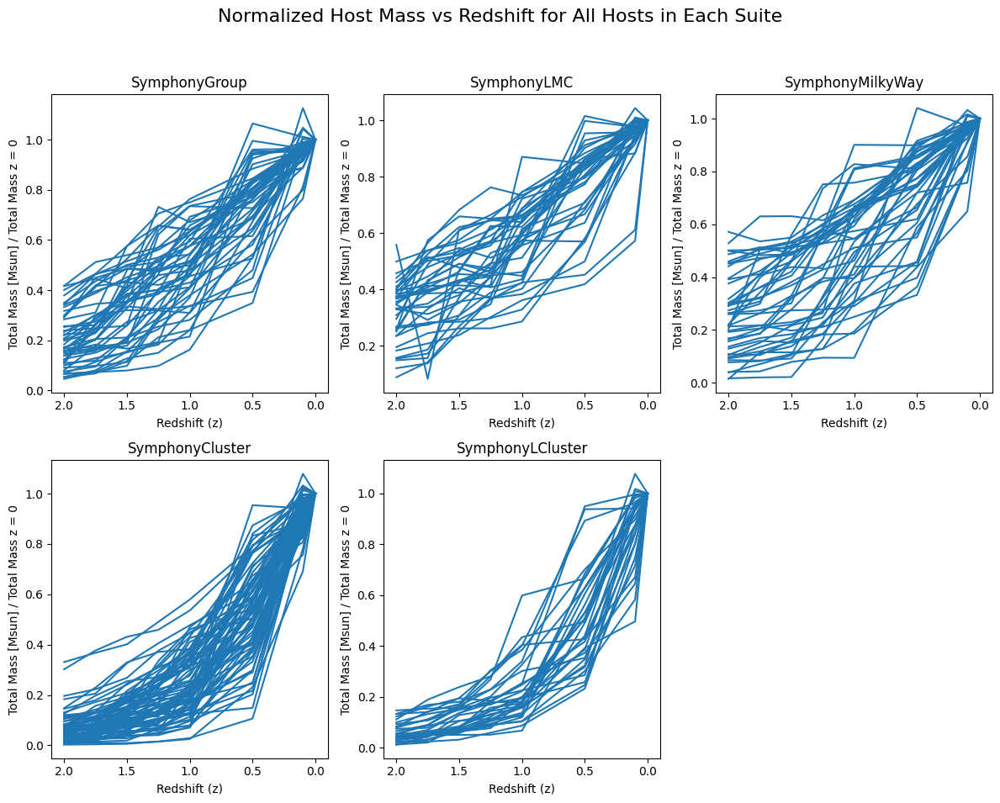

In [11]:

# now normalize the masses as mass / mass z=0

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
list_of_z = [0, 0.1, 0.5, 1.0,1.25,1.5,1.75, 2.0]  # Whatever redshifts you want

fig, ax = plt.subplots(2,3, figsize = (12,10))
ax = ax.flatten()

for suite_index, suite_name in enumerate(suite_list):

    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]

    n_hosts = symlib.n_hosts(suite_name)
    # plt.figure(figsize=(8, 6))

    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, _ = symlib.read_subhalos(sim_dir)

        total_mass_all_z = []

        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        ax[suite_index].plot(list_of_z, normalized_masses, color='tab:blue')
        ax[suite_index].invert_xaxis()

    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("Total Mass [Msun] / Total Mass z = 0")
    # ax[suite_index].title(f"Host + Subhalo Mass for All Hosts in {suite_name}")
    ax[suite_index].set_title(suite_name)
    # plt.gca().invert_xaxis()

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])

fig.suptitle("Normalized Host Mass vs Redshift for All Hosts in Each Suite", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.gca().invert_xaxis()
plt.show()

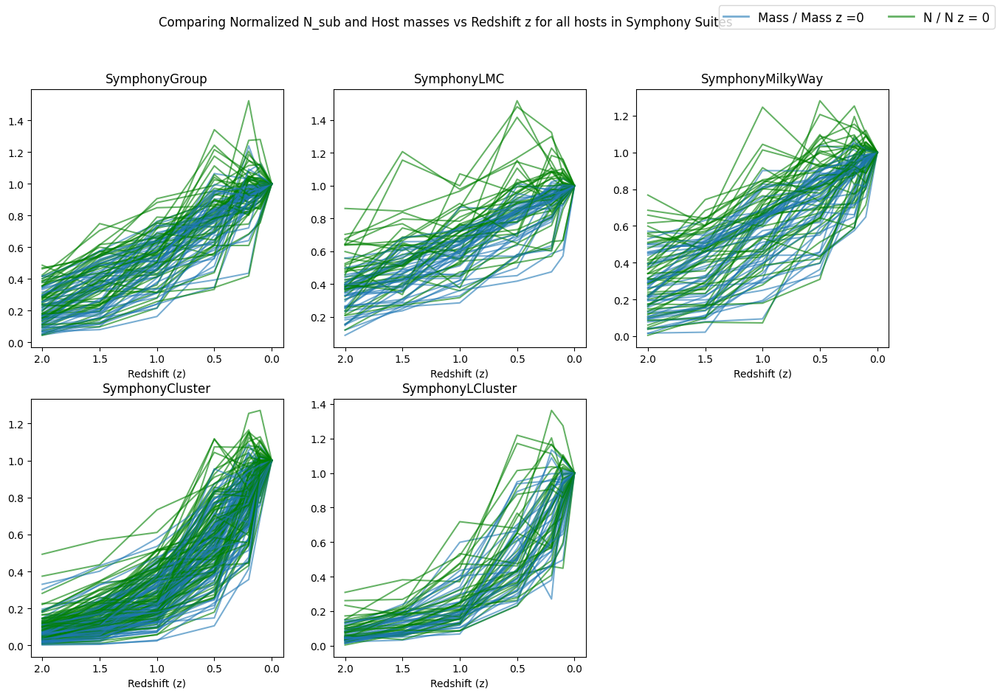

In [24]:
# Now i get to layer them yipeee
from matplotlib.lines import Line2D

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        total_mass_all_z = [] # for mass graphing
        total_halos = [] # for nsub graphing
      
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Distance from center
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir))
            
            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)
        
        # normalize halos
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos]   
        
        # normalize masses 
        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]

        # plot both data sets
        ax[suite_index].plot(list_of_z, normalized_masses, color='tab:blue', alpha = 0.6) #, label = "Total Mass [Msun] / Total Mass z = 0" ) 
        ax[suite_index].plot(list_of_z,normalized_halos,color = "green", alpha = 0.6) #,label = "N_sub/N_sub z = 0")
        #ax[suite_index].invert_xaxis()
        
    # Plotting
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_title(suite_name)
    # ax[suite_index].legend(loc="upper right", fontsize=9)

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])
    
fig.suptitle("Comparing Normalized N_sub and Host masses vs Redshift z for all hosts in Symphony Suites")
#handles, labels = ax[0].get_legend_handles_labels()[0],["Normalized massed", "Normalized N_halos"]
#fig.legend(handles, labels, loc='upper center', ncol=2, fontsize=12)

# Manually define legend entries
custom_lines = [
    Line2D([0], [0], color='tab:blue', lw=2, alpha=0.6, label='Normalized Mass'),
    Line2D([0], [0], color='green', lw=2, alpha=0.6, label='Normalized N_sub')
]

# Add the legend to the figure
fig.legend(custom_lines, ['Mass / Mass z =0', 'N / N z = 0'],
           loc='upper right', ncol=2, fontsize=12)

plt.show()


In [ ]:
# yipee now average themm 

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        
        total_halos = []
        halos_summed = 0
        
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Distance from center
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir))
            # creates a list of n_sub at different redshifts, for each host
            
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of normalized halos for one host over all redhsifts

        for iz in list_of_z
        
        
        ax[suite_index].plot(list_of_z,normalized_halos,color = "green")
        ax[suite_index].invert_xaxis()
        
    # Plotting
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub/N_sub z = 0")
    ax[suite_index].set_title(suite_name)
    # ax.grid(True)

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])
    
fig.suptitle("Normalized N_sub vs Redshift z for all hosts in Symphony Suites")
plt.show()




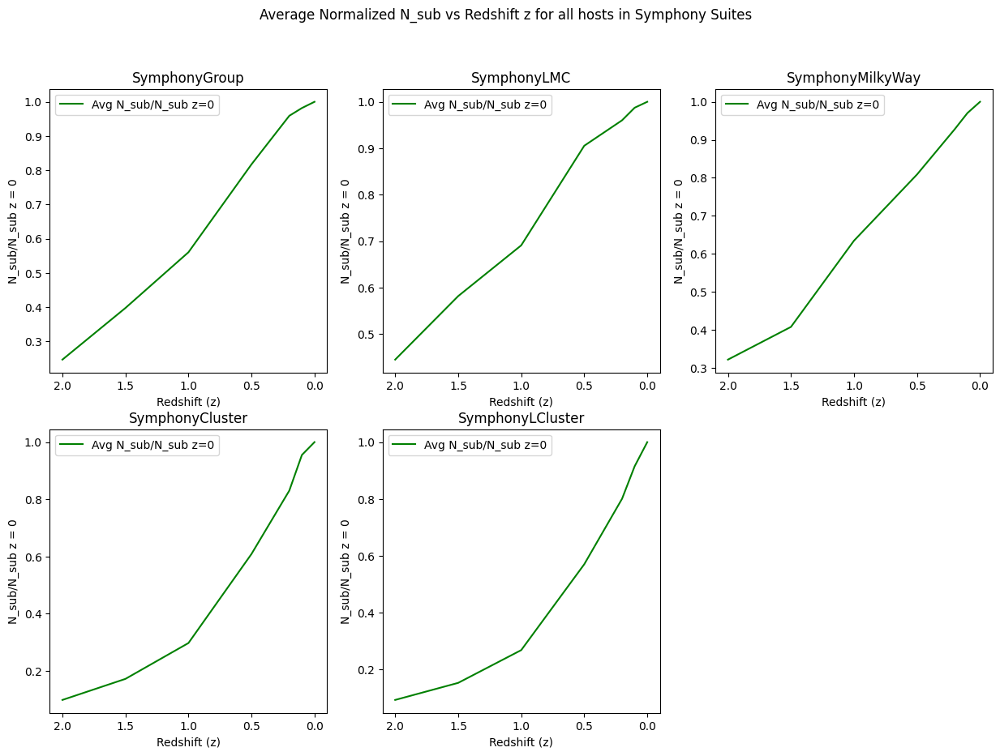

In [28]:

# yet again we attempt to average


base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    all_normalized_halos = []
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        
        total_halos = []
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Distance from center
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts
            
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        all_normalized_halos.append(normalized_halos) # add to the list of lists
        
        #ax[suite_index].plot(list_of_z,normalized_halos,color = "green")
        #ax[suite_index].invert_xaxis()
    
    # convert to numpy array so we can average over every host
    all_normalized_halos = np.array(all_normalized_halos)
    average_normalized_halos = np.mean(all_normalized_halos, axis=0)

    # plotting
    ax[suite_index].plot(list_of_z, average_normalized_halos, color="green", label="Avg N_sub/N_sub z=0")
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub/N_sub z = 0")
    ax[suite_index].set_title(suite_name)
    ax[suite_index].legend()
        
for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])
    
fig.suptitle("Average Normalized N_sub vs Redshift z for all hosts in Symphony Suites")
plt.show()

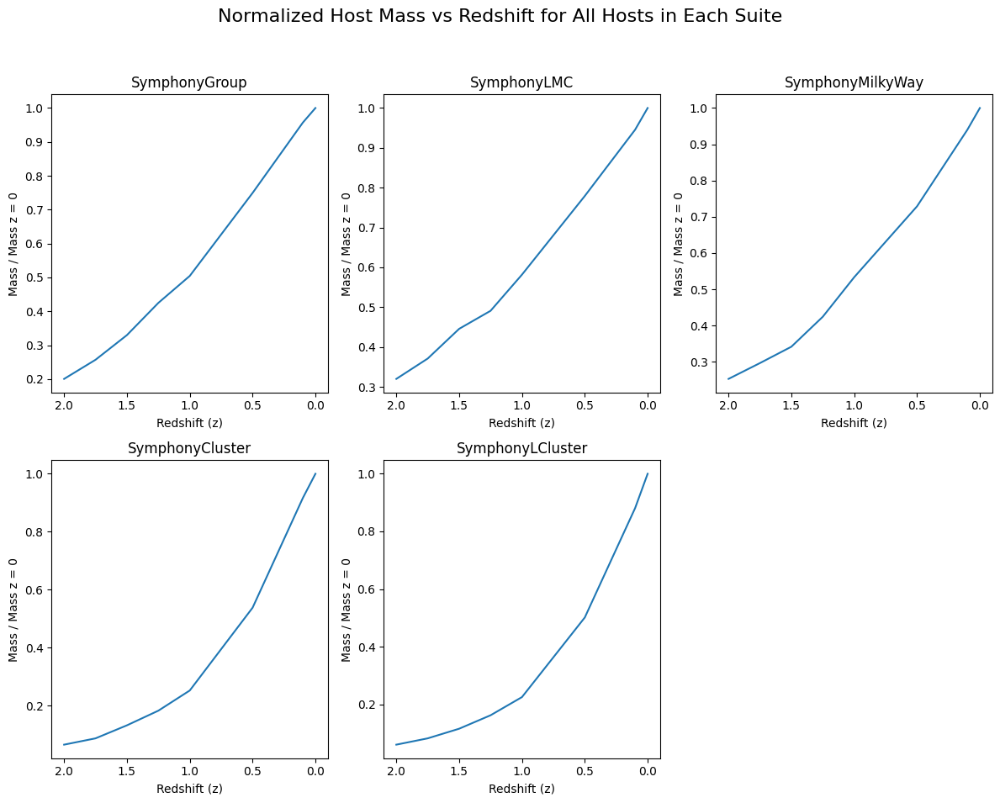

In [32]:

# fabulous now average the normalized masses

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
list_of_z = [0, 0.1, 0.5, 1.0,1.25,1.5,1.75, 2.0]  # Whatever redshifts you want

fig, ax = plt.subplots(2,3, figsize = (12,10))
ax = ax.flatten()

for suite_index, suite_name in enumerate(suite_list):

    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]

    n_hosts = symlib.n_hosts(suite_name)
    # plt.figure(figsize=(8, 6))

    all_normalized_masses = []
    
    for i_host in range(n_hosts):
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, _ = symlib.read_subhalos(sim_dir)

        total_mass_all_z = []

        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        all_normalized_masses.append(normalized_masses)

    all_normalized_masses = np.array(all_normalized_masses)
    avg_normalized_masses = np.mean(all_normalized_masses, axis = 0)
        
        #ax[suite_index].plot(list_of_z, normalized_masses, color='tab:blue')
        #ax[suite_index].invert_xaxis()
    ax[suite_index].plot(list_of_z,avg_normalized_masses, color = 'tab:blue')
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("Mass / Mass z = 0")
    ax[suite_index].set_title(suite_name)

for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])

fig.suptitle("Normalized Host Mass vs Redshift for All Hosts in Each Suite", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.gca().invert_xaxis()
plt.show()

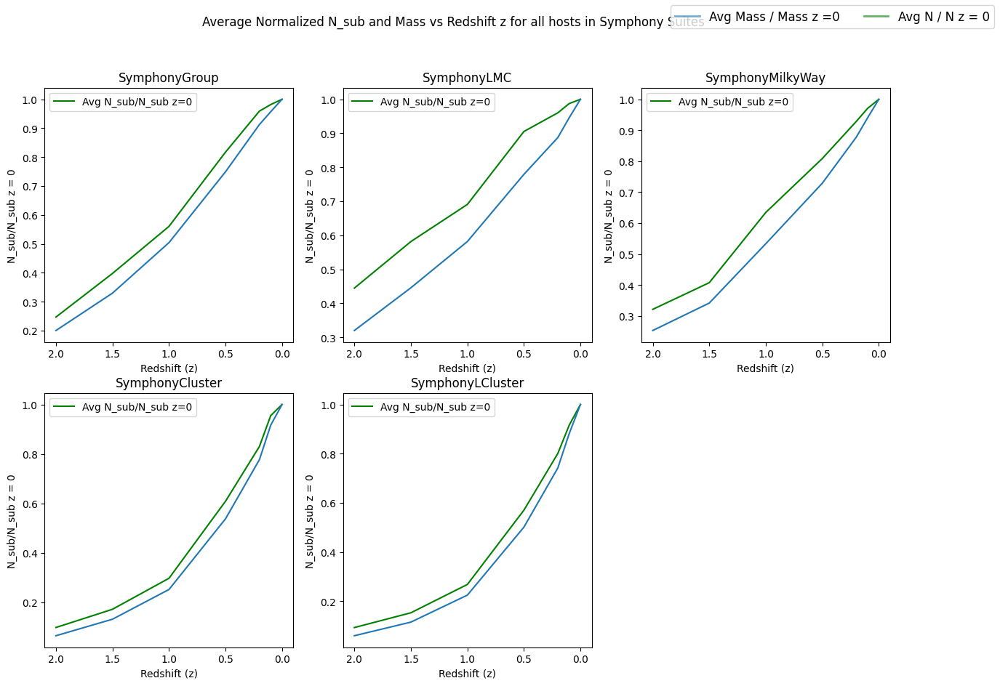

In [35]:
# excellent now overplot them 

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# suite_name = "SymphonyGroup"
list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    all_normalized_halos = []
    all_normalized_masses = []
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        
        total_halos = []
        total_mass_all_z = []
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

            # N_sub
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts
            
        # Normalize all values and append them to respective lists
        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        all_normalized_masses.append(normalized_masses) 
        
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        all_normalized_halos.append(normalized_halos) # add to the list of lists
        
        #ax[suite_index].plot(list_of_z,normalized_halos,color = "green")
        #ax[suite_index].invert_xaxis()
    
    # convert to numpy arrays and average
    all_normalized_halos = np.array(all_normalized_halos)
    average_normalized_halos = np.mean(all_normalized_halos, axis=0)

    all_normalized_masses = np.array(all_normalized_masses)
    avg_normalized_masses = np.mean(all_normalized_masses, axis = 0)

    # plotting
    ax[suite_index].plot(list_of_z, average_normalized_halos, color="green", label="Avg N_sub/N_sub z=0")
    ax[suite_index].plot(list_of_z,avg_normalized_masses, color = 'tab:blue')
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub/N_sub z = 0")
    ax[suite_index].set_title(suite_name)
    ax[suite_index].legend()
        
for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])

# Manually define legend entries
custom_lines = [
    Line2D([0], [0], color='tab:blue', lw=2, alpha=0.6, label='Average Normalized Masses'),
    Line2D([0], [0], color='green', lw=2, alpha=0.6, label='Average Normalized N_sub')
]

# Add the legend to the figure
fig.legend(custom_lines, ['Avg Mass / Mass z =0', 'Avg N / N z = 0'],
           loc='upper right', ncol=2, fontsize=12)

fig.suptitle("Average Normalized N_sub and Mass vs Redshift z for all hosts in Symphony Suites")
plt.show()


In [44]:
 # list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

# try to make a list of z using np.linspace instead of having to manually input it

list_of_z = np.linspace(0,2,20) # start, stop, # entries
print(list_of_z)

[0.         0.10526316 0.21052632 0.31578947 0.42105263 0.52631579
 0.63157895 0.73684211 0.84210526 0.94736842 1.05263158 1.15789474
 1.26315789 1.36842105 1.47368421 1.57894737 1.68421053 1.78947368
 1.89473684 2.        ]


In [45]:
print(len(list_of_z))

20


In [63]:
min_z = 0
max_z = 2
step_z = 0.125

list_of_z2 = np.arange(min_z, max_z, step_z) # start, stop, step
print(list_of_z2)

list_of_z3 = np.arange(min_z, max_z+step_z, step_z) # max number is not included in the array. to ensure max z is included, add step_z to max_z 
print(list_of_z3)

[0.    0.125 0.25  0.375 0.5   0.625 0.75  0.875 1.    1.125 1.25  1.375
 1.5   1.625 1.75  1.875]
[0.    0.125 0.25  0.375 0.5   0.625 0.75  0.875 1.    1.125 1.25  1.375
 1.5   1.625 1.75  1.875 2.   ]


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import symlib

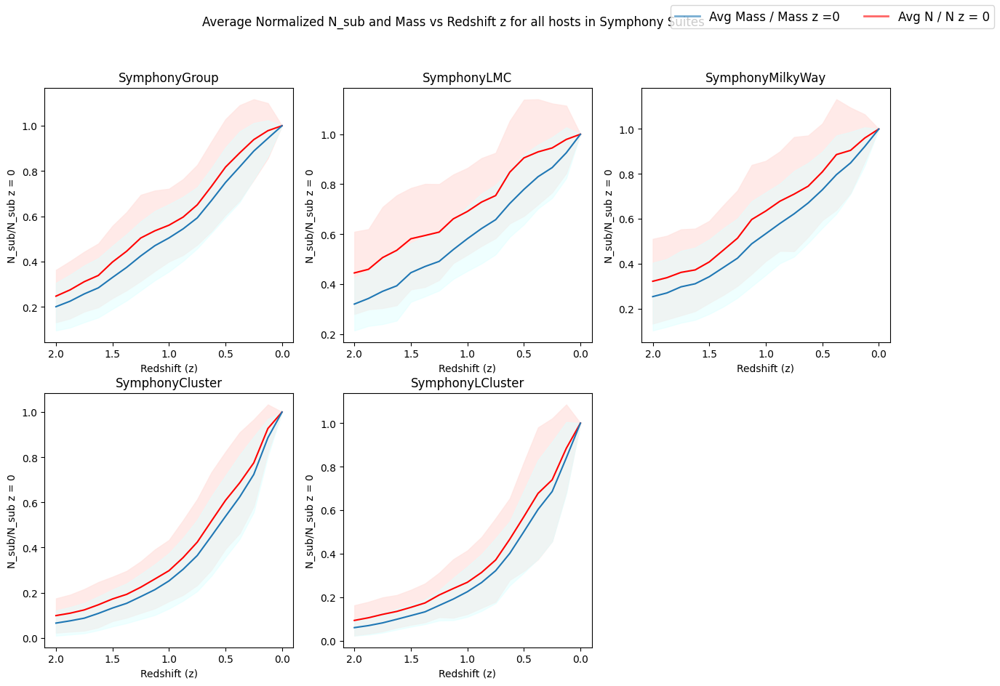

In [4]:
min_z, max_z, step_z = 0,2,0.125
 
# max number is not included in the arange array. to ensure max z is included, add step_z to max_z 
list_of_z = np.arange(min_z, max_z+step_z, step_z)
# print(list_of_z)

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
        
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    all_normalized_halos = []
    all_normalized_masses = []
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        total_halos = []
        total_mass_all_z = []
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

            # N_sub
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts
            
        # Normalize all values and append them to respective lists
        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        all_normalized_masses.append(normalized_masses) 
        
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        all_normalized_halos.append(normalized_halos) # add to the list of lists
        
    # convert to numpy arrays and average and find standard deviations
    all_normalized_halos = np.array(all_normalized_halos)
    avg_normalized_halos = np.mean(all_normalized_halos, axis=0)
    std_normalized_halos = np.std(all_normalized_halos, axis = 0)

    all_normalized_masses = np.array(all_normalized_masses)
    avg_normalized_masses = np.mean(all_normalized_masses, axis = 0)
    std_normalized_masses = np.std(all_normalized_masses, axis = 0)
    

    # plotting
    ax[suite_index].plot(list_of_z, avg_normalized_halos, color="red")
    ax[suite_index].fill_between(list_of_z,avg_normalized_halos + std_normalized_halos, avg_normalized_halos - std_normalized_halos,
                                 color = "mistyrose", alpha = 0.75)
    ax[suite_index].plot(list_of_z,avg_normalized_masses, color = 'tab:blue')
    ax[suite_index].fill_between(list_of_z, avg_normalized_masses + std_normalized_masses, avg_normalized_masses - std_normalized_masses,
                                 color = "lightcyan", alpha = 0.5)
    # ax[suite_index].error
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub/N_sub z = 0")
    ax[suite_index].set_title(suite_name)
        
for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])

# Manually define legend entries
custom_lines = [
    Line2D([0], [0], color='tab:blue', lw=2, alpha=0.6, label='Average Normalized Masses'),
    Line2D([0], [0], color='red', lw=2, alpha=0.6, label='Average Normalized N_sub')
]

# Add the legend to the figure
fig.legend(custom_lines, ['Avg Mass / Mass z =0', 'Avg N / N z = 0'],
           loc='upper right', ncol=2, fontsize=12)

fig.suptitle("Average Normalized N_sub and Mass vs Redshift z for all hosts in Symphony Suites")
plt.show()



In [1]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import symlib

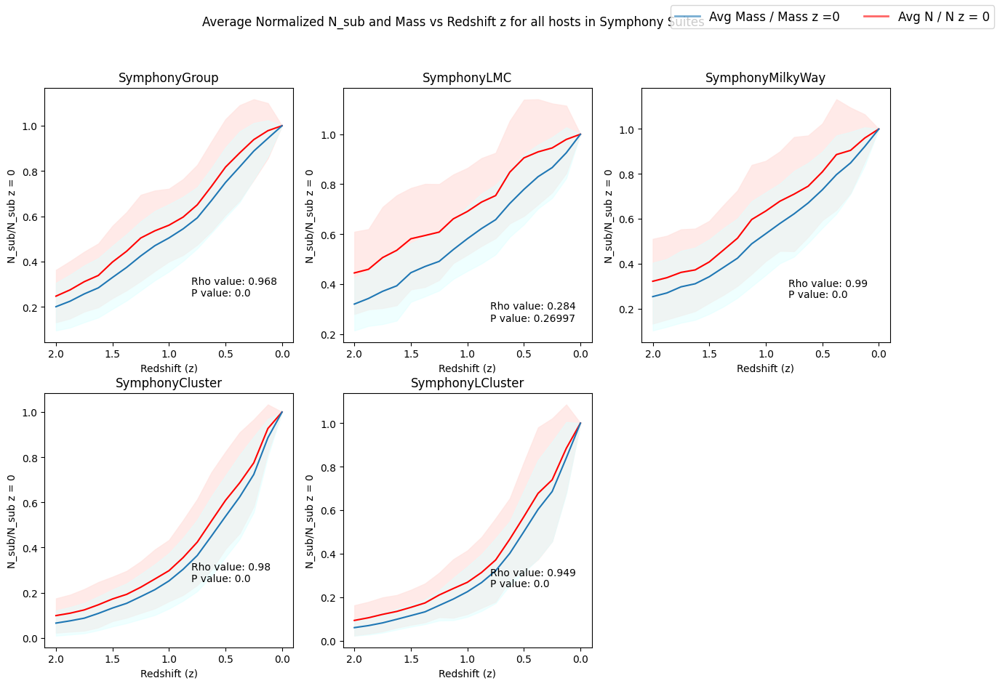

In [2]:
# yay now do the rho and p spearman test stuff

min_z, max_z, step_z = 0,2,0.125
 
# max number is not included in the arange array. to ensure max z is included, add step_z to max_z 
list_of_z = np.arange(min_z, max_z+step_z, step_z)
# print(list_of_z)

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
        
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    all_normalized_halos = []
    all_normalized_masses = []
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        total_halos = []
        total_mass_all_z = []

        rho_list = []
        p_list = []
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

            # N_sub
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts    
            
        # Normalize all values and append them to respective lists
        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        all_normalized_masses.append(normalized_masses) 
        
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        all_normalized_halos.append(normalized_halos) # add to the list of lists

        # find the stats stuff
        # rho, p = scipy.stats.spearmanr(nsub/np.max(nsub),Mhost/np.max(Mhost))
        rho, p = scipy.stats.spearmanr(normalized_halos,normalized_masses)
        rho_list.append(rho)
        p_list.append(p)
        
        
    # convert to numpy arrays and average and find standard deviations
    all_normalized_halos = np.array(all_normalized_halos)
    avg_normalized_halos = np.mean(all_normalized_halos, axis=0)
    std_normalized_halos = np.std(all_normalized_halos, axis = 0)

    all_normalized_masses = np.array(all_normalized_masses)
    avg_normalized_masses = np.mean(all_normalized_masses, axis = 0)
    std_normalized_masses = np.std(all_normalized_masses, axis = 0)

    rho_list = np.array(rho_list)
    avg_rho = np.round(np.mean(rho_list), decimals = 3)
    p_list = np.array(p_list)
    avg_p = np.round(np.mean(p_list), decimals = 6)

    # plotting
    ax[suite_index].plot(list_of_z, avg_normalized_halos, color="red")
    ax[suite_index].fill_between(list_of_z,avg_normalized_halos + std_normalized_halos, avg_normalized_halos - std_normalized_halos,
                                 color = "mistyrose", alpha = 0.75)
    ax[suite_index].plot(list_of_z,avg_normalized_masses, color = 'tab:blue')
    ax[suite_index].fill_between(list_of_z, avg_normalized_masses + std_normalized_masses, avg_normalized_masses - std_normalized_masses,
                                 color = "lightcyan", alpha = 0.5)
    ax[suite_index].text(0.8,0.3, "Rho value: " + str(avg_rho))
    ax[suite_index].text(0.8,0.25, "P value: " + str(avg_p))
    
    # ax[suite_index].error
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub/N_sub z = 0")
    ax[suite_index].set_title(suite_name)
        
for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])

# Manually define legend entries
custom_lines = [
    Line2D([0], [0], color='tab:blue', lw=2, alpha=0.6, label='Average Normalized Masses'),
    Line2D([0], [0], color='red', lw=2, alpha=0.6, label='Average Normalized N_sub')
]

# Add the legend to the figure
fig.legend(custom_lines, ['Avg Mass / Mass z =0', 'Avg N / N z = 0'],
           loc='upper right', ncol=2, fontsize=12)

fig.suptitle("Average Normalized N_sub and Mass vs Redshift z for all hosts in Symphony Suites")
plt.show()



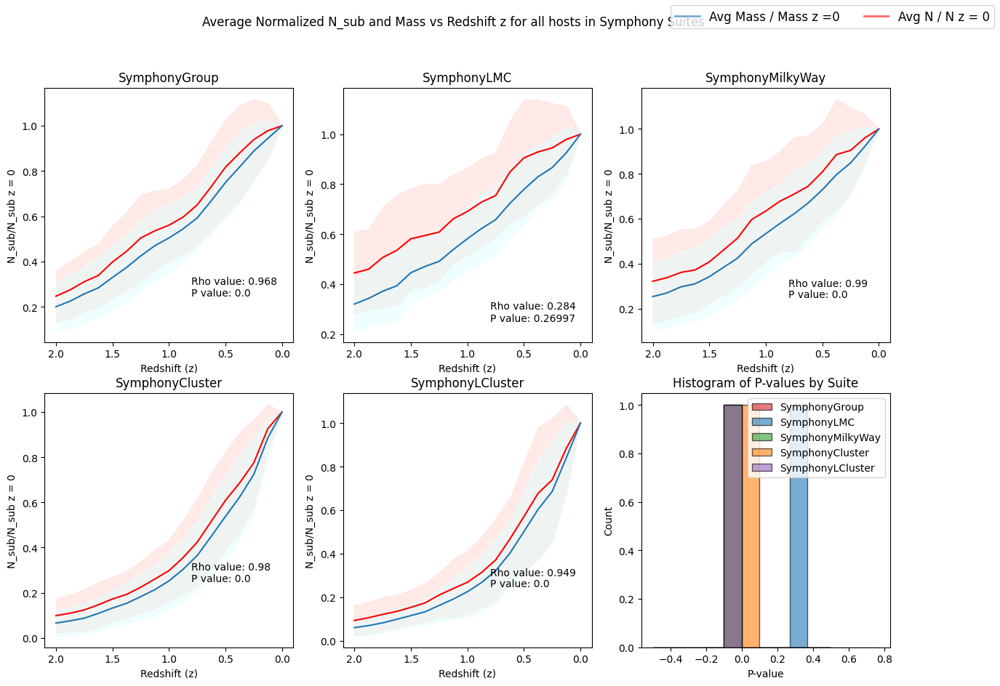

In [14]:
# great now make a histogram

min_z, max_z, step_z = 0,2,0.125
 
# max number is not included in the arange array. to ensure max z is included, add step_z to max_z 
list_of_z = np.arange(min_z, max_z+step_z, step_z)
# print(list_of_z)

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

#all_rhos = []
#all_ps = []

all_rhos_by_suite = []
all_ps_by_suite = []

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
        
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    all_normalized_halos = []
    all_normalized_masses = []
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        total_halos = []
        total_mass_all_z = []

        rho_list = []
        p_list = []

        #all_rhos_by_suite.append(rho_list)
        #all_ps_by_suite.append(p_list)
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

            # N_sub
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts    
            
        # Normalize all values and append them to respective lists
        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        all_normalized_masses.append(normalized_masses) 
        
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        all_normalized_halos.append(normalized_halos) # add to the list of lists

        # find the stats stuff
        # rho, p = scipy.stats.spearmanr(nsub/np.max(nsub),Mhost/np.max(Mhost))
        rho, p = scipy.stats.spearmanr(normalized_halos,normalized_masses)
        rho_list.append(rho)
        p_list.append(p)
        #all_rhos.append(rho)
        #all_ps.append(p)
        
        
    # convert to numpy arrays and average and find standard deviations
    all_normalized_halos = np.array(all_normalized_halos)
    avg_normalized_halos = np.mean(all_normalized_halos, axis=0)
    std_normalized_halos = np.std(all_normalized_halos, axis = 0)

    all_normalized_masses = np.array(all_normalized_masses)
    avg_normalized_masses = np.mean(all_normalized_masses, axis = 0)
    std_normalized_masses = np.std(all_normalized_masses, axis = 0)

    rho_list = np.array(rho_list)
    avg_rho = np.round(np.mean(rho_list), decimals = 3)
    p_list = np.array(p_list)
    avg_p = np.round(np.mean(p_list), decimals = 6)

    all_rhos_by_suite.append(rho_list)
    all_ps_by_suite.append(p_list)
    
    # plotting
    ax[suite_index].plot(list_of_z, avg_normalized_halos, color="red")
    ax[suite_index].fill_between(list_of_z,avg_normalized_halos + std_normalized_halos, avg_normalized_halos - std_normalized_halos,
                                 color = "mistyrose", alpha = 0.75)
    ax[suite_index].plot(list_of_z,avg_normalized_masses, color = 'tab:blue')
    ax[suite_index].fill_between(list_of_z, avg_normalized_masses + std_normalized_masses, avg_normalized_masses - std_normalized_masses,
                                 color = "lightcyan", alpha = 0.5)
    ax[suite_index].text(0.8,0.3, "Rho value: " + str(avg_rho))
    ax[suite_index].text(0.8,0.25, "P value: " + str(avg_p))
    
    # ax[suite_index].error
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub/N_sub z = 0")
    ax[suite_index].set_title(suite_name)


#colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:orange', 'tab:purple']
#for suite_index, suite_name in enumerate(suite_list):
   # ax[len(suite_list)].hist(rho_list,9, color=colors[suite_index])

for suite_index, suite_p_values in enumerate(all_ps_by_suite):
    ax[len(suite_list)].hist(suite_p_values, bins=10, alpha=0.6,
                             color=colors[suite_index],
                             label=suite_list[suite_index],
                             edgecolor="black")

ax[len(suite_list)].set_title("Histogram of P-values by Suite")
ax[len(suite_list)].set_xlabel("P-value")
ax[len(suite_list)].set_ylabel("Count")
ax[len(suite_list)].legend(fontsize=10)




    

#for i in all_ps_by_suite:
 #   ax[len(suite_list)].hist(np.array(all_ps_by_suite[i]),9) # bins

#for i in range(len(suite_list), len(ax)):
   # fig.delaxes(ax[i])

# Manually define legend entries
custom_lines = [
    Line2D([0], [0], color='tab:blue', lw=2, alpha=0.6, label='Average Normalized Masses'),
    Line2D([0], [0], color='red', lw=2, alpha=0.6, label='Average Normalized N_sub')
]

#print(rho_list)
#print(p_list)
# make a histogram of P values
# ax[len(suite_list)].hist(p_list,9, label = "histogram of p values") # bins
#ax[len(suite_list)].hist(rho_list,9, label = "histogram of rho values") # bins



# Add the legend to the figure
fig.legend(custom_lines, ['Avg Mass / Mass z =0', 'Avg N / N z = 0'],
           loc='upper right', ncol=2, fontsize=12)

fig.suptitle("Average Normalized N_sub and Mass vs Redshift z for all hosts in Symphony Suites")
plt.show()


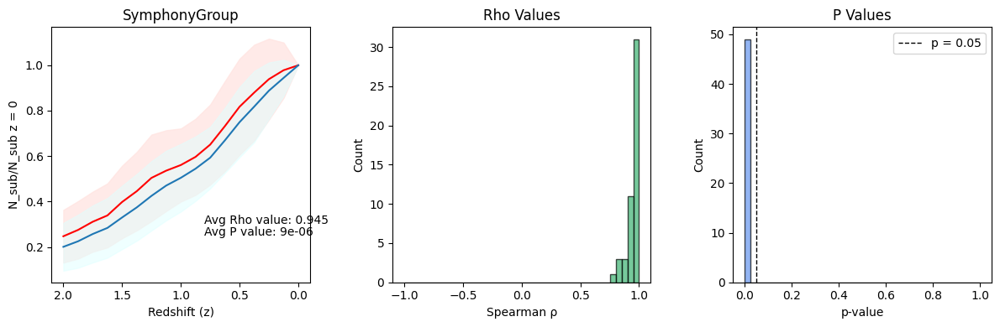

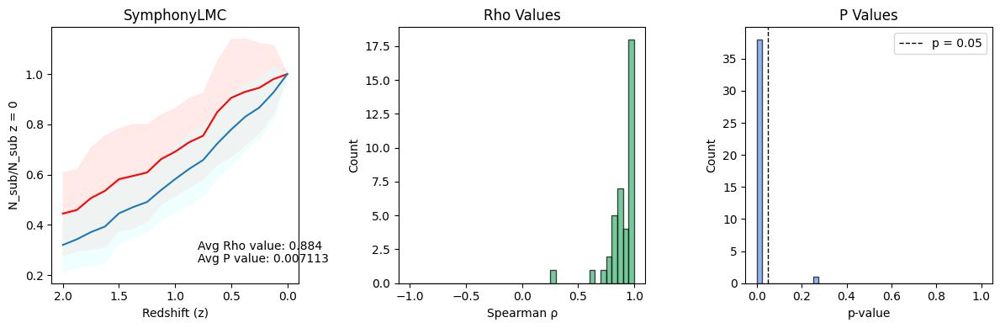

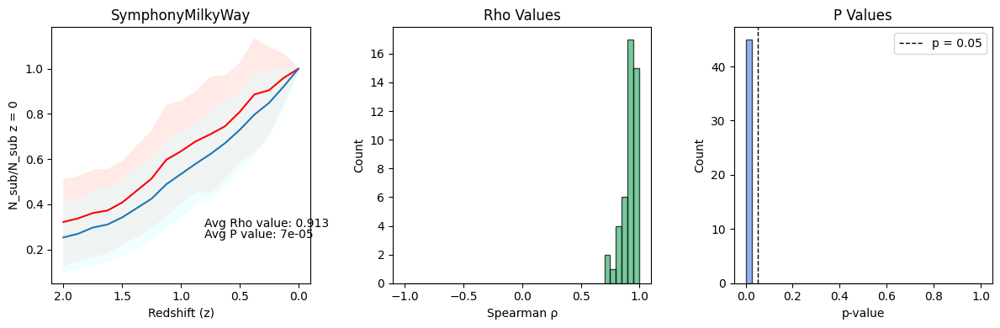

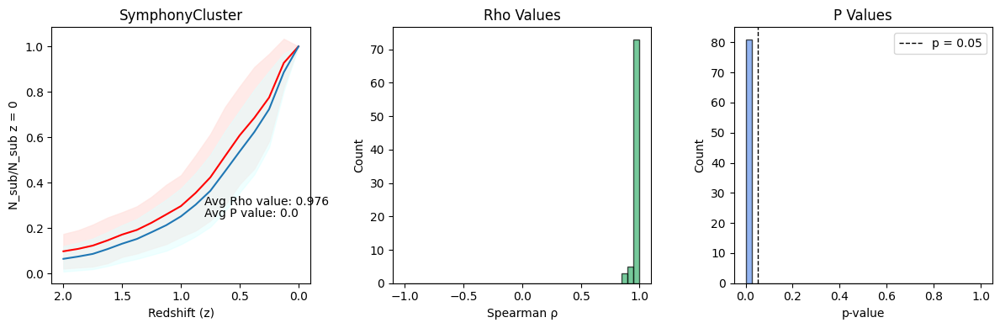

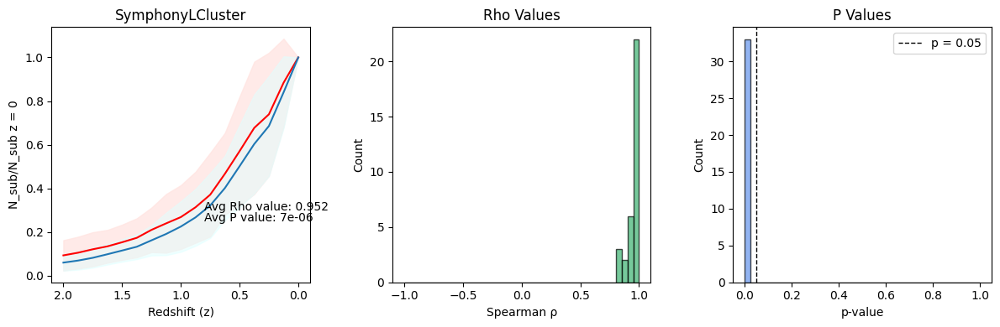

In [21]:


# create a figure for each suite showing graph and both histograms 
# graph histograms for each host

min_z, max_z, step_z = 0,2,0.125
 
# max number is not included in the arange array. to ensure max z is included, add step_z to max_z 
list_of_z = np.arange(min_z, max_z+step_z, step_z)
# print(list_of_z)

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

# fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
# ax = ax.flatten()

#all_rhos = []
#all_ps = []

#all_rhos_by_suite = []
#all_ps_by_suite = []

for suite_index,suite_name in enumerate(suite_list):
    fig, ax = plt.subplots(1,3,figsize=(12, 4))
    
    n_hosts = symlib.n_hosts(suite_name)
        
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    all_normalized_halos = []
    all_normalized_masses = []
    rho_list = []
    p_list = []

   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        total_halos = []
        total_mass_all_z = []

        #all_rhos_by_suite.append(rho_list)
        #all_ps_by_suite.append(p_list)
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

            # N_sub
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts    
            
        # Normalize all values and append them to respective lists
        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        all_normalized_masses.append(normalized_masses) 
        
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        all_normalized_halos.append(normalized_halos) # add to the list of lists

        # find the stats stuff
        # rho, p = scipy.stats.spearmanr(nsub/np.max(nsub),Mhost/np.max(Mhost))
        rho, p = scipy.stats.spearmanr(normalized_halos,normalized_masses)
        rho_list.append(rho)
        p_list.append(p)
        #all_rhos.append(rho)
        #all_ps.append(p)
       
        
    # convert to numpy arrays and average and find standard deviations
    all_normalized_halos = np.array(all_normalized_halos)
    avg_normalized_halos = np.mean(all_normalized_halos, axis=0)
    std_normalized_halos = np.std(all_normalized_halos, axis = 0)

    all_normalized_masses = np.array(all_normalized_masses)
    avg_normalized_masses = np.mean(all_normalized_masses, axis = 0)
    std_normalized_masses = np.std(all_normalized_masses, axis = 0)

    rho_list = np.array(rho_list)
    avg_rho = np.round(np.mean(rho_list), decimals = 3)
    p_list = np.array(p_list)
    avg_p = np.round(np.mean(p_list), decimals = 6)

    all_rhos_by_suite.append(rho_list)
    all_ps_by_suite.append(p_list)
    
    # plotting redshift functions
    ax[0].plot(list_of_z, avg_normalized_halos, color="red")
    ax[0].fill_between(list_of_z,avg_normalized_halos + std_normalized_halos, avg_normalized_halos - std_normalized_halos,
                                 color = "mistyrose", alpha = 0.75)
    ax[0].plot(list_of_z,avg_normalized_masses, color = 'tab:blue')
    ax[0].fill_between(list_of_z, avg_normalized_masses + std_normalized_masses, avg_normalized_masses - std_normalized_masses,
                                 color = "lightcyan", alpha = 0.5)
    ax[0].text(0.8,0.3, "Avg Rho value: " + str(avg_rho))
    ax[0].text(0.8,0.25, "Avg P value: " + str(avg_p))
    ax[0].invert_xaxis()
    ax[0].set_xlabel("Redshift (z)")
    ax[0].set_ylabel("N_sub/N_sub z = 0")
    ax[0].set_title(suite_name)

    rho_bins = np.linspace(-1, 1, 41)
    p_bins = np.linspace(0, 1, 41)

    # plot the rho distribution 
    ax[1].hist(rho_list, bins=rho_bins, color="mediumseagreen", edgecolor="black", alpha=0.7)
    ax[1].set_title("Rho Values")
    ax[1].set_xlabel("Spearman ρ")
    ax[1].set_ylabel("Count")
    
    # plot the p value distribution
    ax[2].hist(p_list, bins=p_bins, color="cornflowerblue", edgecolor="black", alpha=0.7)
    ax[2].axvline(0.05, color="black", linestyle="--", linewidth=1, label="p = 0.05")
    ax[2].legend()
    ax[2].set_title("P Values")
    ax[2].set_xlabel("p-value")
    ax[2].set_ylabel("Count")

    fig.tight_layout()



    '''
    # plotting histogram of rho values
    rho_bins = np.linspace(-1, 1, 41)
    p_bins = np.linspace(0, 1, 41)
    ax[1].hist(rho_list, bins = rho_bins)
    ax[1].set_title("Rho Values")
    ax[2].hist(p_list, bins = p_bins)
    ax[2].set_title("P Values")


#colors = ['tab:red', 'tab:blue', 'tab:green', 'tab:orange', 'tab:purple']
#for suite_index, suite_name in enumerate(suite_list):
   # ax[len(suite_list)].hist(rho_list,9, color=colors[suite_index])

#for suite_index, suite_p_values in enumerate(all_ps_by_suite):
  #  ax[len(suite_list)].hist(suite_p_values, bins=10, alpha=0.6,
   #                          color=colors[suite_index],
   #                          label=suite_list[suite_index],
                             edgecolor="black")

ax[len(suite_list)].set_title("Histogram of P-values by Suite")
ax[len(suite_list)].set_xlabel("P-value")
ax[len(suite_list)].set_ylabel("Count")
ax[len(suite_list)].legend(fontsize=10)
'''







In [24]:
import numpy as np
import scipy
from scipy import optimize
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import symlib

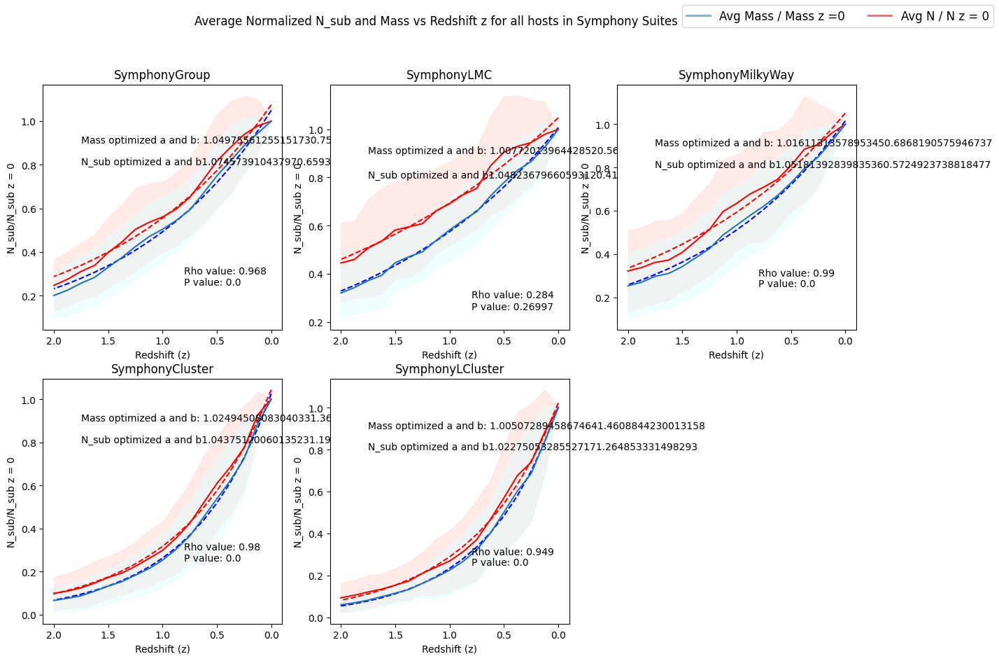

In [32]:
# now try best fit line stuff

def exponential_func(x, a, b):
        return a * np.exp(-b * x)

min_z, max_z, step_z = 0,2,0.125
 
# max number is not included in the arange array. to ensure max z is included, add step_z to max_z 
list_of_z = np.arange(min_z, max_z+step_z, step_z)
# print(list_of_z)

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

fig, ax = plt.subplots(2,3,figsize=(15, 10))
#ax.set_title("N_Sub vs Z for first halo in all Suites")
ax = ax.flatten()

for suite_index,suite_name in enumerate(suite_list):
    n_hosts = symlib.n_hosts(suite_name)
        
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    all_normalized_halos = []
    all_normalized_masses = []
   
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        total_halos = []
        total_mass_all_z = []

        rho_list = []
        p_list = []
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

            # N_sub
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts    
            
        # Normalize all values and append them to respective lists
        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        all_normalized_masses.append(normalized_masses) 
        
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        all_normalized_halos.append(normalized_halos) # add to the list of lists

        # find the stats stuff
        # rho, p = scipy.stats.spearmanr(nsub/np.max(nsub),Mhost/np.max(Mhost))
        rho, p = scipy.stats.spearmanr(normalized_halos,normalized_masses)
        rho_list.append(rho)
        p_list.append(p)
        
     
    # convert to numpy arrays and average and find standard deviations
    all_normalized_halos = np.array(all_normalized_halos)
    avg_normalized_halos = np.mean(all_normalized_halos, axis=0)
    std_normalized_halos = np.std(all_normalized_halos, axis = 0)

    all_normalized_masses = np.array(all_normalized_masses)
    avg_normalized_masses = np.mean(all_normalized_masses, axis = 0)
    std_normalized_masses = np.std(all_normalized_masses, axis = 0)

    rho_list = np.array(rho_list)
    avg_rho = np.round(np.mean(rho_list), decimals = 3)
    p_list = np.array(p_list)
    avg_p = np.round(np.mean(p_list), decimals = 6)

    #nsub_params, nsub_covariance = scipy.optimize.curve_fit(exponential_func, list_of_z, all_normalized_halos)
    #nsub_aopt, nsub_bopt = params
    #plt.plot(list_of_z, exponential_func(list_of_z,nsub_aopt,nsub_bopt),label = "nsub fitted curve", color = "red",ls='--')

    # find best fit lines
    nsub_params, nsub_covariance = scipy.optimize.curve_fit(exponential_func, list_of_z, avg_normalized_halos)
    nsub_aopt, nsub_bopt = nsub_params
    ax[suite_index].plot(
        list_of_z,
        exponential_func(list_of_z, nsub_aopt, nsub_bopt),
        label="N_sub Fitted Curve",
        color="red",
        linestyle="--"
        )

    m_params, m_covariance = scipy.optimize.curve_fit(exponential_func, list_of_z, avg_normalized_masses)
    m_aopt, m_bopt = m_params
    ax[suite_index].plot(
        list_of_z,
        exponential_func(list_of_z, m_aopt, m_bopt),
        label="Mass Fitted Curve",
        color="blue",
        linestyle="--"
        )

    # plotting
    ax[suite_index].plot(list_of_z, avg_normalized_halos, color="red")
    ax[suite_index].fill_between(list_of_z,avg_normalized_halos + std_normalized_halos, avg_normalized_halos - std_normalized_halos,
                                 color = "mistyrose", alpha = 0.75)
    ax[suite_index].plot(list_of_z,avg_normalized_masses, color = 'tab:blue')
    ax[suite_index].fill_between(list_of_z, avg_normalized_masses + std_normalized_masses, avg_normalized_masses - std_normalized_masses,
                                 color = "lightcyan", alpha = 0.5)
    ax[suite_index].text(0.8,0.3, "Rho value: " + str(avg_rho))
    ax[suite_index].text(0.8,0.25, "P value: " + str(avg_p))
    ax[suite_index].text(1.75,0.9, "Mass optimized a and b: " + str(m_aopt) + str(m_bopt))
    ax[suite_index].text(1.75,0.8, "N_sub optimized a and b" + str(nsub_aopt) + str(nsub_bopt))
    
    # ax[suite_index].error
    ax[suite_index].invert_xaxis()
    ax[suite_index].set_xlabel("Redshift (z)")
    ax[suite_index].set_ylabel("N_sub/N_sub z = 0")
    ax[suite_index].set_title(suite_name)
        
for i in range(len(suite_list), len(ax)):
    fig.delaxes(ax[i])

# Manually define legend entries
custom_lines = [
    Line2D([0], [0], color='tab:blue', lw=2, alpha=0.6, label='Average Normalized Masses'),
    Line2D([0], [0], color='red', lw=2, alpha=0.6, label='Average Normalized N_sub')
]

# Add the legend to the figure
fig.legend(custom_lines, ['Avg Mass / Mass z =0', 'Avg N / N z = 0'],
           loc='upper right', ncol=2, fontsize=12)

fig.suptitle("Average Normalized N_sub and Mass vs Redshift z for all hosts in Symphony Suites")
plt.show()


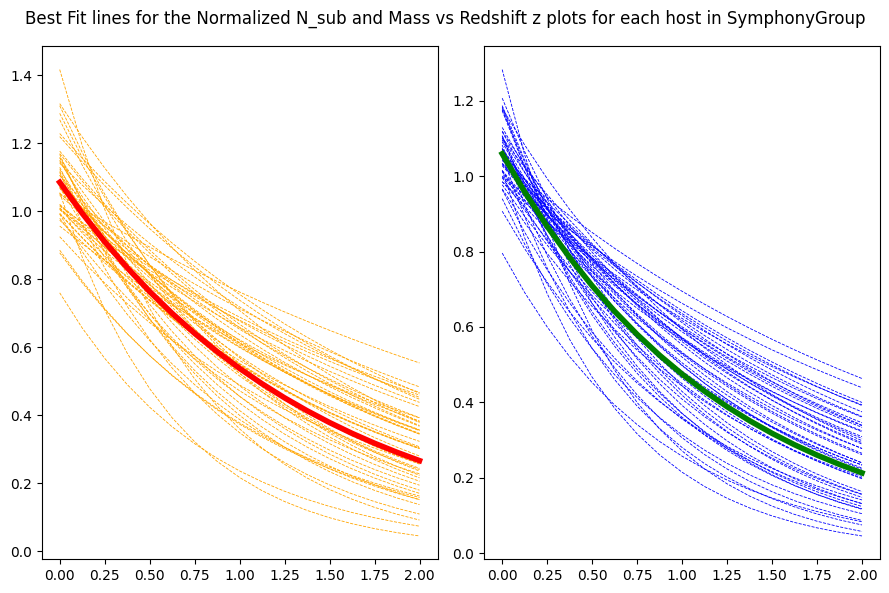

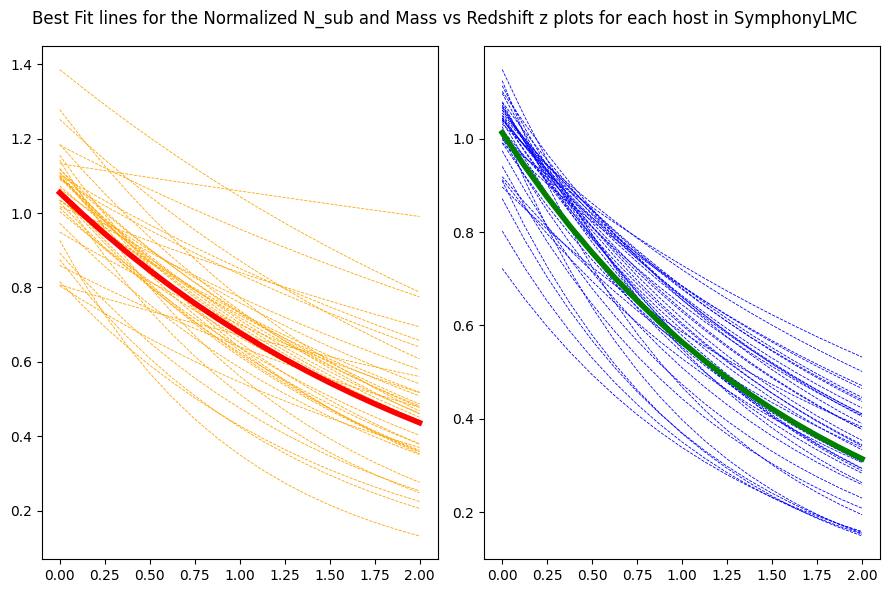

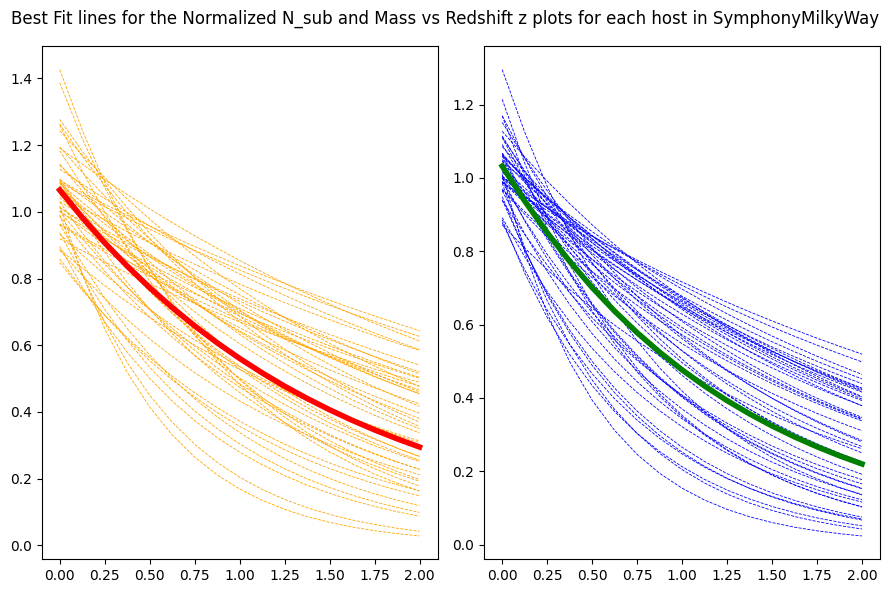

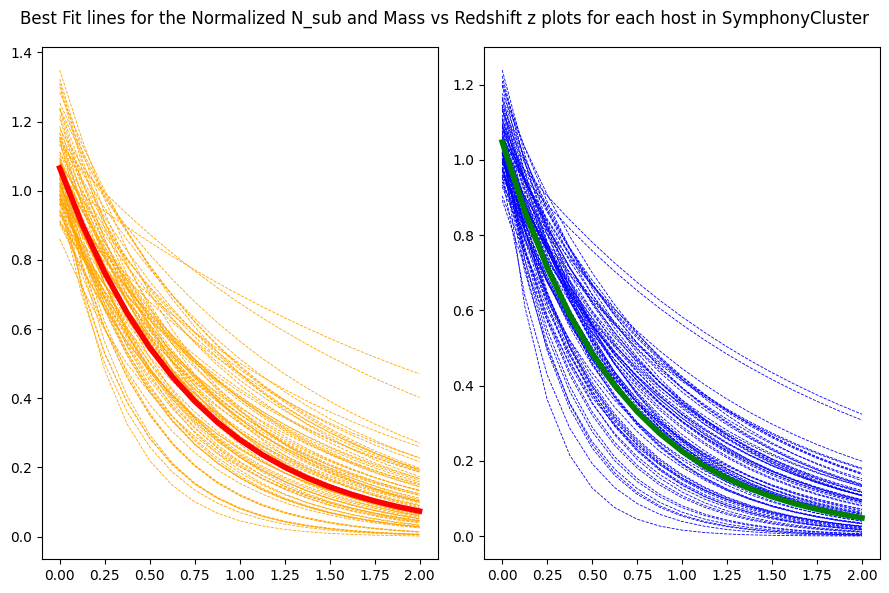

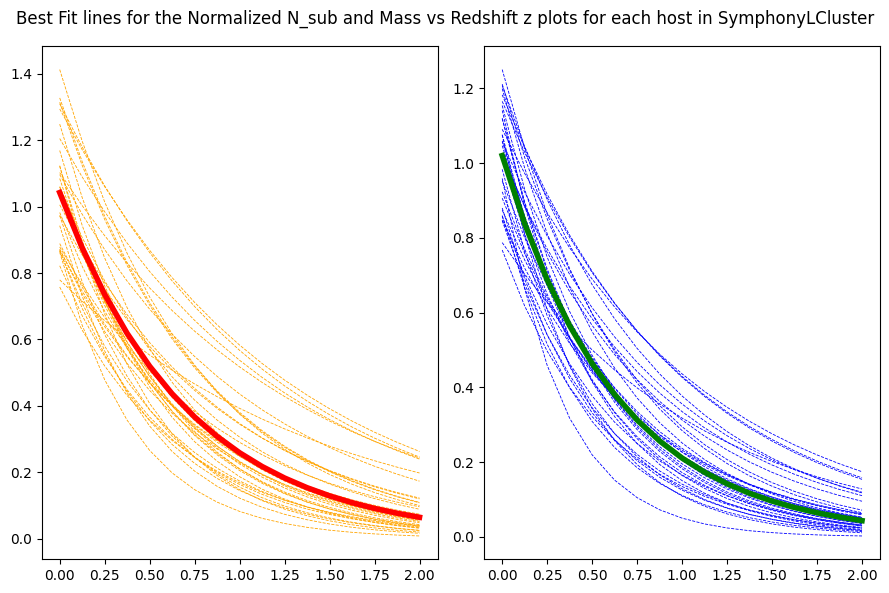

In [51]:

# for every suite plot distribution of a and b values for both nsub and mass

def exponential_func(x, a, b):
        return a * np.exp(-b * x)

min_z, max_z, step_z = 0,2,0.125
 
# max number is not included in the arange array. to ensure max z is included, add step_z to max_z 
list_of_z = np.arange(min_z, max_z+step_z, step_z)
# print(list_of_z)

base_dir = "/Users/roxannelai/SymphonySuitesData"
suite_list = ["SymphonyGroup", "SymphonyLMC", "SymphonyMilkyWay", "SymphonyCluster","SymphonyLCluster"]
# list_of_z = [0, 0.1, 0.2, 0.5, 1.0, 1.5, 2.0]

for suite_index,suite_name in enumerate(suite_list):
    
    fig,ax = plt.subplots(1,2, figsize=(9,6))
    
    n_hosts = symlib.n_hosts(suite_name)
        
    # Setup for mass bins
    params = symlib.simulation_parameters(suite_name)
    h100 = params["h100"]
    m_min = params["mp"] / params["h100"] * 300
    m_max = 1e14
    n_bins = 1000
    bins = 10**np.linspace(np.log10(m_min), np.log10(m_max), n_bins + 1)

    all_normalized_halos = []
    all_normalized_masses = []

    all_mass_aopt = []
    all_mass_bopt = []
    all_nsub_aopt = []
    all_nsub_bopt = []
    
    for i_host in range(n_hosts):
    
        sim_dir = symlib.get_host_directory(base_dir, suite_name, i_host)
        scale_factors = symlib.scale_factors(sim_dir)
        h, hist = symlib.read_subhalos(sim_dir)
        total_halos = []
        total_mass_all_z = []

        rho_list = []
        p_list = []
    
        for target_z in list_of_z:
            target_a = 1 / (1 + target_z)
            snapshot_index = np.argmin(np.abs(scale_factors - target_a))

            # Host mass
            host_mass = h["mvir"][0, snapshot_index]
            total_mass = host_mass / h100  # Convert to physical Msun
            total_mass_all_z.append(host_mass)

            # N_sub
            r = np.sqrt(np.sum(h['x'][:, snapshot_index]**2, axis=1))
            host_rvir = h["rvir"][0, snapshot_index]
            ok = h['ok'][:, snapshot_index] & (r < host_rvir)
            # Count subhalos within R_vir (excluding central)
            n_vir, _ = np.histogram(hist["mpeak"][ok][1:], bins=bins)
            total_halos.append(np.sum(n_vir)) # creates a list of a host's numbers over all the redhsifts    
            
        # Normalize all values and append them to respective lists
        mass_z0 = total_mass_all_z[0]
        normalized_masses = [i_mass / mass_z0 for i_mass in total_mass_all_z]
        all_normalized_masses.append(normalized_masses) 
        
        z0_halos = total_halos[0] # corresponds to the [0] item in the z list which the total_halos list iterates over
        normalized_halos = [i_halo / z0_halos for i_halo in total_halos] # creates a list of a host's normalized masses over all the redshifts
        all_normalized_halos.append(normalized_halos) # add to the list of lists

        # find + plot line of best fit for each host
        nsub_params, nsub_covariance = scipy.optimize.curve_fit(exponential_func, list_of_z, normalized_halos) # third value input a list, not list of lists
        nsub_aopt, nsub_bopt = nsub_params
        ax[0].plot(
            list_of_z,
            exponential_func(list_of_z, nsub_aopt, nsub_bopt),
            color="orange",
            linestyle="--",
            linewidth = 0.6
            )

        all_nsub_aopt.append(nsub_aopt)
        all_nsub_bopt.append(nsub_bopt)
        

        m_params, m_covariance = scipy.optimize.curve_fit(exponential_func, list_of_z, normalized_masses)
        m_aopt, m_bopt = m_params
        ax[1].plot(
            list_of_z,
            exponential_func(list_of_z, m_aopt, m_bopt),
            color="blue",
            linestyle="--",
            linewidth = 0.6
            )
        all_mass_aopt.append(m_aopt)
        all_mass_bopt.append(m_bopt)


    # find averages for a and b 
    all_nsub_aopt = np.array(all_nsub_aopt)
    avg_nsub_aopt = np.mean(all_nsub_aopt)
    
    all_nsub_bopt = np.array(all_nsub_bopt)
    avg_nsub_bopt = np.mean(all_nsub_bopt)
    
    all_mass_aopt = np.array(all_mass_aopt)
    avg_mass_aopt = np.mean(all_mass_aopt)
    
    all_mass_bopt = np.array(all_mass_bopt)
    avg_mass_bopt = np.mean(all_mass_bopt)
        
    # plot average lines on the nsub plot and mass plot
    ax[0].plot(list_of_z, # the nsub plot
            exponential_func(list_of_z, avg_nsub_aopt, avg_nsub_bopt),
            color="red",
            linestyle="-",
            linewidth = 4,
            label = "Nsub Average Best Fit Line"   
            ) 

    ax[1].plot(list_of_z, # the mass plot
            exponential_func(list_of_z, avg_mass_aopt, avg_mass_bopt),
            color="green",
            linestyle="-",
            linewidth = 4,
            label = "Mass Avgerage Best Fit Line"
            )

    fig.suptitle("Best Fit lines for the Normalized N_sub and Mass vs Redshift z plots for each host in " + suite_name) 
    plt.tight_layout()
    plt.show()





In [ ]:



 # Host mass
        host_mass = h["mvir"][0, snapshot_index]

        # Subhalo filtering (not the host, within R_vir, still alive)
        #r = np.sqrt(np.sum(h["x"][:, snapshot_index]**2, axis=1))
        #rvir = h["rvir"][0, snapshot_index]
        #is_subhalo = np.arange(len(h["ok"])) > 0
        #ok = h["ok"][:, snapshot_index] & is_subhalo & (r < rvir)

        subhalo_mass = np.sum(h["mvir"][ok, snapshot_index])
        total_mass = (host_mass + subhalo_mass) / h100  # Convert to physical Msun

        total_mass_all_z.append(total_mass)

